<font size=6>Predicting Future Sales</font>  
<font size=5>A feature engineering based on an economical and financial approach</font>


This competition is the final project of a data science course. The goal is to predict the sales of items in a selection of shops of a Russian tech company. There no predictions in this kernel. Only data processing.  
I've seen several interesting notebooks about data cleaning et feature engineering. But I have the feeling that there are some mistakes on some points. Some calculations don't seem logical from an economical point of view.  
For example, I base average price calculation on the division of the sum of incomes by the sum of sales count. If you sell 8 products at 10 USD, 1 product at 15 USD and 1 product at 20 USD, the average price isn't 15 USD (as often calculated in the notebooks I have read) but 11.5 USD. Average sales count is the sum of sales count divided by the number of sales.  
I also try to define smart features from an economic point of view, as the change in price or the change in sales from one month to another.  
I have detected leakage features in several notebooks. One shouldn't use a ratio with the average of a value on all periods, as you don't know this average until the last month. So on month 0, 1, 2... you didn't know this average and using it is like using future data.  
Finally, I think some notebooks fail in creating rows for month when a shop no more sells an item it has sold before. For example, if a shop starts selling an item from month 6 to month 15, then it no more sells this item at month 16, 17 and 18, before resuming the sale at month 19, I should have rows for this item at month 16, 17 and 18 with a sales count of 0 and a price to define. I choose to define this price as the average price of sales of the last month when this item was sold by this shop (in my example, the average price of this item in this shop at month 15). So I fill missing prices forward and missing sales whith a 0 quantity.  
I have been inspired by some interesting notebooks like :
- https://www.kaggle.com/gordotron85/future-sales-xgboost-top-3#Modelling ;
- https://www.kaggle.com/dlarionov/feature-engineering-xgboost ;
- https://www.kaggle.com/kyakovlev/1st-place-solution-part-1-hands-on-data

I run the following steps :
- Exploring and cleaning data ;
- Grouping data by month ;
- Analysing the data. I think I can push deeper the analysis. I'll do that in a future version of this notebook ;
- Feature engineering. I create a lot of features. Some features are useful for some models. Other features are useful for ohter models. I won't use the same features for a SARIMAX model or for a XGBoost Model ;  
- Testing the distribution of features, in case I want to use them with some models that imply some distribution hypotheses.

**Table of contents**  
[Notebook setup](#0)  
[1. Exploration and cleaning](#100)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[1.1. Checking duplicates](#101)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[1.2. Putting all data together](#102)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[1.3. Checking missing values](#103)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[1.4. Checking numeric values](#104)  
[2. Grouping data by month](#200)  
[3. Analysis](#300)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.1. Total sales](#301)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.2. Sales by shop](#302)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.3. Change of sales by shop over time](#303)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.4. Sales by category](#304)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.5. Concentration analysis](#305)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.6. Sales by item](#306)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.7. Items and shops to predict](#307)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[3.8. Shops : more in-depth analysis](#308)  
[4. Feature Engineering](#400)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.1. Creation of the matrix](#401)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.2. Qualitative data](#402)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.3. Items and shops to predict](#403)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.4. Features related to the date](#404)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.5. Data related to the pair shop / item](#405)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.6. Global values](#406)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.7. Data by item](#407)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.8. Data by shop](#408)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.9. Data by category](#409)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.10. Data by main category](#410)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.11. Data by pair shop/category](#411)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.12. Data by pair shop/main category](#412)  
&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;[4.13. Lags](#413)

v2 : addition of the table of contents  
v3 : data with lags are split in several csv files (+ a little adjustment)  
v4 : changes in lags calculation ; addition of a feature on category sales changes from month to month  
v5 : move some lags from "relative" to "leakage" flag ; improve data saving : fillna and remove first months of data (when lags are #na due to no prior data) before saving  
v6 : fix a bug on category lags calculation ; no more save the leakage features  
v7 : add a filter on negative item_cnt_month if the option skip_negative_counts is set to false ; add a new expanding mean calculation to get relative features without leakage ; add the month when an item was sold for the last time ; make code more PEP8 compliant ;-)  
v8 : a bit more analysis ; a few more relative features ; a change in the order of features creation and saving (csv files) so that the RAM can handle it all with the new features
v9 : None  
v10 : Quantity changes are modified to percentage to be in line with other change features  
v12 : handling changes with np.inf value

---
<a id="0"></a>
# <font color=blue>Notebook set-up</font>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
import seaborn as sns
import os
import re
import datetime
from calendar import Calendar
from itertools import product
import gc

**Graphs set-up**

In [2]:
# changes in matplotlib default parameters
def mydefault_plt_parameters(figsize=(12, 8), mult_param=1.0):
    plt.rcParams['figure.figsize'] = figsize
    plt.rcParams['font.size'] = np.around(18 * mult_param)
    plt.rcParams['axes.titlepad'] = np.around(20 * mult_param)
    plt.rcParams['axes.labelpad'] = np.around(15 * mult_param)
    plt.rcParams['figure.titleweight'] = 'bold'
    plt.rcParams['axes.titleweight'] = 'bold'
    plt.rcParams['legend.framealpha'] = 1
    plt.rcParams['legend.facecolor'] = (0.95,0.95,0.95)
    plt.rcParams['legend.edgecolor'] = (0.95,0.95,0.95)
    plt.rcParams['savefig.orientation'] = 'landscape'
    plt.rcParams['savefig.dpi'] = 300
    plt.rcParams['savefig.bbox'] = 'tight'

In [3]:
def set_sns_colors(is_mono=False, color_palette=None,
                   ncolors=None, desat=None):
    if color_palette is None:
        if is_mono:
            sns.set_palette(sns.light_palette("navy"))
        else:
            sns.set_palette("Set2")
    else:
        sns.set_palette(color_palette, ncolors, desat)
    return sns.color_palette()

In [4]:
sns.set_style("whitegrid")
list_colors = set_sns_colors()
mydefault_plt_parameters()

**Data options**

SKIP_NEGATIVE_COUNTS : if true, I delete all item_cnt_day with negative values. If false by default : returned products decrease the number of sales. Ddefault value is False. I take care of special cases when the item_cnt_month is negative since v7.  
SKIP_NEGATIVE_SHOPITEM_SENIORITY : if true, I delete all lines where seniority of the pair shop/item is negative. Set to true by default : data is not kept if the item has never been sold before by the shop.  
KEEP_CATEGORY_DATA : if true, I add data by category and data by pair shop/category. Set to true by default : I use data by category.  
KEEP_MAIN_CATEGORY_DATA : if false, I don't keep data by main category and data by pair shop/main category. Set to true by default : I use data by main category.  
LAGS_ON_RAW_VALUES = if true, I calculate the lag values on raw data (true by default).  
LAGS_ON_CHANGE_VALUES = if true, I calculate the lag values on changes (true by default).  
LAGS_ON_RELATIVE_VALUES = if true, I calculate the lag values on relative values (true by default).  
LAGS_EXTENDED_PERIODS : if false, I calculate lags for 1, 2 and 3 months. Set to true by default : I calculate lags for 1, 2, 3, 6 and 12 months. The extended periods are applied only to raw values, to deal with RAM capacity.

In [5]:
SKIP_NEGATIVE_COUNTS = False
SKIP_NEGATIVE_SHOPITEM_SENIORITY = True
KEEP_CATEGORY_DATA = True
KEEP_MAIN_CATEGORY_DATA = True
LAGS_ON_RAW_VALUES = True
LAGS_ON_CHANGE_VALUES = True
LAGS_ON_RELATIVE_VALUES = True
LAGS_EXTENDED_PERIODS = True

**Notebook functions**

In [6]:
def downcast_series(df_series):
    if df_series.dtype == "float64":
        df_series = df_series.astype(np.float32)
    if df_series.dtype in ["int64", "int32"]:
        df_series = df_series.astype(np.int16)
    return df_series

---
<a id="100"></a>

# <font color=blue>1. Exploration and cleaning</font>

In [7]:
folder = "../input/competitive-data-science-predict-future-sales/"
filename = folder + "sales_train.csv"
sales = pd.read_csv(filename)
filename = folder + "test.csv"
topredict = pd.read_csv(filename)

folder = "../input/future-sales-in-english/"
filename = folder + "shops_english.csv"
shops = pd.read_csv(filename)
filename = folder + "items_english.csv"
items = pd.read_csv(filename)
filename = folder + "item_categories_english.csv"
categories = pd.read_csv(filename)

In [8]:
if SKIP_NEGATIVE_COUNTS:
    sales = sales[sales.item_cnt_day >= 0]

<a id="101"></a>
## 1.1. Checking duplicates

### 1.1.1. Items

In [9]:
print("Number of rows : {:,.0f}".format(len(items)))
items.head()

Number of rows : 22,170


,item_name,item_id,item_category_id
0,IN THE POWER OF OBSESSION (LAYER ) D,0,40
1,ABBYY FineReader 12 Professional Edition Full ...,1,76
2,IN THE GLORY (UNV) D,2,40
3,Blue Wave (Univ) D,3,40
4,BOX (GLASS) D,4,40


**Duplicates on item_name**

I check duplicates on the item_name, that belong to the same category.

In [10]:
print("number of duplicates : {}".format(items.duplicated(
    subset=["item_name", "item_category_id"]).sum()))

number of duplicates : 52


In [11]:
check = items[items.duplicated(
    subset=["item_name", "item_category_id"], keep=False)].copy()
check.sort_values(by=["item_name", "item_id"], inplace=True)
check

,item_name,item_id,item_category_id
19235,(DVD BD),19235,40
19763,(DVD BD),19763,40
17247,APPLAUSE,17247,40
17465,APPLAUSE,17465,40
10999,APPLICATION GENTLES (region),10999,40
...,...,...,...
11069,WHITE,11069,40
13011,WHO I AM,13011,40
13012,WHO I AM,13012,40
10206,Witch 3 Wild Hunting Add-on Kit [PC Digital ve...,10206,31


I check if some item_id have to be predicted while others are not to predict, among duplicates.

In [12]:
list_id = list(topredict.item_id.unique())
for idx in check.index:
    id = check.loc[idx, "item_id"]
    check.loc[idx, "to_predict"] = id in list_id
check

,item_name,item_id,item_category_id,to_predict
19235,(DVD BD),19235,40,False
19763,(DVD BD),19763,40,False
17247,APPLAUSE,17247,40,False
17465,APPLAUSE,17465,40,False
10999,APPLICATION GENTLES (region),10999,40,False
...,...,...,...,...
11069,WHITE,11069,40,True
13011,WHO I AM,13011,40,True
13012,WHO I AM,13012,40,False
10206,Witch 3 Wild Hunting Add-on Kit [PC Digital ve...,10206,31,True


Different cases :
- none of the duplicated items are to predict : I keep the item_id of my choice (the largest id as it may be the more recent one) and I add the sales of the other item_id ;
- only one of the duplicated items is to predict : I remove other item_id items and move their sales to the item to predict.
- two or more of the duplicated items are to predict : I must keep all items.

In [13]:
def change_item_id(idxpredict, indexes):
    global items
    global sales
    to_id = check.loc[idxpredict[0], "item_id"]
    for idx in indexes:
        if idx not in idxpredict:
            from_id = check.loc[idx, "item_id"]
            idx_to_change = items[items.item_id == from_id].index
            items.loc[idx_to_change, "item_id"] = to_id
            idx_to_change = sales[sales.item_id == from_id].index
            sales.loc[idx_to_change, "item_id"] = to_id

In [14]:
ref_name = ""
list_idx = []
list_topredict = []
for idx in check.index:
    if ref_name != check.loc[idx, "item_name"]:
        if (len(list_topredict) == 0) & (ref_name != ""):
            list_topredict = [list_idx[-1]]
        if len(list_topredict) == 1:
            change_item_id(list_topredict, list_idx)
        ref_name = check.loc[idx, "item_name"]
        list_idx = []
        list_topredict = []
    list_idx.append(idx)
    if check.loc[idx, "to_predict"]:
        list_topredict.append(idx)
# last round for last pair
if (len(list_topredict) == 0) & (ref_name != ""):
    list_topredict = list_idx[-1]
if len(list_topredict) == 1:
    change_item_id(check, list_topredict, list_idx)

In [15]:
del check
gc.collect()
items = items.drop_duplicates()
print("Number of rows : {:,.0f}".format(len(items)))

Number of rows : 22,120


### 1.1.2. Categories

In [16]:
print("Number of rows : {:,.0f}".format(len(categories)))
categories.head()

Number of rows : 84


,item_category_name,item_category_id
0,PC - Headphone headsets,0
1,Accessories - PS2,1
2,Accessories - PS3,2
3,Accessories - PS4,3
4,Accessories - PSP,4


I check duplicates on the category name.

In [17]:
print("number of duplicates : {}".format(
    categories.duplicated(subset=["item_category_name"]).sum()))

number of duplicates : 0


There's no duplicate. But I see that I can group categories by main category. As I have only 84 rows, I can easily take a deeper look at the categories.

In [18]:
list(categories.item_category_name)

['PC - Headphone headsets',
 'Accessories - PS2',
 'Accessories - PS3',
 'Accessories - PS4',
 'Accessories - PSP',
 'Accessories - PSVita',
 'Accessories - XBOX 360',
 'Accessories - XBOX ONE',
 'Tickets (Number)',
 'Product Delivery',
 'Game consoles - PS2',
 'Game consoles - PS3',
 'Game consoles - PS4',
 'Game consoles - PSP',
 'Game consoles - PSVita',
 'Game consoles - XBOX 360',
 'Game consoles - XBOX ONE',
 'Game consoles - Others',
 'Games - PS2',
 'Games - PS3',
 'Games - PS4',
 'Games - PSP',
 'Games - PSVita',
 'Games - XBOX 360',
 'Games - XBOX ONE',
 'Games - Game Accessories',
 'Android Games - Number',
 'MAC Games - Numbers',
 'PC Games - Additional Editions',
 'PC Games - Collection Editions',
 'PC Games - Standard Editions',
 'PC Games - Number',
 'Payment cards (Cinema Music Games)',
 'Payment cards - Live',
 'Payment cards - Live (Number)',
 'Payment cards - PSN',
 'Payment cards - Windows (Number)',
 'Movie - Blu-Ray',
 'Movie - Blu-Ray 3D',
 'Movie - Blu-Ray 4K',


Several actions to take :  
1. create a main category feature : allmost all category names are composed according to the same naming scheme : main category name ; hyphen ; category name.  
2. change 6 category names, so that they have the same naming scheme as others.  
3. check if the main categories "games" and "game consoles" are duplicates.

**Create the "main category" feature**

In [19]:
categories.loc[[8, 9, 32, 79, 81, 82, 83], "item_category_name"]

8                       Tickets (Number)
9                       Product Delivery
32    Payment cards (Cinema Music Games)
79                             Service .
81                   Clean media (spike)
82          Clean media (piece by piece)
83                             Batteries
Name: item_category_name, dtype: object

In [20]:
categories.loc[[8, 9, 32, 79, 81, 82, 83], "item_category_name"] = \
    ["Service - Tickets (Number)",
     "Service - Product Delivery",
     "Payment cards - Cinema Music Games",
     "Service - Other",
     "Service - Clean media (spike)",
     "Service - Clean media (piece by piece)",
     "Batteries - Batteries"]

In [21]:
categories["main_category"] = \
    [c[0].strip()
     for c in categories.item_category_name.str.split("-")]

In [22]:
categories.head()

,item_category_name,item_category_id,main_category
0,PC - Headphone headsets,0,PC
1,Accessories - PS2,1,Accessories
2,Accessories - PS3,2,Accessories
3,Accessories - PS4,3,Accessories
4,Accessories - PSP,4,Accessories


**Check if "games" and "game consoles" main categories are duplicates**

In [23]:
cat_consoles = list(
    categories[categories.main_category == "Game consoles"].\
    item_category_id)
cat_games = list(
    categories[categories.main_category == "Games"].\
    item_category_id)
list_consoles = \
    items[np.isin(items.item_category_id, cat_consoles)]\
    [["item_id", "item_name"]]
list_games = \
    items[np.isin(items.item_category_id, cat_games)]\
    [["item_id", "item_name"]]

In [24]:
list_consoles.head(10)

,item_id,item_name
4860,4860,Microsoft Xbox 360 250GB (RKH 00011)
4861,4861,Microsoft Xbox 360 4GB (RKB 00011)
6664,6664,Sony PS Vita 3G WiFi Black Rus (PCH 1108ZA01)
6665,6665,Sony PS Vita WiFi Black Rus (PCH 1008ZA01)
6666,6666,Sony PSP Ice White (PSP E1008 Rus)
6667,6667,Sony PSP Slim Base Pack Black (PSP 3008 Rus)
6668,6668,Sony PSP Slim Base Pack Black (PSP E1008 Rus)
6669,6669,Sony PlayStation 2 (SCPH 77008)
6670,6670,Sony PlayStation 3 (120 Gb) Black Rus (CECH 20...
6671,6671,Sony PlayStation 3 Slim (160 Gb) Black Rus (CE...


In [25]:
list_games.head(10)

,item_id,item_name
27,27,007 Legends [PS3 Russian version]
29,29,007 Legends [Xbox 360 Russian version]
948,948,2014 FIFA World Cup [PS3 English version]
949,949,2014 FIFA World Cup [Xbox 360 English version]
950,950,2014 FIFA World Cup Champion s Edition [PS3 En...
951,951,2014 FIFA World Cup Champion s Edition [Xbox 3...
1242,1242,ACE COMBAT Assault Horizon Limited Edition [Xb...
1347,1347,Ace Combat Joint Assault (Essentials) [PSP Rus...
1348,1348,Ace Combat Joint Assault [PSP Russian document...
1358,1358,Adidas miCoach (MS Kinect only) [Xbox 360 Engl...


Games and game consoles main categories are different.

In [26]:
del list_consoles
del list_games
gc.collect()

71

### 1.1.3. Shops

In [27]:
print("Number of rows : {:,.0f}".format(len(shops)))
shops.head()

Number of rows : 60


,shop_name,shop_id
0,Yakutsk Ordzhonikidze 56 francs,0
1,Yakutsk shopping center Central franc,1
2,Adygeya shopping center Mega,2
3,Balashikha shopping mall Oktyabr-Kinomir,3
4,Volga shopping center Volga Mall,4


In [28]:
print("number of duplicates : {}".format(shops.duplicated().sum()))

number of duplicates : 0


There's no duplicate.  
Looking at the names, it seems the shop Name can be split in 3 parts : City, Shop Type (shopping center, shopping mall, maybe others), Name or Address of the Shop. As there is only 60 shops, I have a closer look at the names.

In [29]:
list(shops.shop_name)

['Yakutsk Ordzhonikidze 56 francs',
 'Yakutsk shopping center Central franc',
 'Adygeya shopping center Mega',
 'Balashikha shopping mall Oktyabr-Kinomir',
 'Volga shopping center Volga Mall',
 'Vologda Shopping and Entertainment Center Marmalade',
 'Voronezh (Plekhanovskaya 13)',
 'Voronezh shopping mall Maximir',
 'Voronezh Shopping and Entertainment Center City-Park Grad',
 'Itinerant Trade',
 'Zhukovsky Chkalov Street 39m',
 'Zhukovsky St. Chkalova 39mÃ‚Â²',
 'Online store of emergency',
 'Kazan Behetle shopping center',
 'Kazan shopping center Park House II',
 'Kaluga shopping mall XXI century',
 'Kolomna shopping center Rio',
 'Krasnoyarsk shopping center Take off Plaza',
 'Krasnoyarsk shopping center June',
 'Kursk shopping center Pushkinsky',
 'Moscow Sale',
 'Moscow ITRC Afi Mall',
 'Moscow Shop C21',
 'Moscow Budenovsky shopping center (A2 pavilion)',
 'Moscow Budenovsky shopping center (pub K7)',
 'Moscow shopping mall Atrium',
 'Moscow Areal shopping center (Belyaevo)',
 'M

This column needs a deep cleaning. Here is what I notice:  
- I see 7 types of shops : shopping center, shopping mall, shopping and entertainment center, Sale, Shop, ITRC, Trade Center ;
- 3 shops without city : Itinerant trade, Online store of emergency, Digital warehouse 1C-Online. 2 are linked to online sales. One is an itinerant shop.
- City Names to change : SPb and St. Petersburg to Saint-Petersburg, to get full name before the first split.  
  
Then, I can create the 2 columns shop_city and shop_type

In [30]:
shops.loc[[9, 12, 55], "shop_name"]

9                 Itinerant Trade
12      Online store of emergency
55    Digital warehouse 1C-Online
Name: shop_name, dtype: object

In [31]:
shops.loc[[9, 12, 55], "shop_name"] = ["No-city {}".format(
    shops.loc[i,"shop_name"]) for i in [9, 12, 55]]
shops.loc[[9, 12, 55], "shop_name"]

9                 No-city Itinerant Trade
12      No-city Online store of emergency
55    No-city Digital warehouse 1C-Online
Name: shop_name, dtype: object

In [32]:
shops.loc[42, "shop_name"] = re.sub(
    "St. Petersburg", "Saint-Petersburg", shops.loc[42, "shop_name"])
shops.loc[43, "shop_name"] = re.sub(
    "SPb", "Saint-Petersburg", shops.loc[43, "shop_name"])
shops.loc[[42, 43], "shop_name"]

42    Saint-Petersburg shopping center Nevsky Center
43          Saint-Petersburg shopping center Sennaya
Name: shop_name, dtype: object

In [33]:
shops["shop_city"] = [s[0].strip()
                      for s in shops.shop_name.str.split()]
inter_other = [re.sub(c, "", n).strip()
               for c, n in zip(shops.shop_city, shops.shop_name)]
list_types = ["shopping center", "shopping mall",
              "shopping and entertainment center", "sale",
              "shop", "ITRC", "trade center", "itinerant", "online"]
inter_type = []
inter_address = []
for shop_other in inter_other:
    type_found = False
    for t in list_types:
        if re.search(t + r"\b", shop_other, flags=re.IGNORECASE):
            inter_type.append(t)
            inter_address.append(re.sub(
                t, "", shop_other, flags=re.IGNORECASE).strip())
            type_found = True
    if not type_found:
        inter_type.append("Other")
        inter_address.append(shop_other)
shops["shop_type"] = inter_type
shops["shop_address"] = inter_address

In [34]:
shops.sort_values(by=["shop_city", "shop_type", "shop_id"])


,shop_name,shop_id,shop_city,shop_type,shop_address
2,Adygeya shopping center Mega,2,Adygeya,shopping center,Mega
3,Balashikha shopping mall Oktyabr-Kinomir,3,Balashikha,shopping mall,Oktyabr-Kinomir
56,Chekhov Shopping and Entertainment Center Carn...,56,Chekhov,shopping and entertainment center,Carnival
15,Kaluga shopping mall XXI century,15,Kaluga,shopping mall,XXI century
13,Kazan Behetle shopping center,13,Kazan,shopping center,Behetle
14,Kazan shopping center Park House II,14,Kazan,shopping center,Park House II
54,Khimki shopping center Mega,54,Khimki,shopping center,Mega
16,Kolomna shopping center Rio,16,Kolomna,shopping center,Rio
17,Krasnoyarsk shopping center Take off Plaza,17,Krasnoyarsk,shopping center,Take off Plaza
18,Krasnoyarsk shopping center June,18,Krasnoyarsk,shopping center,June


I check if the following shops are duplicates :
- shops number 23 and 24 in Moscow ;
- shops number 39 to 41 in Rostov : Mega, Horizon, Mega Horizon ?
- shops number 0 and 57 in Yakutsk ;
- shops number 1 and 58 in Yakutsk ;
- shops number 10 and 11 in Zhukovsky.

First, I check if some item_id have to be predicted while others are not to predict.  
Then, if necessary, I'll check if those pairs of shops sell the same items and the same time.

In [35]:
check = pd.DataFrame(
    [[23, 24], [39, 40, 41], [0, 57], [1, 58], [10, 11]],
    columns=["shop_1", "shop_2", "shop_3"])
for idx in check.index:
    for col in [1, 2, 3]:
        id = check.loc[idx, "shop_{}".format(col)]
        if not np.isnan(id):
            check.loc[idx, "name_{}".format(col)] = \
                shops[shops.shop_id == id].shop_address.values[0]
        else:
            check.loc[idx, "name_{}".format(col)] = ""
check

,shop_1,shop_2,shop_3,name_1,name_2,name_3
0,23,24,NaN,Budenovsky (A2 pavilion),Budenovsky (pub K7),
1,39,40,41.0,Horizon,MegaCenter Horizon Island,Mega
2,0,57,NaN,Ordzhonikidze 56 francs,Ordzhonikidze 56,
3,1,58,NaN,Central franc,Central,
4,10,11,NaN,Chkalov Street 39m,St. Chkalova 39mÃ‚Â²,


In [36]:
list_id = list(topredict.shop_id.unique())
for idx in check.index:
    for col in [1, 2, 3]:
        id = check.loc[idx, "shop_{}".format(col)]
        check.loc[idx, "to_predict_{}".format(col)] = id in list_id
check

,shop_1,shop_2,shop_3,name_1,name_2,name_3,to_predict_1,to_predict_2,to_predict_3
0,23,24,NaN,Budenovsky (A2 pavilion),Budenovsky (pub K7),,False,True,False
1,39,40,41.0,Horizon,MegaCenter Horizon Island,Mega,True,False,True
2,0,57,NaN,Ordzhonikidze 56 francs,Ordzhonikidze 56,,False,True,False
3,1,58,NaN,Central franc,Central,,False,True,False
4,10,11,NaN,Chkalov Street 39m,St. Chkalova 39mÃ‚Â²,,True,False,False


**Shops 23 and 24**

In [37]:
def check_shops_dates(shop1_id, shop2_id):
    shop1_dates = sales[sales.shop_id == shop1_id].date_block_num
    shop2_dates = sales[sales.shop_id == shop2_id].date_block_num
    check_dates = pd.DataFrame(
        {"shop1": [shop1_dates.min(), shop1_dates.max()],
         "shop2": [shop2_dates.min(), shop2_dates.max()]},
        index=["first date", "last date"])
    return check_dates

In [38]:
check_shops_dates(23, 24)

,shop1,shop2
first date,0,0
last date,3,33


Those two shops don't seem to be duplicates. They have operated at the same time. One has closed in month n°3.

**Shops 39, 40 and 41**

In [39]:
check_shops_dates(39, 40)

,shop1,shop2
first date,14,14
last date,33,24


In [40]:
check_shops_dates(40, 41)

,shop1,shop2
first date,14,0
last date,24,33


Those three shops don't seem to be duplicates. They have operated at the same time. Shop nnumber 40 has closed in month n°24.  
I must check if it's not a delivery point for shop 39 (same opening date) that has closed. In this case, I can add them up. I check the changes in income of the three shops.

In [41]:
check = sales[np.isin(sales.shop_id, [39, 40, 41])].copy()
check["income"] = check.item_price * check.item_cnt_day
check = check[["date_block_num", "shop_id", "income"]].\
    groupby(["date_block_num", "shop_id"]).sum()
check.reset_index(inplace=True)

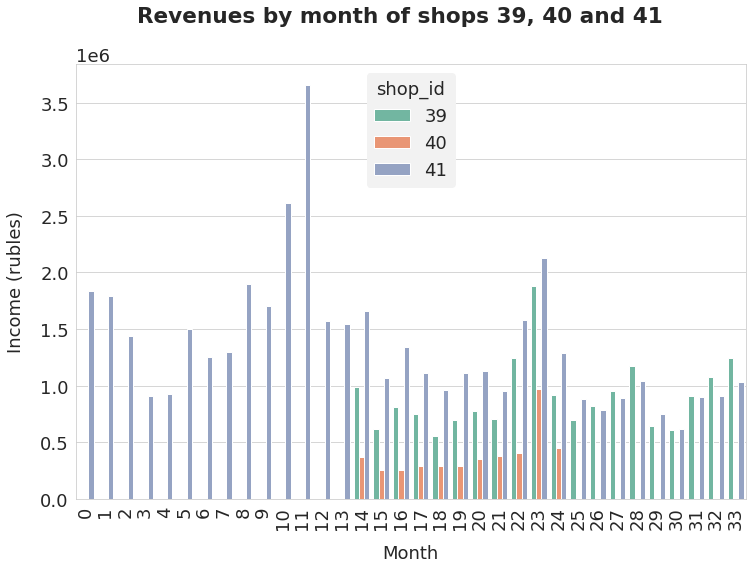

In [42]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Revenues by month of shops 39, 40 and 41")
sns.barplot(x=check.date_block_num, y=check.income,
            hue=check.shop_id, ax=ax)
ax.tick_params(axis='x', rotation=90)
ax.set_xlabel("Month")
ax.set_ylabel("Income (rubles)")
plt.show()

In [43]:
check[check.date_block_num < 14][["shop_id", "income"]].\
    groupby("shop_id").mean()

,income
shop_id,
41,1.710585e+06


In [44]:
check[(check.date_block_num >= 14) & (check.date_block_num <= 24)]\
    [["shop_id", "income"]].groupby("shop_id").mean()

,income
shop_id,
39,9.045922e+05
40,3.903261e+05
41,1.302549e+06


In [45]:
check[check.date_block_num > 24][["shop_id", "income"]].\
    groupby("shop_id").mean()

,income
shop_id,
39,904708.555556
41,868530.055556


Income of shop 39 stay stable and income of shop 41 decrease when shop 40 closes. We can't say for sure that shop 40 has to be added to shop 39. I don't merge them.

**Shops 0 and 57**

In [46]:
check_shops_dates(0, 57)

,shop1,shop2
first date,0,2
last date,1,33


Those two shops seem to be duplicates. They haven't operated at the same time. Shop 57 begun just after shop 0 closed. So I remove shop n°0 and replace its sales by shop n°57.

In [47]:
def remove_shop(id_to_keep, id_to_remove):
    global shops
    global sales
    idx_to_change = sales[sales.shop_id == id_to_remove].index
    sales.loc[idx_to_change, "shop_id"] = id_to_keep
    shops = shops[shops.shop_id != id_to_remove]

In [48]:
remove_shop(id_to_keep=57, id_to_remove=0)

**Shops 1 and 58**

In [49]:
check_shops_dates(1, 58)

,shop1,shop2
first date,0,2
last date,1,33


Those two shops seem to be duplicates. They haven't operated at the same time. Shop 58 begun just after shop 1 closed. So I remove shop n°1 and replace its sales by shop n°58.

In [50]:
remove_shop(id_to_keep=58, id_to_remove=1)

**Shops 10 and 11**

In [51]:
check_shops_dates(10, 11)

,shop1,shop2
first date,0,25
last date,33,25


In [52]:
sales[(sales.shop_id == 10) & (sales.date_block_num == 25)]

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day


Those two shops seem to be duplicates. Shop n°11 includes sales for only one month. I don't have sales at shop n°10 for this month. Shop n°11 seems to be a mistaping of the name of shop n°11. So, I remove shop n°11 and replace its sales by shop n°10.

In [53]:
remove_shop(id_to_keep=10, id_to_remove=11)

In [54]:
del check
gc.collect()
print("Number of rows : {:,.0f}".format(len(shops)))

Number of rows : 57


### 1.1.4. Sales

In [55]:
print("Number of rows : {:,.0f}".format(len(sales)))
sales.head()

Number of rows : 2,935,849


,date,date_block_num,shop_id,item_id,item_price,item_cnt_day
0,02.01.2013,0,59,22154,999.00,1.0
1,03.01.2013,0,25,2552,899.00,1.0
2,05.01.2013,0,25,2552,899.00,-1.0
3,06.01.2013,0,25,2554,1709.05,1.0
4,15.01.2013,0,25,2555,1099.00,1.0


In [56]:
print("number of duplicates : {}".format(
    sales.duplicated(subset=["date", "shop_id", "item_id"]).sum()))

number of duplicates : 120


In [57]:
check = sales[sales.duplicated(
    subset=["date", "shop_id", "item_id"], keep=False)].copy()
items_to_check = check.item_id.unique()
print("There are {} items with duplicates : {}".\
      format(len(items_to_check), items_to_check))

There are 23 items with duplicates : [12133  9739 12058 19241  2953 14050 20130 15702 10177 15707 15539 15698
 15709 11002  2331  3423 16875 16587  9842 21619  8237  3424  4275]


I think we have two cases :
- full duplicates on initial sales data : we should delete one of them ;
- duplicates on [date, shop_id, item_id] : they are due to different prices for the same good. We should sum the item_cnt_day and calculate the mean item_price.

**Remove duplicates on initial sales data**

I must check full duplicates on initial sales data, because I may have created duplicates by changing references in items.

In [58]:
folder = "../input/competitive-data-science-predict-future-sales/"
filename = folder + "sales_train.csv"
initial_sale_data = pd.read_csv(filename)
print("number of duplicates on initial_data : {}".format(
      initial_sale_data.duplicated().sum()))

number of duplicates on initial_data : 6


In [59]:
idx_to_remove = \
    initial_sale_data[initial_sale_data.duplicated()].index
sales = sales.drop(index=idx_to_remove)

**Sum other duplicated sales**

In [60]:
print("number of remaining duplicates : {}".format(
    sales.duplicated(subset=["date", "shop_id", "item_id"]).sum()))

number of remaining duplicates : 114


In [61]:
check = sales[sales.duplicated(subset=["date", "shop_id", "item_id"],
                               keep=False)].copy()
ref = ["01.01.1999", 0, 0]
idx_ref = 0
sum_price = 0.0
sum_item_cnt = 0
for idx in check.index:
    if (check.loc[idx, "date"] == ref[0])\
        & (check.loc[idx, "shop_id"] == ref[1])\
        & (check.loc[idx, "item_id"] == ref[2]):
        sum_price += check.loc[idx, "item_cnt_day"] * \
            check.loc[idx, "item_price"]
        sum_item_cnt += check.loc[idx, "item_cnt_day"]
        if sum_item_cnt != 0:
            sales.loc[idx_ref, "item_price"] = \
                sum_price / sum_item_cnt
        else:
            sales.loc[idx_ref, "item_price"] = 0
        sales.loc[idx_ref, "item_cnt_day"] = sum_item_cnt
    else:
        idx_ref = idx
        ref = [check.loc[idx, "date"],
               check.loc[idx, "shop_id"],
               check.loc[idx, "item_id"]]
        sum_price = check.loc[idx, "item_cnt_day"] * \
            check.loc[idx, "item_price"]
        sum_item_cnt = check.loc[idx, "item_cnt_day"]

In [62]:
sales = sales.drop_duplicates(subset=["date", "shop_id", "item_id"])

In [63]:
del check
del initial_sale_data
gc.collect()
print("Number of rows : {:,.0f}".format(len(sales)))

Number of rows : 2,935,729


<a id="102"></a>
## 1.2. Putting all data together

In [64]:
data = sales.merge(shops, how="left", on="shop_id")
data = data.merge(items, how="left", on="item_id")
data = data.merge(categories, how="left", on="item_category_id")
data.head()

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,shop_name,shop_city,shop_type,shop_address,item_name,item_category_id,item_category_name,main_category
0,02.01.2013,0,59,22154,999.00,1.0,Yaroslavl shopping center Altair,Yaroslavl,shopping center,Altair,PHENOMENON 2012 (BD),37,Movie - Blu-Ray,Movie
1,03.01.2013,0,25,2552,899.00,1.0,Moscow shopping mall Atrium,Moscow,shopping mall,Atrium,DEEP PURPLE The House Of Blue Light LP,58,Music - Vinyl,Music
2,05.01.2013,0,25,2552,899.00,-1.0,Moscow shopping mall Atrium,Moscow,shopping mall,Atrium,DEEP PURPLE The House Of Blue Light LP,58,Music - Vinyl,Music
3,06.01.2013,0,25,2554,1709.05,1.0,Moscow shopping mall Atrium,Moscow,shopping mall,Atrium,DEEP PURPLE Who Do You Think We Are LP,58,Music - Vinyl,Music
4,15.01.2013,0,25,2555,1099.00,1.0,Moscow shopping mall Atrium,Moscow,shopping mall,Atrium,DEEP PURPLE 30 Very Best Of 2CD (Firm ),56,Music - CD of brand production,Music


<a id="103"></a>
## 1.3. Checking missing values

In [65]:
data.info(null_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 2935729 entries, 0 to 2935728
Data columns (total 14 columns):
 #   Column              Non-Null Count    Dtype  
---  ------              --------------    -----  
 0   date                2935729 non-null  object 
 1   date_block_num      2935729 non-null  int64  
 2   shop_id             2935729 non-null  int64  
 3   item_id             2935729 non-null  int64  
 4   item_price          2935729 non-null  float64
 5   item_cnt_day        2935729 non-null  float64
 6   shop_name           2935729 non-null  object 
 7   shop_city           2935729 non-null  object 
 8   shop_type           2935729 non-null  object 
 9   shop_address        2935729 non-null  object 
 10  item_name           2935729 non-null  object 
 11  item_category_id    2935729 non-null  int64  
 12  item_category_name  2935729 non-null  object 
 13  main_category       2935729 non-null  object 
dtypes: float64(2), int64(4), object(8)
memory usage: 336.0+ MB


There is no missing data. That's a good point.  
The number of rows is coherent with my sales DataFrame.

<a id="104"></a>
## 1.4. Checking numeric values

I take a first general look at the values of the columns.

In [66]:
data.describe(include="all")

,date,date_block_num,shop_id,item_id,item_price,item_cnt_day,shop_name,shop_city,shop_type,shop_address,item_name,item_category_id,item_category_name,main_category
count,2935729,2.935729e+06,2.935729e+06,2.935729e+06,2.935729e+06,2.935729e+06,2935729,2935729,2935729,2935729,2935729,2.935729e+06,2935729,2935729
unique,1034,NaN,NaN,NaN,NaN,NaN,57,29,10,52,21755,NaN,84,16
top,28.12.2013,NaN,NaN,NaN,NaN,NaN,Moscow Semyonovsky shopping center,Moscow,shopping center,Mega,Branded package T-shirt 1C White Interest (34 ...,NaN,Movie - DVD,Movie
freq,9433,NaN,NaN,NaN,NaN,NaN,235624,996602,1803500,297070,31340,NaN,564586,800592
mean,NaN,1.457012e+01,3.330306e+01,1.019466e+04,8.908325e+02,1.242683e+00,NaN,NaN,NaN,NaN,NaN,4.000158e+01,NaN,NaN
std,NaN,9.423021e+00,1.614730e+01,6.322300e+03,1.729816e+03,2.618885e+00,NaN,NaN,NaN,NaN,NaN,1.710094e+01,NaN,NaN
min,NaN,0.000000e+00,2.000000e+00,0.000000e+00,-1.000000e+00,-2.200000e+01,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,NaN
25%,NaN,7.000000e+00,2.200000e+01,4.476000e+03,2.490000e+02,1.000000e+00,NaN,NaN,NaN,NaN,NaN,2.800000e+01,NaN,NaN
50%,NaN,1.400000e+01,3.100000e+01,9.346000e+03,3.990000e+02,1.000000e+00,NaN,NaN,NaN,NaN,NaN,4.000000e+01,NaN,NaN
75%,NaN,2.300000e+01,4.800000e+01,1.568000e+04,9.990000e+02,1.000000e+00,NaN,NaN,NaN,NaN,NaN,5.500000e+01,NaN,NaN


I just need to check date, date_block_num, item_price and item_cnt_day. Other values are already cleaned.

### 1.4.1. Date

The date is in a text format. I create a new column with a date format.

In [67]:
data["day_date"] = pd.to_datetime(data.date, dayfirst=True)
data.day_date.describe()

/opt/conda/lib/python3.7/site-packages/ipykernel_launcher.py:2: FutureWarning: Treating datetime data as categorical rather than numeric in `.describe` is deprecated and will be removed in a future version of pandas. Specify `datetime_is_numeric=True` to silence this warning and adopt the future behavior now.
  


count                 2935729
unique                   1034
top       2013-12-28 00:00:00
freq                     9433
first     2013-01-01 00:00:00
last      2015-10-31 00:00:00
Name: day_date, dtype: object

First date is 01/01/2013 and last date is 31/10/2015  
We have 2 years and 10 months of data, that is 34 months of data.

I remove the date column to keep the day_date column, with a datetime format.

In [68]:
data.drop(columns=["date"], inplace=True)

### 1.4.2. Date block num

In [69]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
data.date_block_num.describe()

count   2935729.00
mean         14.57
std           9.42
min           0.00
25%           7.00
50%          14.00
75%          23.00
max          33.00
Name: date_block_num, dtype: float64

Each date block num matches a single month. As a result, we have 34 different values for the date_block_num. This feature will be useful to group data by month.

I check that each date block num is coherent with calendar months.

In [70]:
check = data[["day_date", "date_block_num"]].copy()
check["month"] = check.day_date.dt.month
check["year"] = check.day_date.dt.year
check = check.groupby("date_block_num").nunique()
print("Minimum of unique values for each date_block_num")
print(check.min())
print("Maximum of unique values for each date_block_num")
print(check.max())

Minimum of unique values for each date_block_num
day_date    28
month        1
year         1
dtype: int64
Maximum of unique values for each date_block_num
day_date    31
month        1
year         1
dtype: int64


Each date block num includes only one month and one year, and has between 28 and 31 days. Nothing to notice.

### 1.4.3. Item Price

In [71]:
data.item_price.describe()

count   2935729.00
mean        890.83
std        1729.82
min          -1.00
25%         249.00
50%         399.00
75%         999.00
max      307980.00
Name: item_price, dtype: float64

I notice a negative price. Prices shouldn't be null or negative. I'll check that.  
The max price seems really large in comparison with the Q3 price. I'll check that.

**Study of high prices**

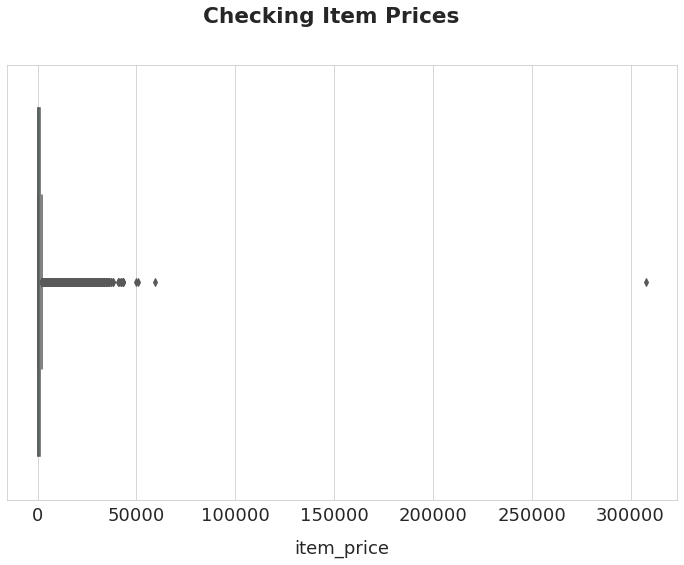

In [72]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Checking Item Prices")
sns.boxplot(x=data.item_price, ax=ax)
plt.show()

The max price seems to be a real outlier. Let's check the product with this price.

In [73]:
data[data.item_price >= 100000]

,date_block_num,shop_id,item_id,item_price,item_cnt_day,shop_name,shop_city,shop_type,shop_address,item_name,item_category_id,item_category_name,main_category,day_date
1163088,11,12,6066,307980.00,1.00,No-city Online store of emergency,No-city,online,store of emergency,Radmin 3 522 faces,75,Programs - For home and office,Programs,2013-12-13


There's only a sale with a price over 100,000 rubles. I check the regular price for this item.

In [74]:
data[data.item_id == 6066]

,date_block_num,shop_id,item_id,item_price,item_cnt_day,shop_name,shop_city,shop_type,shop_address,item_name,item_category_id,item_category_name,main_category,day_date
1163088,11,12,6066,307980.00,1.00,No-city Online store of emergency,No-city,online,store of emergency,Radmin 3 522 faces,75,Programs - For home and office,Programs,2013-12-13


In [75]:
topredict[topredict.item_id == 6066]

,ID,shop_id,item_id


There's only one sale of this product. We don't have to estimate its future sales. I remove this sale from the dataframe.

In [76]:
data = data[data.item_price < 100000]

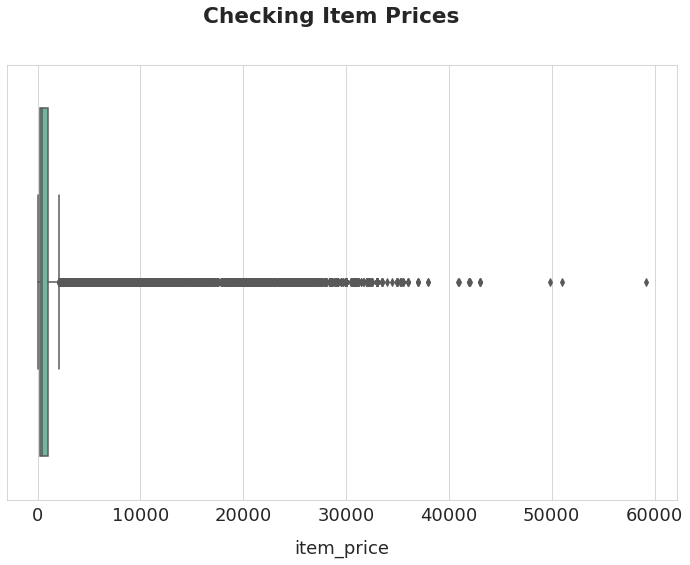

In [77]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Checking Item Prices")
sns.boxplot(x=data.item_price, ax=ax)
plt.show()

I check sales with a price over 40000 rubles.

In [78]:
data[data.item_price >= 40000]

,date_block_num,shop_id,item_id,item_price,item_cnt_day,shop_name,shop_city,shop_type,shop_address,item_name,item_category_id,item_category_name,main_category,day_date
885072,8,12,11365,59200.00,1.00,No-city Online store of emergency,No-city,online,store of emergency,Delivery (EMS),9,Service - Product Delivery,Service,2013-09-17
1006570,9,12,7238,42000.00,1.00,No-city Online store of emergency,No-city,online,store of emergency,UserGate Proxy Firewall 6 X up to 100 sessions,75,Programs - For home and office,Programs,2013-10-24
1488039,14,25,13199,50999.00,1.00,Moscow shopping mall Atrium,Moscow,shopping mall,Atrium,Collection Chess (Lord of the Rings),69,Gifts - Souvenirs,Gifts,2014-03-20
2143794,22,12,14173,40900.00,1.00,No-city Online store of emergency,No-city,online,store of emergency,License 1C Bitrix Site Management Expert,75,Programs - For home and office,Programs,2014-11-20
2327045,24,12,7241,49782.00,1.00,No-city Online store of emergency,No-city,online,store of emergency,UserGate Proxy Firewall 6 X with Entensys URL ...,75,Programs - For home and office,Programs,2015-01-29
2885573,33,42,13403,42990.00,1.00,Saint-Petersburg shopping center Nevsky Center,Saint-Petersburg,shopping center,Nevsky Center,Комплект Microsoft Xbox One 1TB Limited Editio...,16,Game consoles - XBOX ONE,Game consoles,2015-10-23
2892981,33,38,13403,41990.00,1.00,Omsk shopping center Mega,Omsk,shopping center,Mega,Комплект Microsoft Xbox One 1TB Limited Editio...,16,Game consoles - XBOX ONE,Game consoles,2015-10-20
2910035,33,12,13403,41990.00,1.00,No-city Online store of emergency,No-city,online,store of emergency,Комплект Microsoft Xbox One 1TB Limited Editio...,16,Game consoles - XBOX ONE,Game consoles,2015-10-20
2910036,33,12,13403,42990.00,1.00,No-city Online store of emergency,No-city,online,store of emergency,Комплект Microsoft Xbox One 1TB Limited Editio...,16,Game consoles - XBOX ONE,Game consoles,2015-10-29
2913147,33,18,13403,41990.00,1.00,Krasnoyarsk shopping center June,Krasnoyarsk,shopping center,June,Комплект Microsoft Xbox One 1TB Limited Editio...,16,Game consoles - XBOX ONE,Game consoles,2015-10-22


In November 2020, 60,000 rubles is about 800 USD. I check the prices for those items except 13403, which has several sales at a price over 40000 rubles.

**Item 11365**  
A delivery price of 800 dollars seems stellar.

In [79]:
data[data.item_id == 11365].item_price.describe()

count     242.00
mean     1887.57
std      4119.50
min       124.00
25%       618.98
50%      1203.75
75%      1937.50
max     59200.00
Name: item_price, dtype: float64

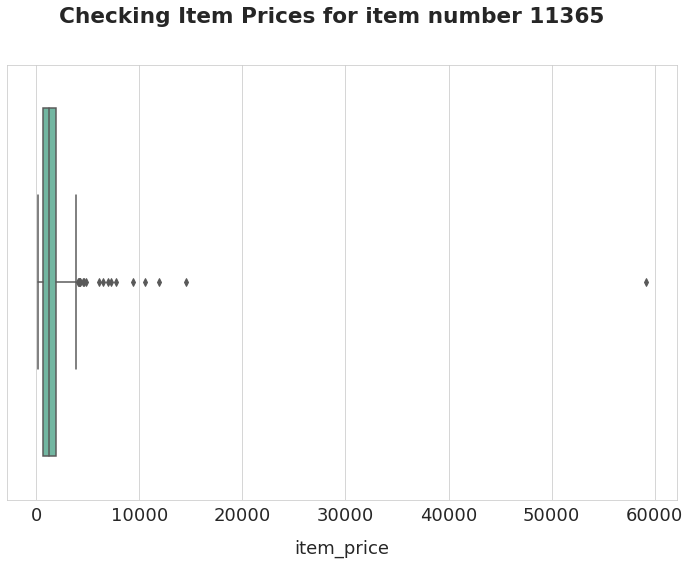

In [80]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Checking Item Prices for item number 11365")
sns.boxplot(x=data[data.item_id == 11365].item_price, ax=ax)
plt.show()

This price of almost 60,000 rubles for delivery seems to be an outlier. I could consider that 2 zeros have been added to the price by mistake. But I have no clue about that, so I'll change this price to median price of this item.

In [81]:
new_price = data[data.item_id == 11365].item_price.median()
idx_to_change = data[(data.item_id == 11365) &
                     (data.item_price > 50000)].index
data.loc[idx_to_change, "item_price"] = new_price

**Item 13199**  
Item_id 13199 is a collection product according to its name. Its price may be ok.

In [82]:
data[data.item_id == 13199].item_price.describe()

count       1.00
mean    50999.00
std          nan
min     50999.00
25%     50999.00
50%     50999.00
75%     50999.00
max     50999.00
Name: item_price, dtype: float64

There's only one sale of this product. As it is mentionned "collection", its price may be ok. But I remove it as it can unbalanced its category.

In [83]:
data = data[data.item_id != 13199]

**Item 7238, 7241 and 14173**

In [84]:
data[data.item_id == 7238].item_price.describe()

count       1.00
mean    42000.00
std          nan
min     42000.00
25%     42000.00
50%     42000.00
75%     42000.00
max     42000.00
Name: item_price, dtype: float64

In [85]:
data[data.item_id == 14173].item_price.describe()

count       1.00
mean    40900.00
std          nan
min     40900.00
25%     40900.00
50%     40900.00
75%     40900.00
max     40900.00
Name: item_price, dtype: float64

In [86]:
data[data.item_id == 7241].item_price.describe()

count       1.00
mean    49782.00
std          nan
min     49782.00
25%     49782.00
50%     49782.00
75%     49782.00
max     49782.00
Name: item_price, dtype: float64

In [87]:
data[np.isin(data.item_id, [7238, 14173, 7241])].item_name.unique()

array(['UserGate Proxy Firewall 6 X up to 100 sessions',
       'License 1C Bitrix Site Management Expert',
       'UserGate Proxy Firewall 6 X with Entensys URL Filtering module up to 200 sessions (Academic Social)'],
      dtype=object)

Those 3 items have been sold only once. They belong to the same category : Programs for home and office. Their name shows they are professional, specialized and multi-licence programs for offices. Their price may be ok. I check the prices for their category (id = 75).

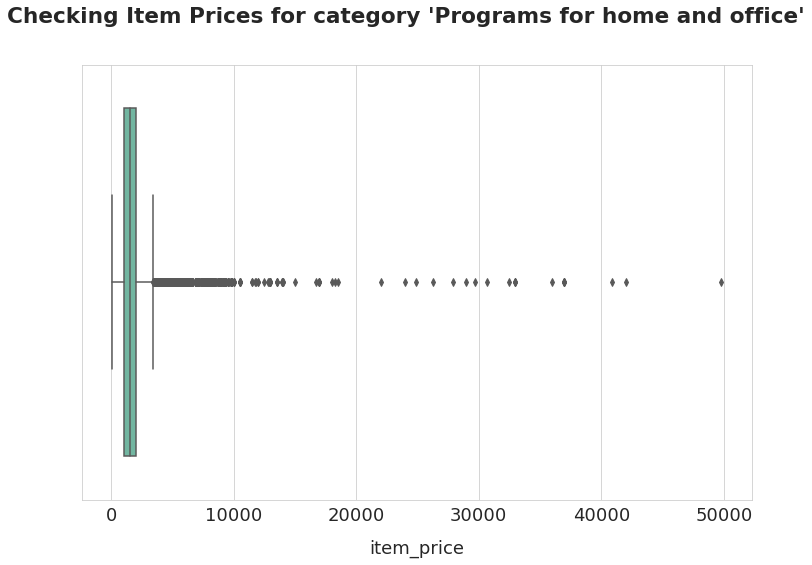

In [88]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Checking Item Prices for category 'Programs for home and office'")
sns.boxplot(x=data[data.item_category_id == 75].item_price, ax=ax)
plt.show()

It's a category with a lot of above-average prices. Those prices seem allright. I keep those sales.

**Study of null or negative prices**

In [89]:
print("There are {} sales with a null or negative price".\
      format(len(data[data.item_price <= 0])))

There are 22 sales with a null or negative price


In [90]:
data[data.item_price < 0]

,date_block_num,shop_id,item_id,item_price,item_cnt_day,shop_name,shop_city,shop_type,shop_address,item_name,item_category_id,item_category_name,main_category,day_date
484660,4,32,2973,-1.00,1.00,Moscow shopping center Silver House,Moscow,shopping center,Silver House,DmC Devil May Cry [PS3 Russian subtitles],19,Games - PS3,Games,2013-05-15


There is only one sale with a negative price. I remove it.

In [91]:
data[data.item_price == 0].item_cnt_day.unique()

array([0.])

The 21 sales with a zero price have an item_cnt_day of zero. I can remove them. 

In [92]:
data = data[data.item_price > 0]

**Final values of item prices after corrections**

In [93]:
data.item_price.describe()

count   2935705.00
mean        890.70
std        1719.93
min           0.07
25%         249.00
50%         399.00
75%         999.00
max       49782.00
Name: item_price, dtype: float64

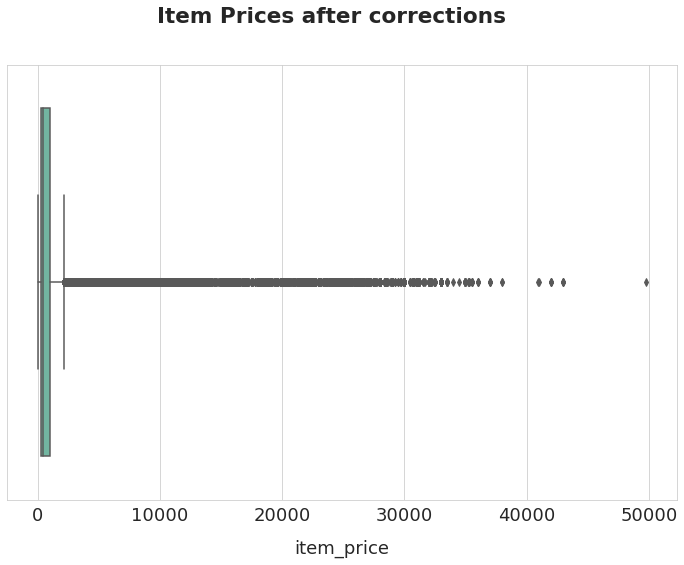

In [94]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Item Prices after corrections")
sns.boxplot(x=data.item_price, ax=ax)
plt.show()

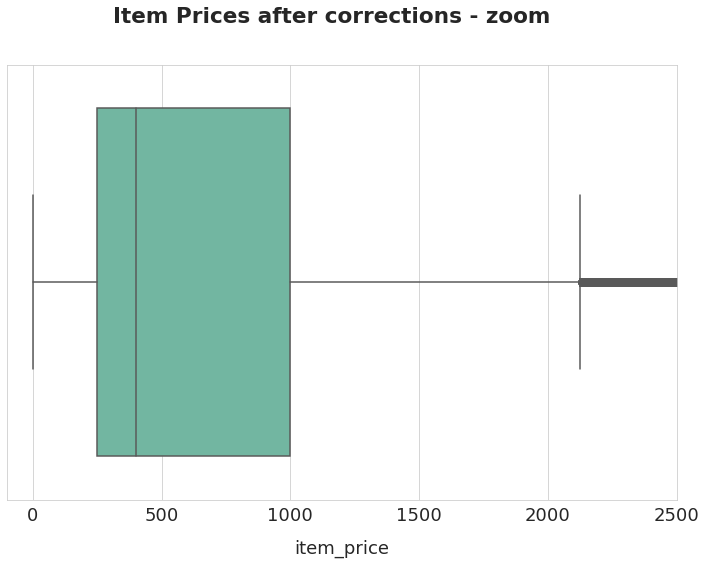

In [95]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Item Prices after corrections - zoom")
sns.boxplot(x=data.item_price, ax=ax)
ax.set_xlim([-100, 2500])
plt.show()

Almost all items are sold under 2500 rubles.

### 1.4.4. Item Count Day

In [96]:
data.item_cnt_day.describe()

count   2935705.00
mean          1.24
std           2.62
min         -22.00
25%           1.00
50%           1.00
75%           1.00
max        2169.00
Name: item_cnt_day, dtype: float64

I notice negative values for some item sales on a day. It can be due to some people bringing back some items with defaults. I check that point.  
The max number of items sold on a day seems really large in comparison with the Q3 number. Maybe a few products concentrate most of the sales.

**Study of negative values**

In [97]:
data[data.item_cnt_day < 0].item_cnt_day.describe()

count   7329.00
mean      -1.03
std        0.37
min      -22.00
25%       -1.00
50%       -1.00
75%       -1.00
max       -1.00
Name: item_cnt_day, dtype: float64

In [98]:
data[data.item_cnt_day == -22]

,date_block_num,shop_id,item_id,item_price,item_cnt_day,shop_name,shop_city,shop_type,shop_address,item_name,item_category_id,item_category_name,main_category,day_date
1057839,10,12,8023,15.00,-22.00,No-city Online store of emergency,No-city,online,store of emergency,ZL004 Laser Stickers Smileys small,66,Gifts - Postcards sticker,Gifts,2013-11-02


In [99]:
data[(data.item_id == 8023) & (data.shop_id == 12)]

,date_block_num,shop_id,item_id,item_price,item_cnt_day,shop_name,shop_city,shop_type,shop_address,item_name,item_category_id,item_category_name,main_category,day_date
511549,4,12,8023,20.00,1.00,No-city Online store of emergency,No-city,online,store of emergency,ZL004 Laser Stickers Smileys small,66,Gifts - Postcards sticker,Gifts,2013-05-31
885158,8,12,8023,15.00,22.00,No-city Online store of emergency,No-city,online,store of emergency,ZL004 Laser Stickers Smileys small,66,Gifts - Postcards sticker,Gifts,2013-09-25
1057839,10,12,8023,15.00,-22.00,No-city Online store of emergency,No-city,online,store of emergency,ZL004 Laser Stickers Smileys small,66,Gifts - Postcards sticker,Gifts,2013-11-02
1174996,11,12,8023,15.00,1.00,No-city Online store of emergency,No-city,online,store of emergency,ZL004 Laser Stickers Smileys small,66,Gifts - Postcards sticker,Gifts,2013-12-27
1330743,12,12,8023,15.00,20.00,No-city Online store of emergency,No-city,online,store of emergency,ZL004 Laser Stickers Smileys small,66,Gifts - Postcards sticker,Gifts,2014-01-27


Negative counts are the cancellation of a previous sale. I keep them. I will have to check that I don't have negative count when data will be grouped by month.

**Study of null values**

In [100]:
data[data.item_cnt_day == 0]

,date_block_num,shop_id,item_id,item_price,item_cnt_day,shop_name,shop_city,shop_type,shop_address,item_name,item_category_id,item_category_name,main_category,day_date


There are no more sales with a null quantity.

**Study of high values**

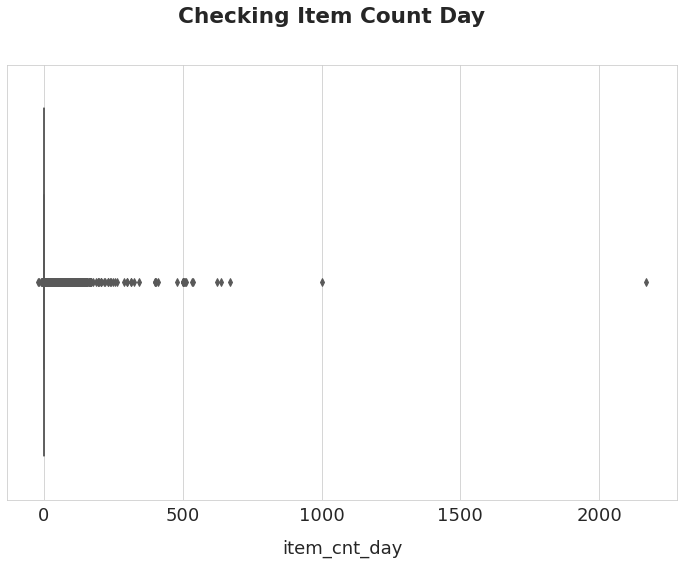

In [101]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Checking Item Count Day")
sns.boxplot(x=data.item_cnt_day, ax=ax)
plt.show()

In [102]:
data[data.item_cnt_day >= 500].sort_values(
    by="item_cnt_day", ascending=False)

,date_block_num,shop_id,item_id,item_price,item_cnt_day,shop_name,shop_city,shop_type,shop_address,item_name,item_category_id,item_category_name,main_category,day_date
2909698,33,12,11373,0.91,2169.00,No-city Online store of emergency,No-city,online,store of emergency,Delivery to the delivery point (Boxberry),9,Service - Product Delivery,Service,2015-10-28
2326816,24,12,20949,4.00,1000.00,No-city Online store of emergency,No-city,online,store of emergency,Branded package T-shirt 1C White Interest (34 ...,71,Gifts - Handbags Albums Mouse pads,Gifts,2015-01-15
2864116,32,12,9248,1692.53,669.00,No-city Online store of emergency,No-city,online,store of emergency,Ticket PlayMir 2015 3 October 2015 (site) [Dig...,80,Service - Tickets,Service,2015-09-30
2850972,32,55,9249,1702.83,637.00,No-city Digital warehouse 1C-Online,No-city,online,Digital warehouse 1C-,Ticket PlayMir 2015 October 3 2015 (site) DRM ...,8,Service - Tickets (Number),Service,2015-09-30
2607921,27,12,3731,1904.55,624.00,No-city Online store of emergency,No-city,online,store of emergency,Grand Theft Auto V [PC Russian subtitles],30,PC Games - Standard Editions,PC Games,2015-04-14
2626062,28,12,11373,155.19,539.00,No-city Online store of emergency,No-city,online,store of emergency,Delivery to the delivery point (Boxberry),9,Service - Product Delivery,Service,2015-05-19
2850954,32,55,9249,1500.00,533.00,No-city Digital warehouse 1C-Online,No-city,online,Digital warehouse 1C-,Ticket PlayMir 2015 October 3 2015 (site) DRM ...,8,Service - Tickets (Number),Service,2015-09-29
2048410,21,12,9242,1500.00,512.00,No-city Online store of emergency,No-city,online,store of emergency,Ticket PlayMir 2014 (for one day (separately 4...,8,Service - Tickets (Number),Service,2014-10-02
2067561,21,55,19437,899.00,508.00,No-city Digital warehouse 1C-Online,No-city,online,Digital warehouse 1C-,Mediterranean Mordor Shadow [PC Digital version],31,PC Games - Number,PC Games,2014-10-09
2864141,32,12,9248,1500.00,504.00,No-city Online store of emergency,No-city,online,store of emergency,Ticket PlayMir 2015 3 October 2015 (site) [Dig...,80,Service - Tickets,Service,2015-09-29


The same products appear several times among most saled products. So I keep those outliers, that are high but not aberrant.

---
<a id="200"></a>

# <font color=blue> 2. Grouping data by month</font>

First I add four columns to the dataframe data : day of week, month and year of the sale, and item_revenue.

In [103]:
data["day_of_week"] = data.day_date.dt.dayofweek
data["month"] = data.day_date.dt.month
data["year"] = data.day_date.dt.year
data["item_revenue"] = data.item_price * data.item_cnt_day

I group data by month for each pair of shop and item. I remove negative monthly counts and negative monthly prices (they can happen if we keep the negative daily counts).  
I compute a weighted mean price, unlike most of kernels I've seen. I think that if 9 products are sold at the price of 10 rubles and 1 product is sold at the price of 20 rubles, the mean price should be 11 rubles (and not 15 rubles as in a lot of kernels).

In [104]:
data_month = data[["date_block_num", "month", "year", "shop_id",
                   "item_id", "item_price"]].\
    groupby(["date_block_num", "shop_id", "item_id"]).mean()
data_month.reset_index(inplace=True)
check = data[["date_block_num", "shop_id", "item_id",
              "item_cnt_day", "item_revenue"]].\
    groupby(["date_block_num", "shop_id", "item_id"]).sum()
check.columns = ["item_cnt_month", "item_revenue"]
check.reset_index(inplace=True)
data_month = data_month.merge(
    check, how="left", on=["date_block_num", "shop_id", "item_id"])

In [105]:
data_month = data_month[data_month.item_cnt_month > 0]
data_month["item_mean_price_month"] = \
    data_month.item_revenue / data_month.item_cnt_month
data_month = data_month[data_month.item_mean_price_month > 0]

Addition of qualitative information

In [106]:
data_month = data_month.merge(shops, how="left", on="shop_id")
data_month = data_month.merge(items, how="left", on="item_id")
data_month = data_month.merge(categories, how="left",
                              on="item_category_id")

In [107]:
for col in ["month", "year", "item_cnt_month"]:
    data_month[col] = data_month[col].astype(np.int32)

In [108]:
data_month.head()

,date_block_num,shop_id,item_id,month,year,item_price,item_cnt_month,item_revenue,item_mean_price_month,shop_name,shop_city,shop_type,shop_address,item_name,item_category_id,item_category_name,main_category
0,0,2,27,1,2013,2499.00,1,2499.00,2499.00,Adygeya shopping center Mega,Adygeya,shopping center,Mega,007 Legends [PS3 Russian version],19,Games - PS3,Games
1,0,2,33,1,2013,499.00,1,499.00,499.00,Adygeya shopping center Mega,Adygeya,shopping center,Mega,1 1 (BD),37,Movie - Blu-Ray,Movie
2,0,2,317,1,2013,299.00,1,299.00,299.00,Adygeya shopping center Mega,Adygeya,shopping center,Mega,1C Audio Books Medinsky In Myths about Russia ...,45,Books - Audiobooks 1C,Books
3,0,2,438,1,2013,299.00,1,299.00,299.00,Adygeya shopping center Mega,Adygeya,shopping center,Mega,1C Audio Theater Best works by Russian writers...,45,Books - Audiobooks 1C,Books
4,0,2,471,1,2013,399.00,2,798.00,399.00,Adygeya shopping center Mega,Adygeya,shopping center,Mega,1C Accounting 8 (ed 3 0) as in the palm of you...,49,Books - 1C Methodical Materials,Books


In [109]:
del check
gc.collect()

33270

---
<a id="300"></a>

# <font color=blue>3. Analysis</blue>

Beware ! All this analysis was run in the first version of the notebook (v1), without skiping negative item_day_cnt. So small differences may appear in a few data if this option is changed.

In [110]:
graph_dates = data_month[["date_block_num", "month", "year"]].\
    groupby("date_block_num").mean()
graph_dates.reset_index(inplace=True)
graph_dates["month_year"] = ["{}-{}".format(m, y) 
    for m, y in zip(graph_dates.month, graph_dates.year)]

<a id="301"></a>
## 3.1. Total sales

In [111]:
check = \
    data_month[["date_block_num", "item_cnt_month", "item_revenue"]].\
    groupby("date_block_num").sum()
check = check.merge(
    graph_dates[["date_block_num", "month_year"]], how="left",
    left_index=True, right_on="date_block_num")

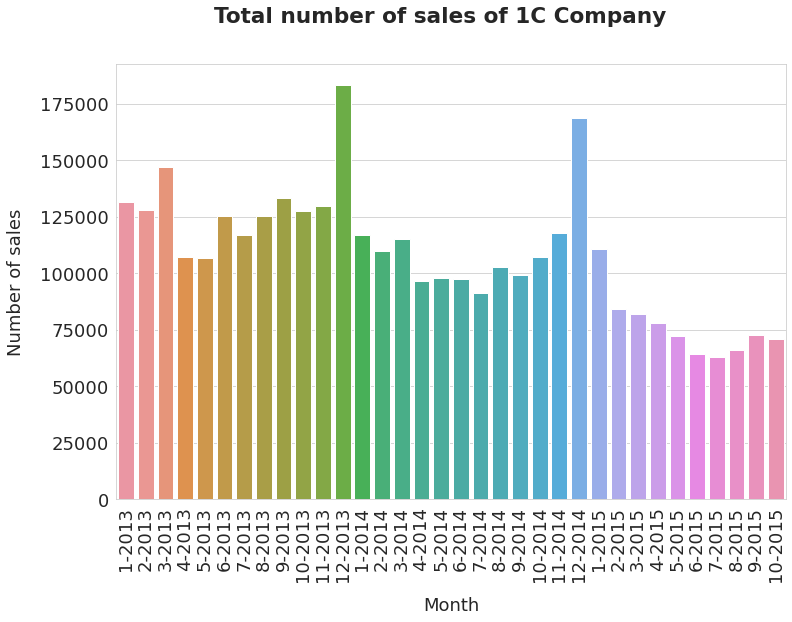

In [112]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total number of sales of 1C Company")
sns.barplot(x=check.month_year, y=check.item_cnt_month, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("Month")
ax.set_ylabel("Number of sales")
plt.show()

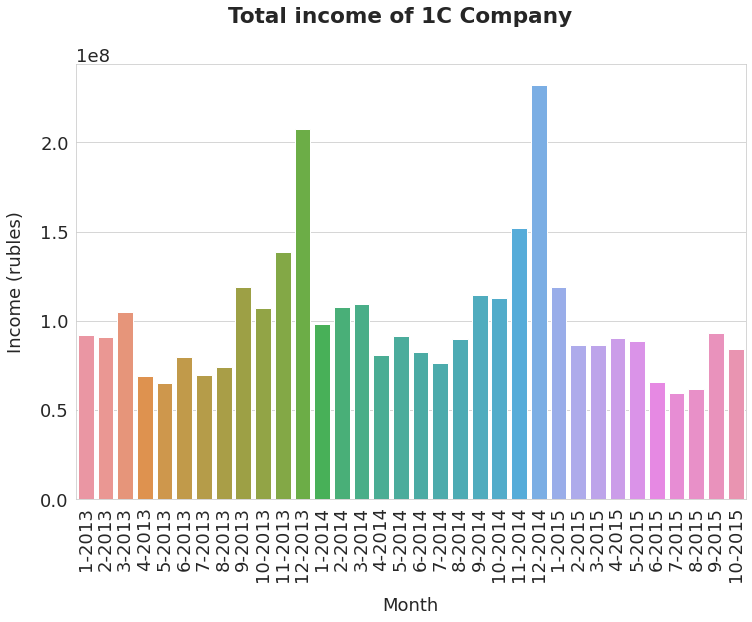

In [113]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total income of 1C Company")
sns.barplot(x=check.month_year, y=check.item_revenue, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("Month")
ax.set_ylabel("Income (rubles)")
plt.show()

The company sells less items from one year to another. But the average price goes up as revenues don't decrease that much.  
Sales tend to increase in November and December, due to Christmas purchases. This seasonality will impact our forecasts as we predict sales for November.

In [114]:
check = data[["day_of_week", "item_cnt_day", "item_revenue"]].\
    groupby(["day_of_week"]).sum()
week_days = ["Monday", "Tuesday", "Wednesday", "Thursday",
            "Friday", "Saturday", "Sunday"]

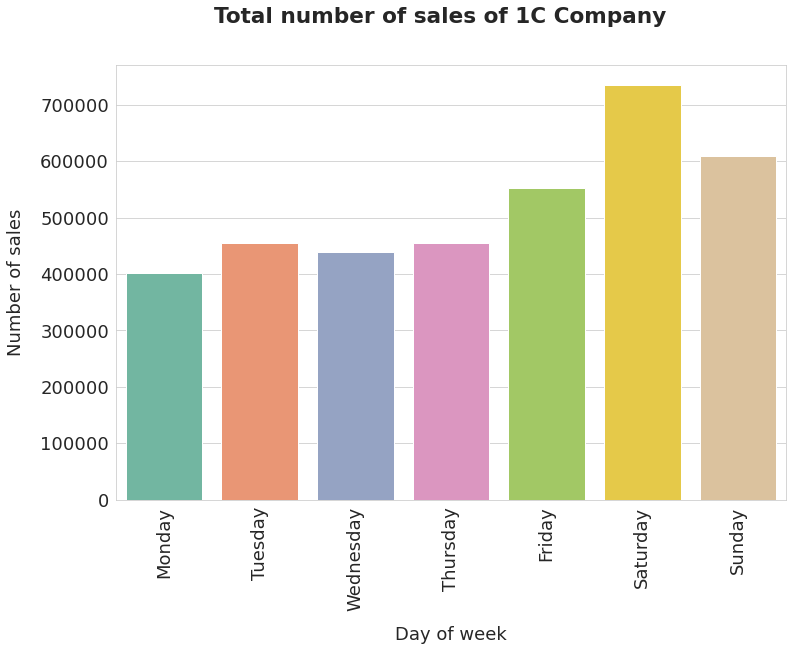

In [115]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total number of sales of 1C Company")
sns.barplot(x=check.index, y=check.item_cnt_day, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xticklabels(week_days)
ax.set_xlabel("Day of week")
ax.set_ylabel("Number of sales")
plt.show()

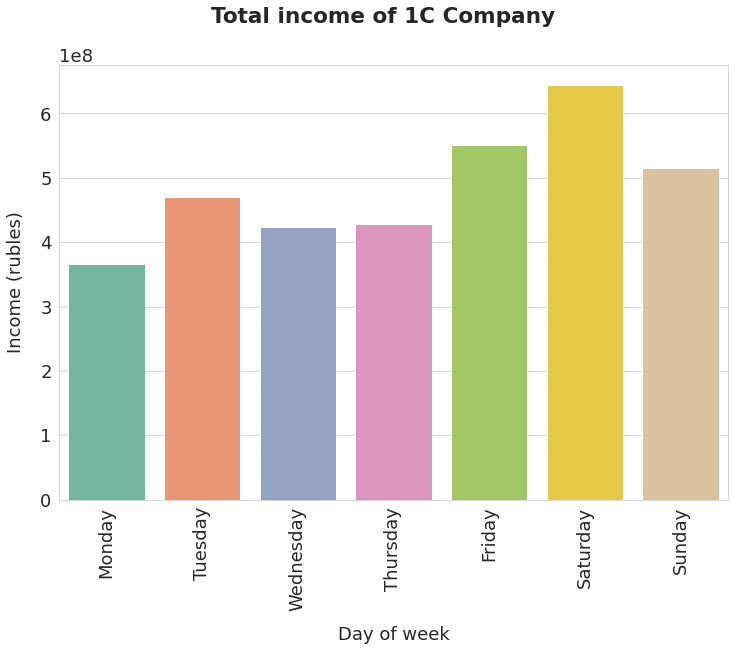

In [116]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total income of 1C Company")
sns.barplot(x=check.index, y=check.item_revenue, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xticklabels(week_days)
ax.set_xlabel("Day of week")
ax.set_ylabel("Income (rubles)")
plt.show()

The company sales more on Friday and week-end days.

<a id="302"></a>
## 3.2. Sales by shop

In [117]:
check = data_month[["shop_name", "item_cnt_month", "item_revenue"]].\
    groupby("shop_name").sum()
check.reset_index(inplace=True)

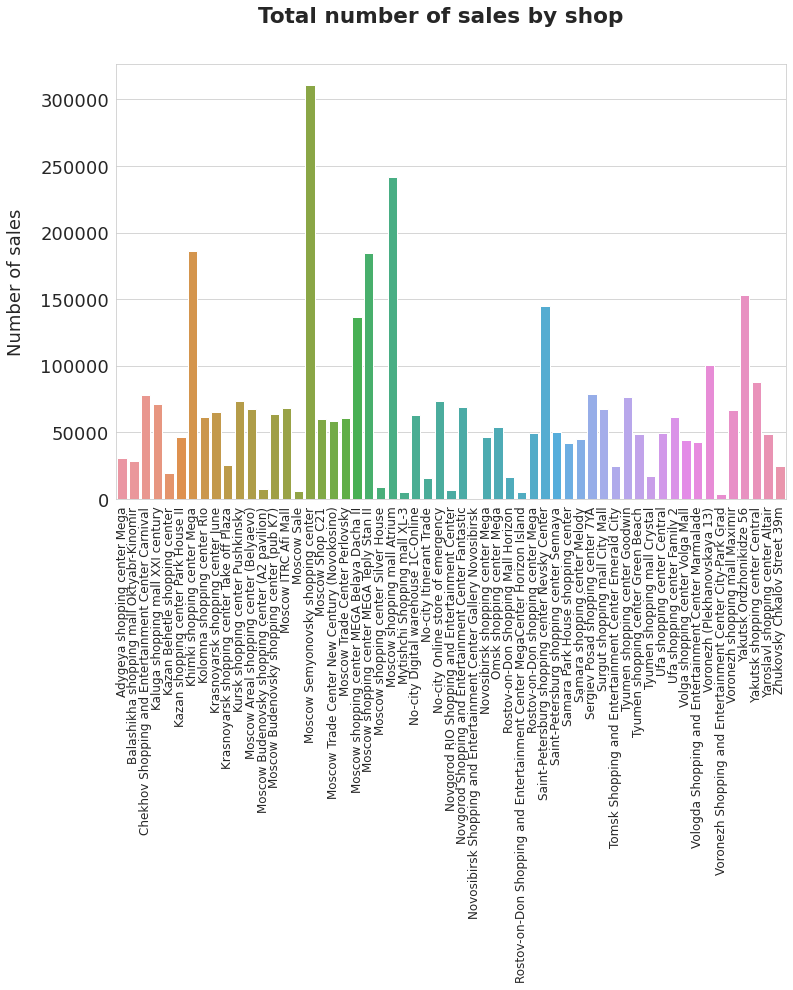

In [118]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total number of sales by shop")
sns.barplot(x=check.shop_name, y=check.item_cnt_month, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=12)
ax.set_xlabel("")
ax.set_ylabel("Number of sales")
plt.show()

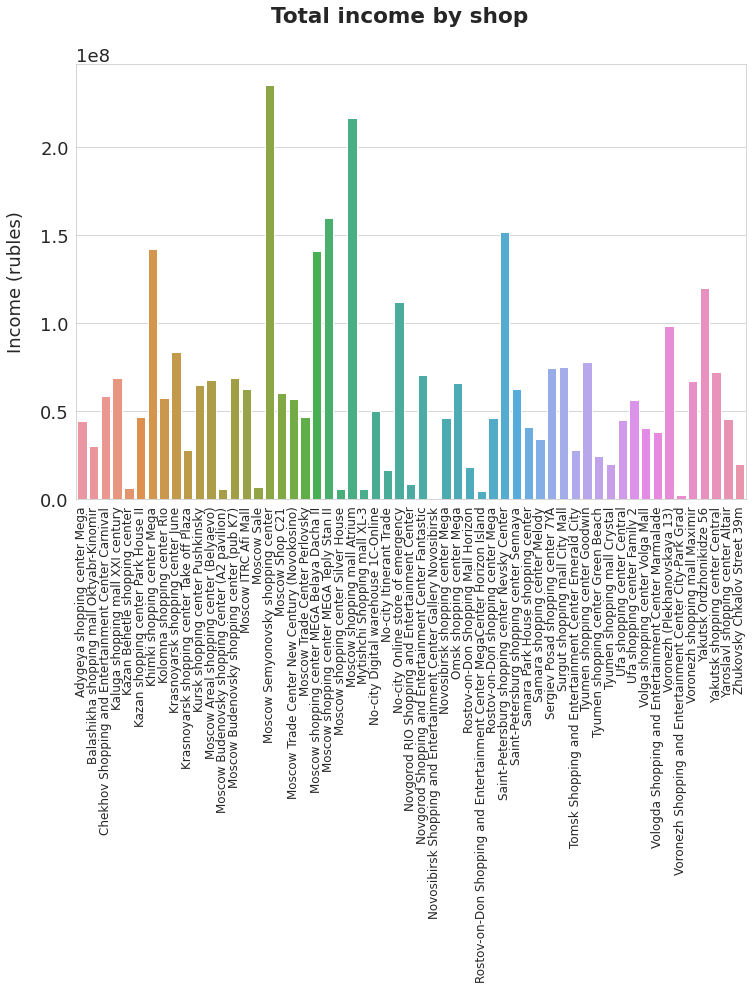

In [119]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total income by shop")
sns.barplot(x=check.shop_name, y=check.item_revenue, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=12)
ax.set_xlabel("")
ax.set_ylabel("Income (rubles)")
plt.show()

The 3 top selling shops are located in Moscow.  
Let's have a look at figures by shop type and shop city.

In [120]:
check = data_month[["shop_type", "item_cnt_month", "item_revenue"]].\
    groupby("shop_type").sum()
check.reset_index(inplace=True)

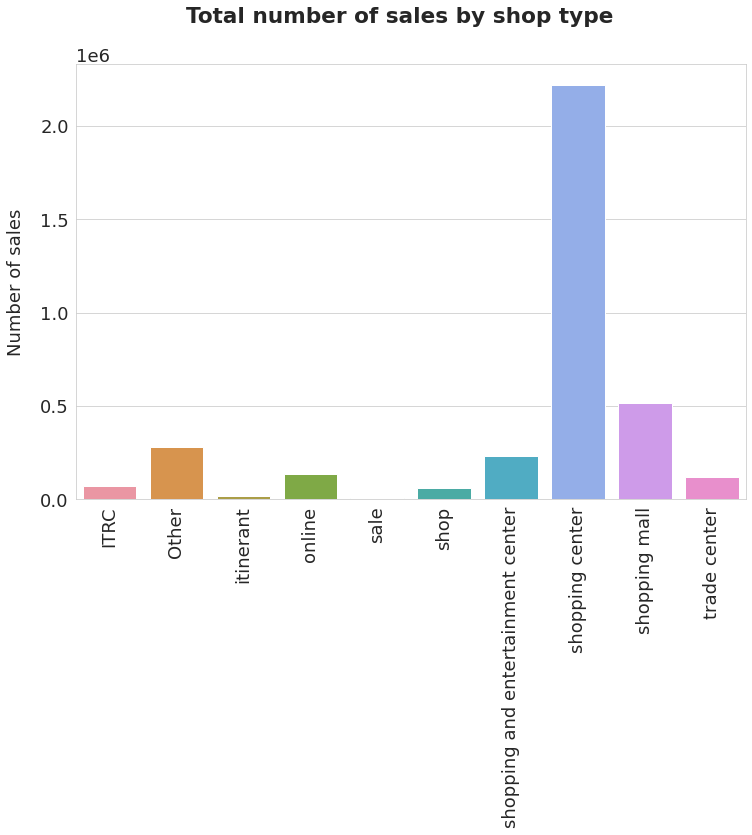

In [121]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total number of sales by shop type")
sns.barplot(x=check.shop_type, y=check.item_cnt_month, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Number of sales")
plt.show()

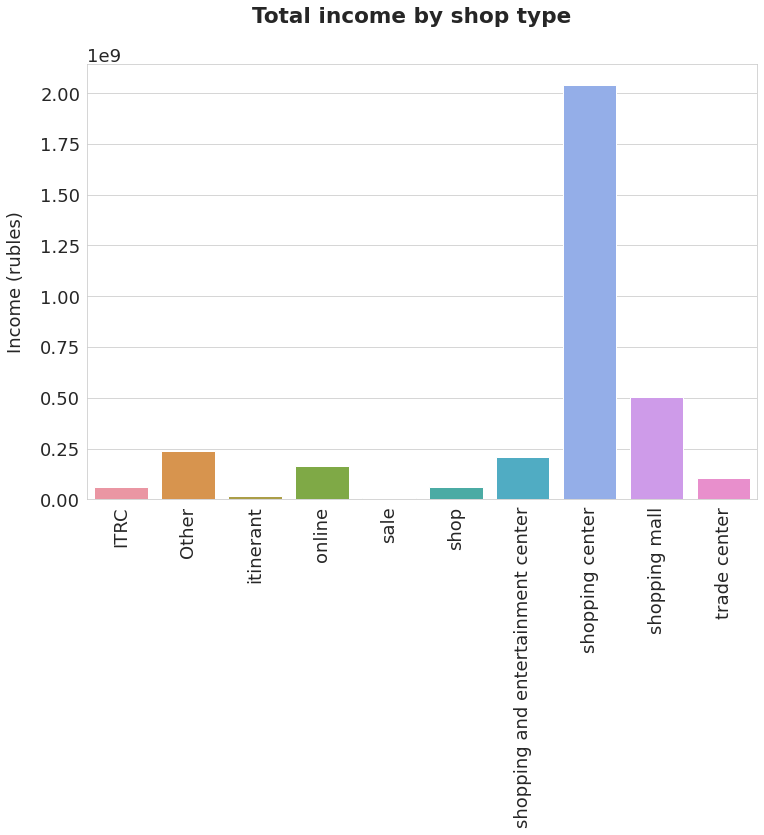

In [122]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total income by shop type")
sns.barplot(x=check.shop_type, y=check.item_revenue, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Income (rubles)")
plt.show()

Most sales are done in shopping center, during this period. An analysis of the evolution over time would give us more information.

In [123]:
check = data_month[["shop_city", "item_cnt_month", "item_revenue"]].\
    groupby("shop_city").sum()
check.reset_index(inplace=True)

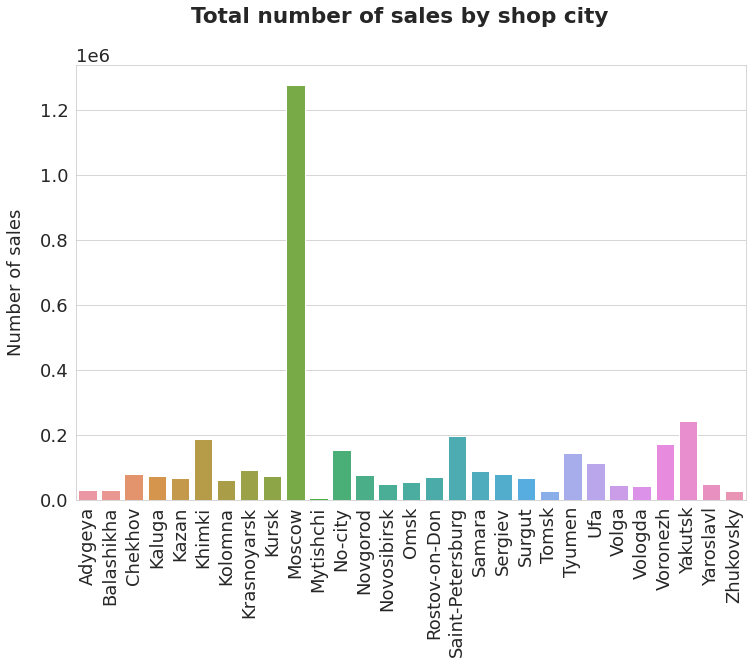

In [124]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total number of sales by shop city")
sns.barplot(x=check.shop_city, y=check.item_cnt_month, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Number of sales")
plt.show()

With no surprise, the vast majority of sales are done in Moscow. Let's have a look at the same data with a log scale.

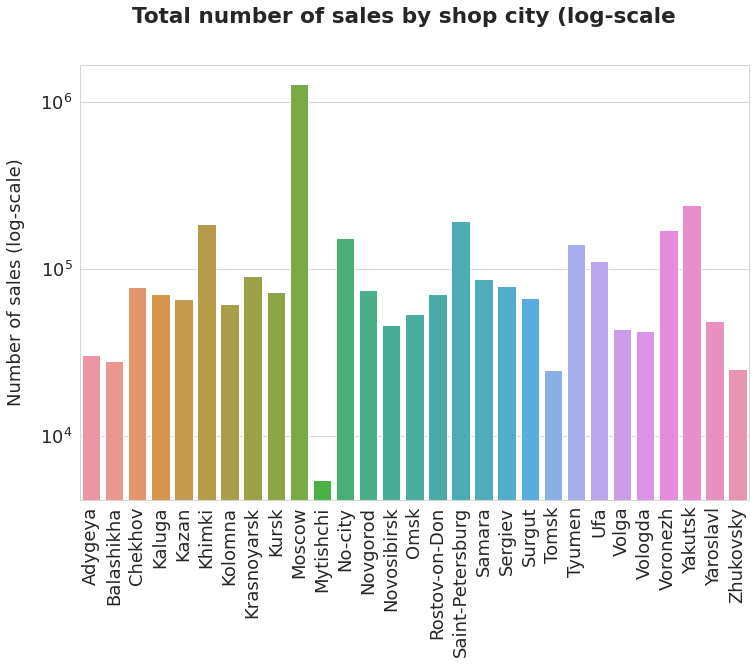

In [125]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total number of sales by shop city (log-scale")
g = sns.barplot(x=check.shop_city, y=check.item_cnt_month, ax=ax)
g.set_yscale("log")
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Number of sales (log-scale)")
plt.show()

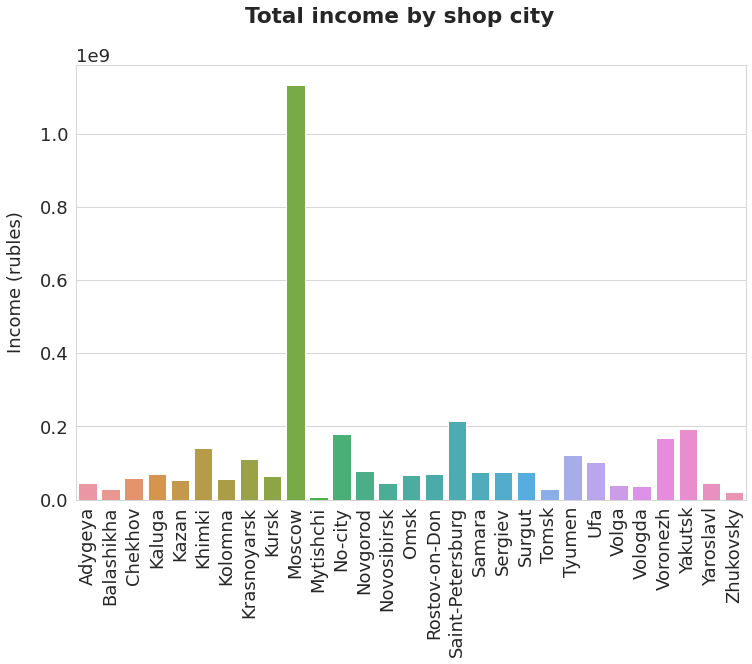

In [126]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total income by shop city")
sns.barplot(x=check.shop_city, y=check.item_revenue, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Income (rubles)")
plt.show()

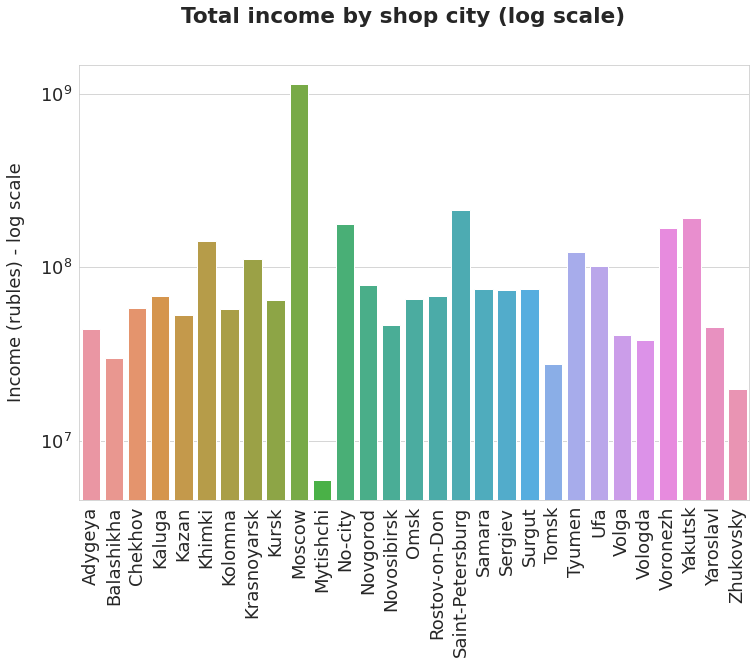

In [127]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total income by shop city (log scale)")
g = sns.barplot(x=check.shop_city, y=check.item_revenue, ax=ax)
g.set_yscale("log")
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Income (rubles) - log scale")
plt.show()

Some shops seem to sell cheaper products on average. But this can be explained by an evolution of sales over time.

I now look at the homogeneity of sold quantities and mean prices by shop. I think I should have different counts and prices as a shop sell different products from different categories.

In [128]:
check = data_month[["shop_name", "shop_city", "shop_type",
                    "item_cnt_month", "item_mean_price_month"]].copy()

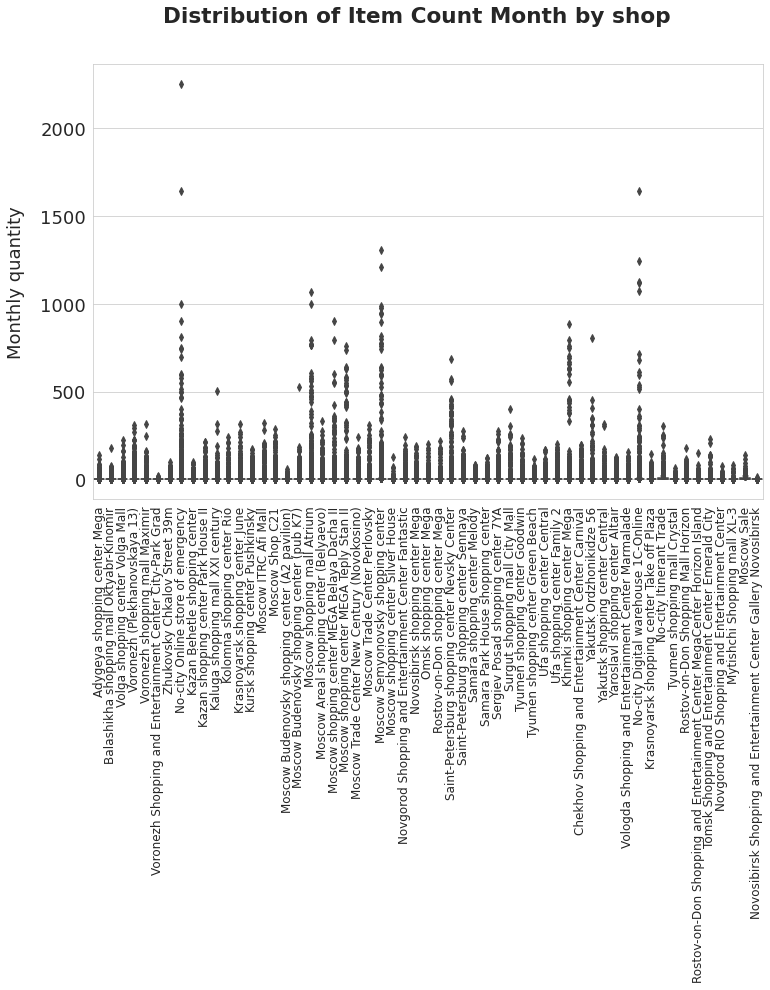

In [129]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of Item Count Month by shop")
sns.boxplot(x="shop_name", y="item_cnt_month", data=check, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=12)
ax.set_xlabel("")
ax.set_ylabel("Monthly quantity")
plt.show()

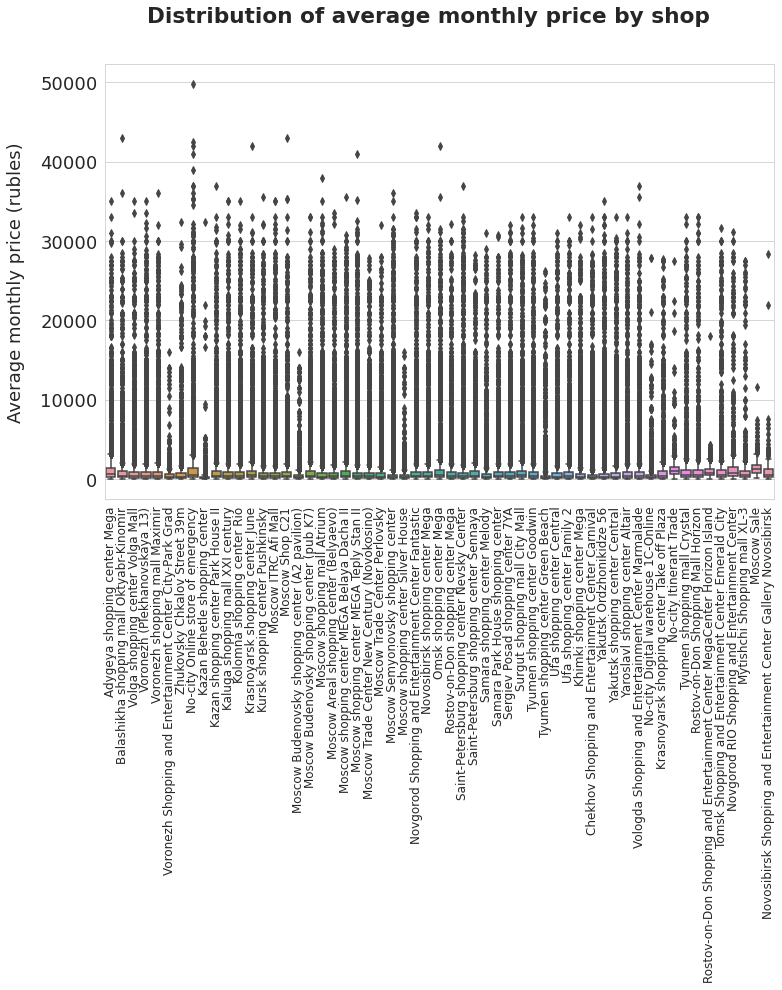

In [130]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of average monthly price by shop")
sns.boxplot(x="shop_name", y="item_mean_price_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=12)
ax.set_xlabel("")
ax.set_ylabel("Average monthly price (rubles)")
plt.show()

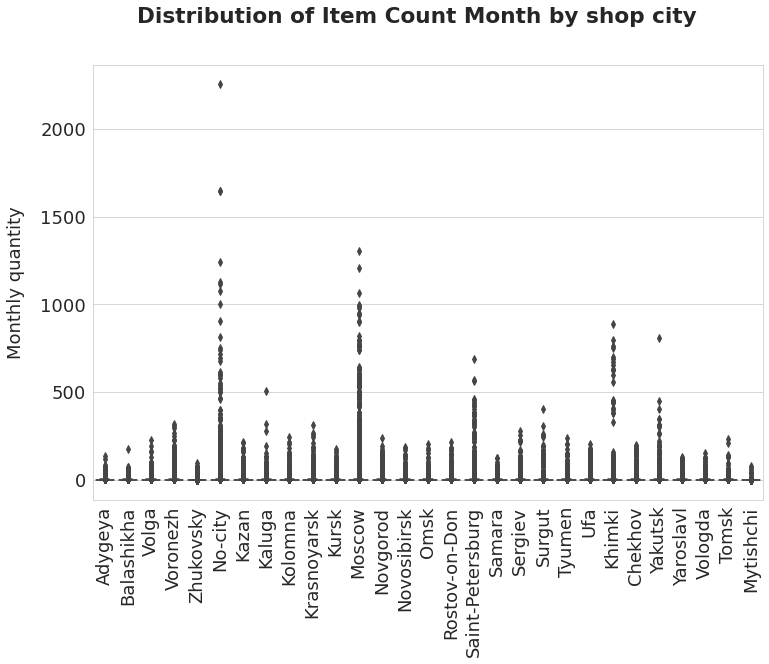

In [131]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of Item Count Month by shop city")
sns.boxplot(x="shop_city", y="item_cnt_month", data=check, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Monthly quantity")
plt.show()

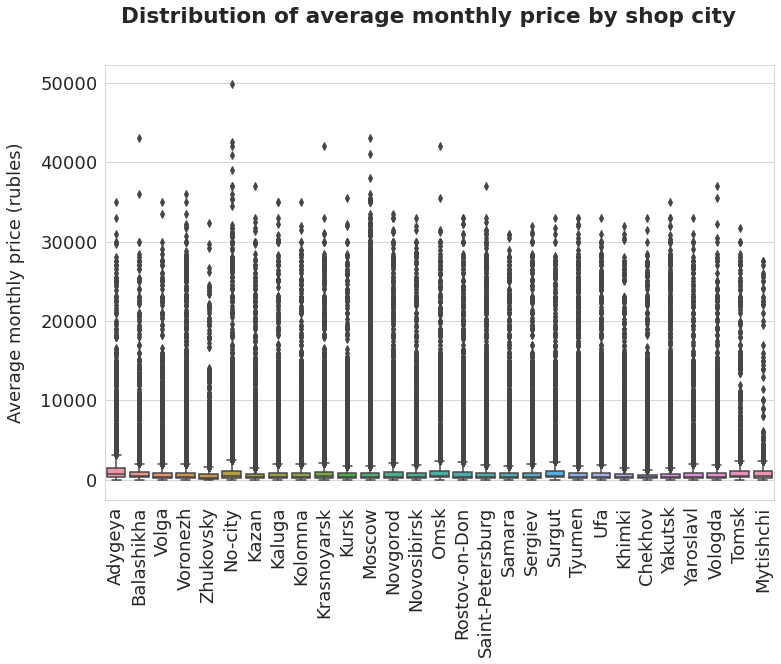

In [132]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of average monthly price by shop city")
sns.boxplot(x="shop_city", y="item_mean_price_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Average monthly price (rubles)")
plt.show()

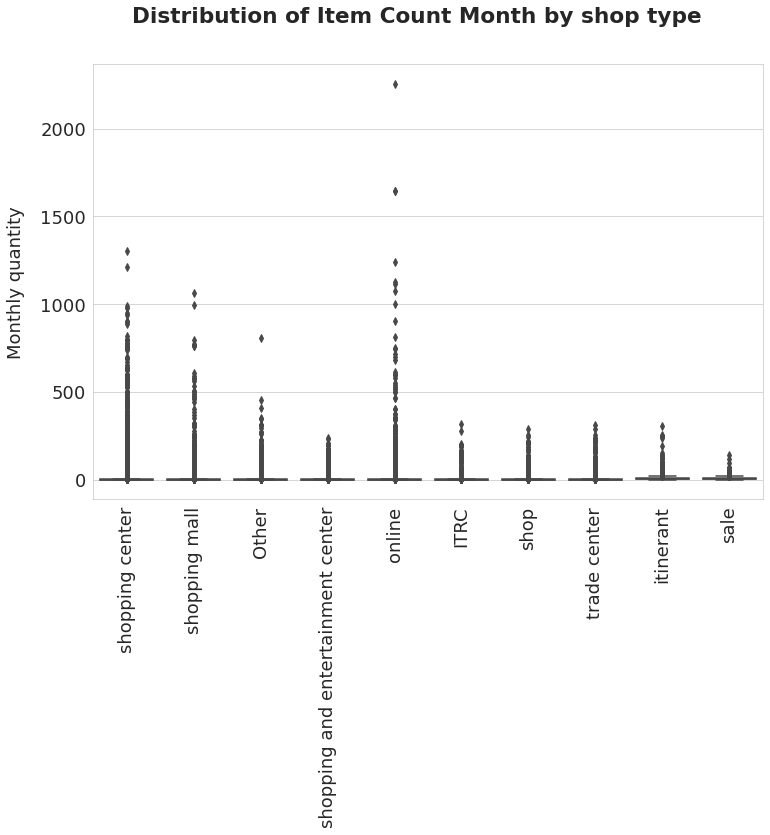

In [133]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of Item Count Month by shop type")
sns.boxplot(x="shop_type", y="item_cnt_month", data=check, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Monthly quantity")
plt.show()

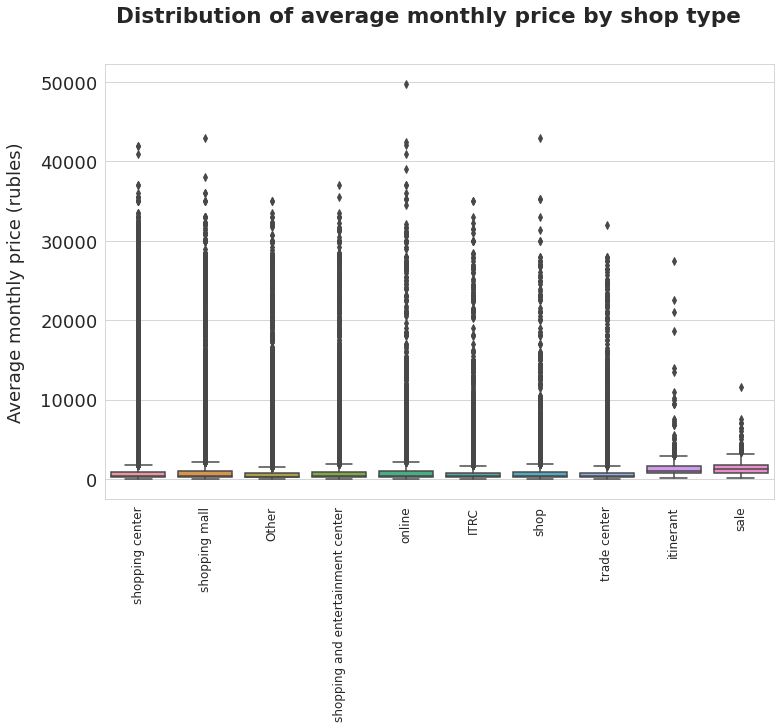

In [134]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of average monthly price by shop type")
sns.boxplot(x="shop_type", y="item_mean_price_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=12)
ax.set_xlabel("")
ax.set_ylabel("Average monthly price (rubles)")
plt.show()

There are no big differences between shops, except for the sold quantity of a few top selling products. Same for differences between cities and between shop types.  
I notice that the sale shop has the highest median price. This is weird for what I suppose to be an outlet store. Either it's not an outlet, either it's an outlet store that sells only high-price items.

<a id="303"></a>
## 3.3. Change of sales by shop over time

In [135]:
check = data_month[["date_block_num", "shop_name", "item_cnt_month",
                    "item_revenue"]].groupby(["date_block_num",
                                              "shop_name"]).sum()
check.reset_index(inplace=True)

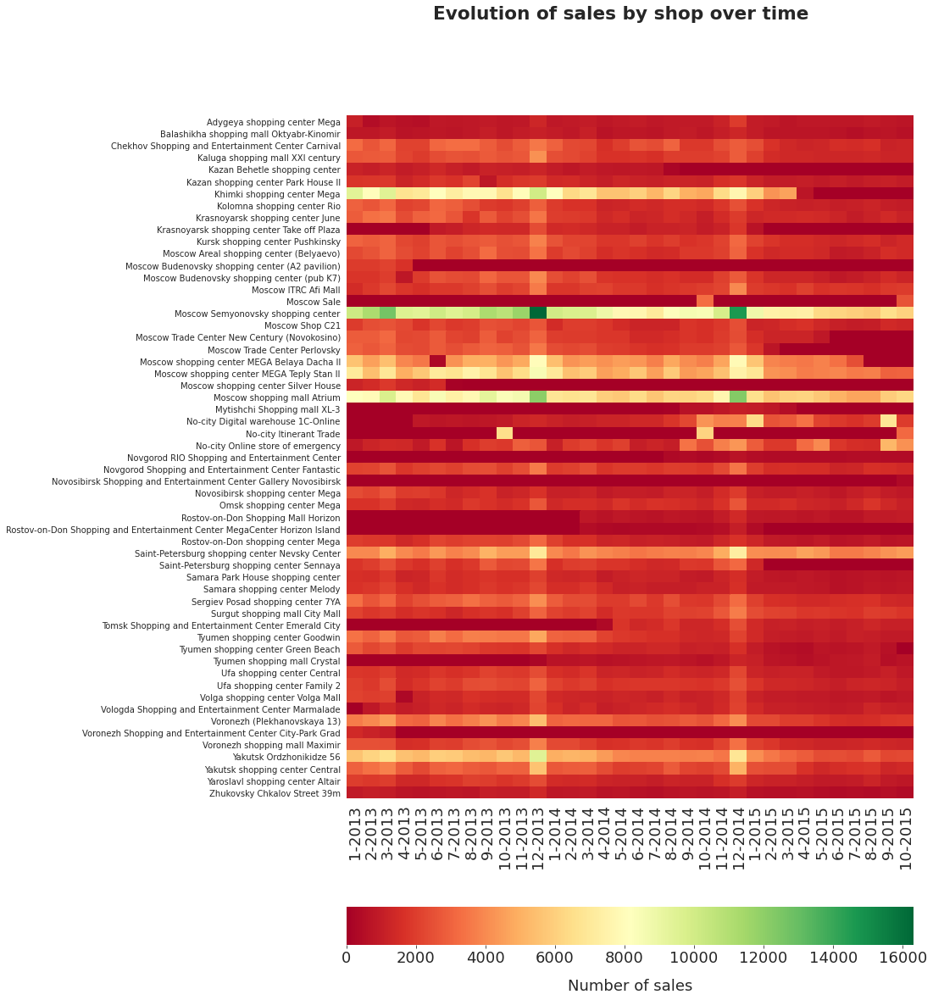

In [136]:
data_graph = check.pivot_table(
    values="item_cnt_month", columns="date_block_num",
    index="shop_name", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (.9, .05), "hspace": .3},
    figsize=(12, 18))
fig.suptitle("Evolution of sales by shop over time")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.tick_params(axis="y", labelsize=10)
ax.set_xticklabels(
    graph_dates.sort_values(by="date_block_num").month_year)
ax.yaxis.set_ticks(np.arange(0.5, len(data_graph.index), 1))
ax.set_yticklabels(data_graph.index)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

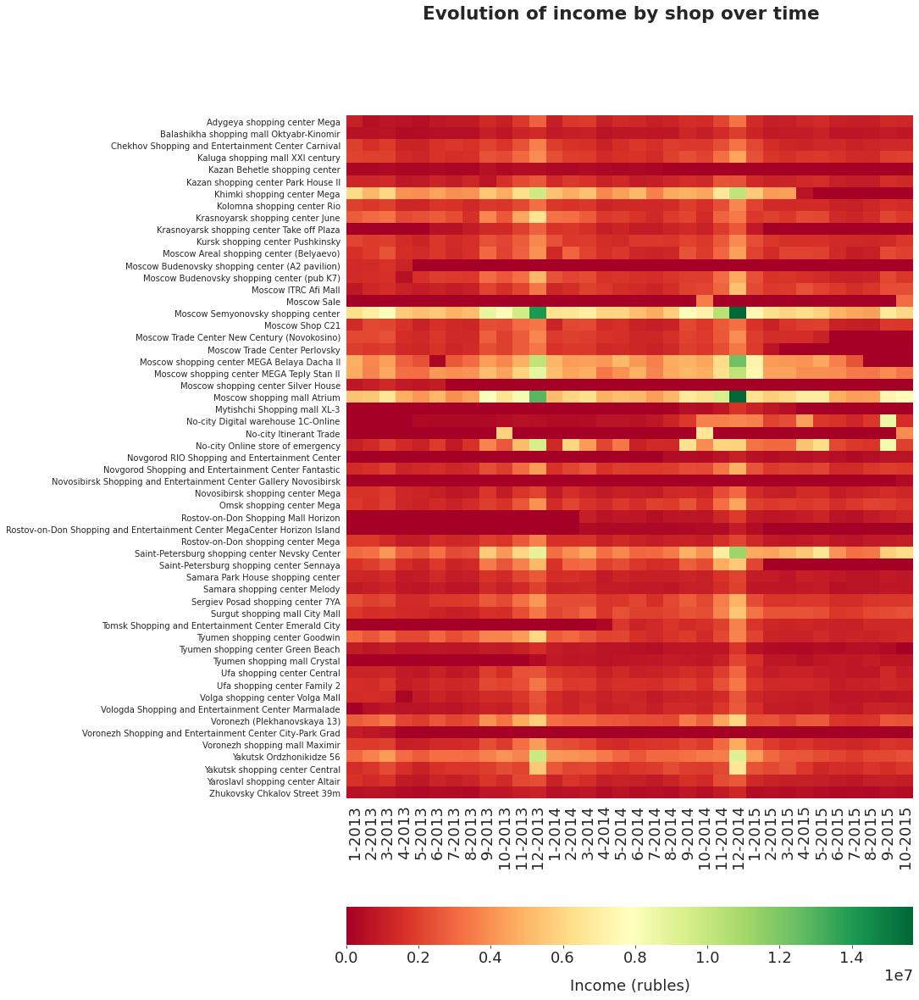

In [137]:
data_graph = check.pivot_table(
    values="item_revenue", columns="date_block_num",
    index="shop_name", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (.9, .05), "hspace": .3},
    figsize=(12, 18))
fig.suptitle("Evolution of income by shop over time")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Income (rubles)"})
ax.tick_params(axis="x", rotation=90)
ax.tick_params(axis="y", labelsize=10)
ax.set_xticklabels(
    graph_dates.sort_values(by="date_block_num").month_year)
ax.yaxis.set_ticks(np.arange(0.5, len(data_graph.index), 1))
ax.set_yticklabels(data_graph.index)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

Some shops keep have stopped their activity.  
The shop Moscow Sale only sells in October (must be a kind of seasonal outlet).  
While some shops increase their sales and incomes (as Moscow Atrium, St Petersburg Nevsky Center or the online shop), other ones exhibit a decrease in activity (for example Yakutsk Central).

In [138]:
check = data_month[["date_block_num", "shop_type", "item_cnt_month",
                    "item_revenue"]].groupby(["date_block_num",
                                              "shop_type"]).sum()
check.reset_index(inplace=True)

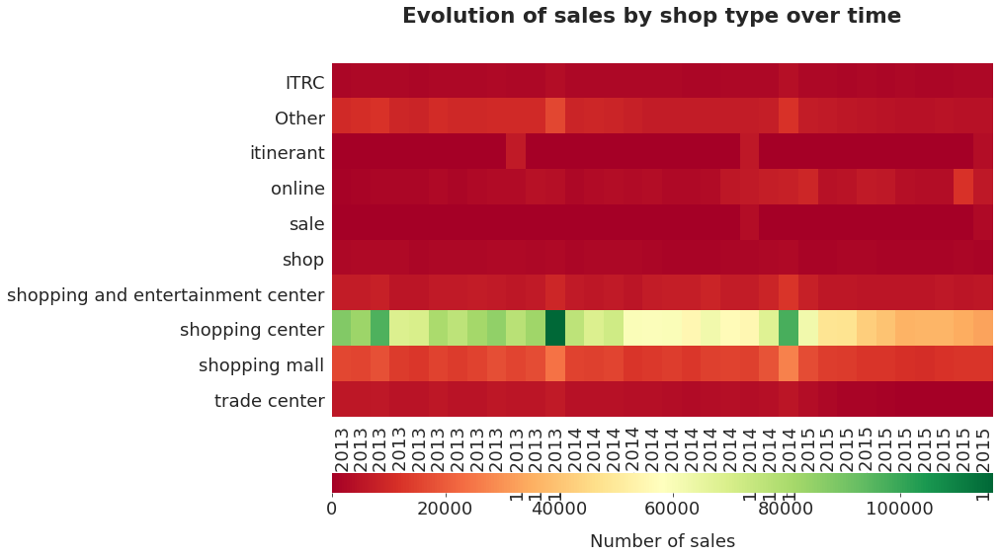

In [139]:
data_graph = check.pivot_table(
    values="item_cnt_month", columns="date_block_num",
    index="shop_type", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (.9, .05), "hspace": .3},
    figsize=(12, 8))
fig.suptitle("Evolution of sales by shop type over time")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.set_xticklabels(
    graph_dates.sort_values(by="date_block_num").month_year)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

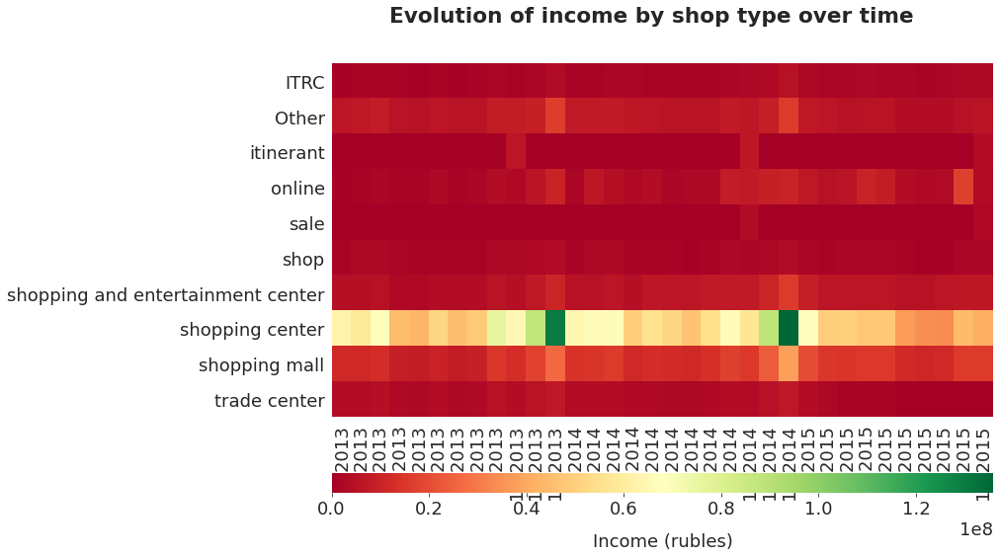

In [140]:
data_graph = check.pivot_table(
    values="item_revenue", columns="date_block_num",
    index="shop_type", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (.9, .05), "hspace": .3},
    figsize=(12, 8))
fig.suptitle("Evolution of income by shop type over time")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Income (rubles)"})
ax.tick_params(axis="x", rotation=90)
ax.set_xticklabels(
    graph_dates.sort_values(by="date_block_num").month_year)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

In [141]:
check = data_month[["date_block_num", "shop_city", "item_cnt_month",
                    "item_revenue"]].groupby(["date_block_num",
                                              "shop_city"]).sum()
check.reset_index(inplace=True)

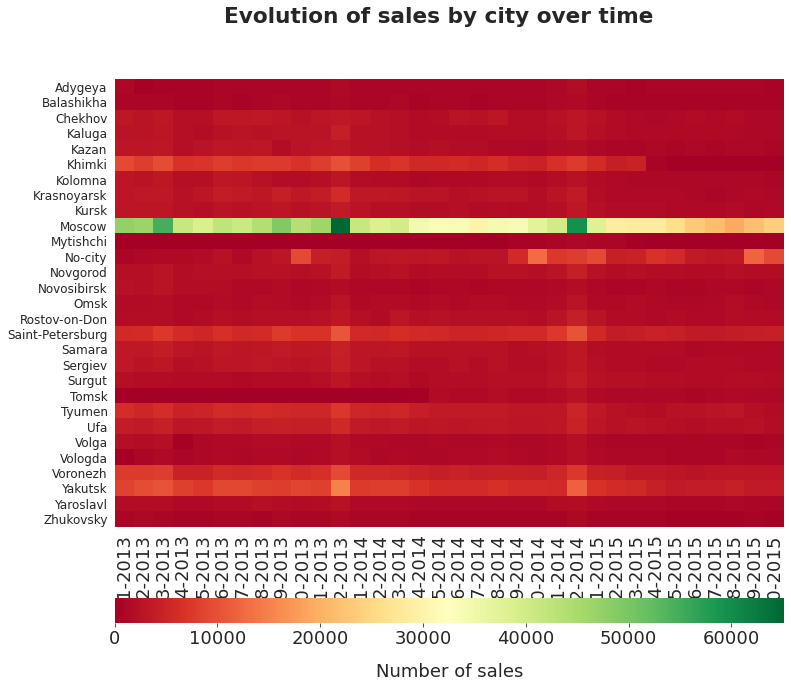

In [142]:
data_graph = check.pivot_table(
    values="item_cnt_month", columns="date_block_num",
    index="shop_city", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (.9, .05), "hspace": .3},
    figsize=(12, 10))
fig.suptitle("Evolution of sales by city over time")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.tick_params(axis="y", labelsize=12)
ax.set_xticklabels(
    graph_dates.sort_values(by="date_block_num").month_year)
ax.yaxis.set_ticks(np.arange(0.5, len(data_graph.index), 1))
ax.set_yticklabels(data_graph.index)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

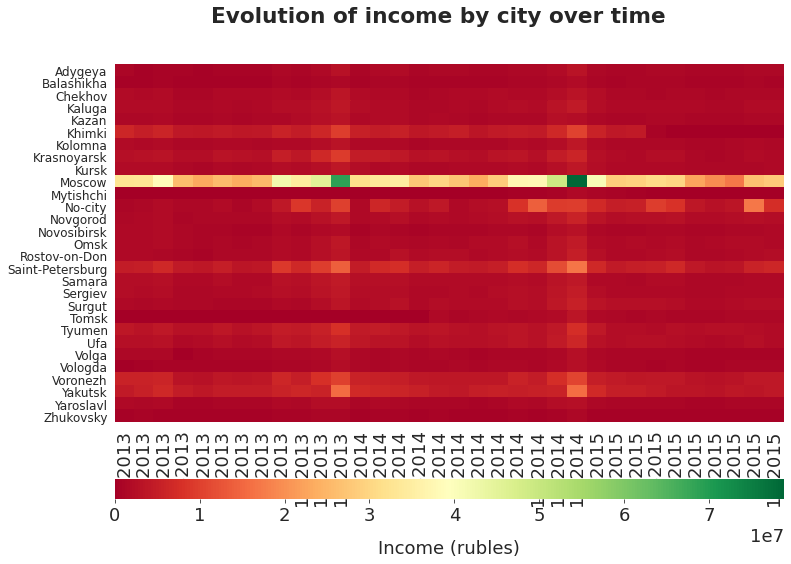

In [143]:
data_graph = check.pivot_table(
    values="item_revenue", columns="date_block_num",
    index="shop_city", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (.9, .05), "hspace": .3},
    figsize=(12, 8))
fig.suptitle("Evolution of income by city over time")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Income (rubles)"})
ax.tick_params(axis="x", rotation=90)
ax.tick_params(axis="y", labelsize=12)
ax.set_xticklabels(
    graph_dates.sort_values(by="date_block_num").month_year)
ax.yaxis.set_ticks(np.arange(0.5, len(data_graph.index), 1))
ax.set_yticklabels(data_graph.index)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

Evolution over time is more meaningful by shop than by city or shop type. We can notice that online sales are increasing while store sales are decreasing in all cities.

<a id="304"></a>
## 3.4. Sales by category

In [144]:
check = \
    data_month[["item_category_name", "item_cnt_month",
                "item_revenue"]].groupby("item_category_name").sum()
check.reset_index(inplace=True)

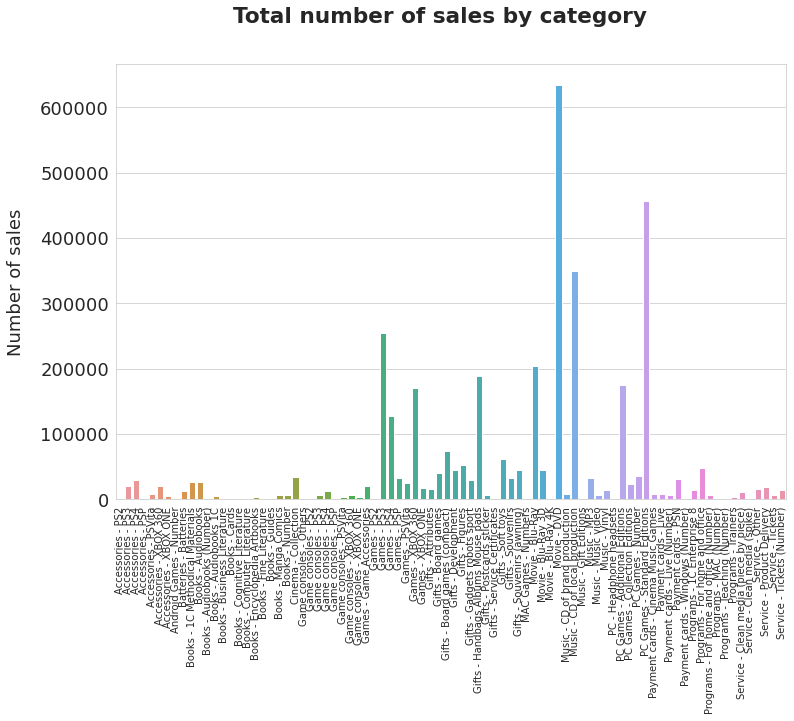

In [145]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total number of sales by category")
sns.barplot(
    x=check.item_category_name, y=check.item_cnt_month, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=10)
ax.set_xlabel("")
ax.set_ylabel("Number of sales")
plt.show()

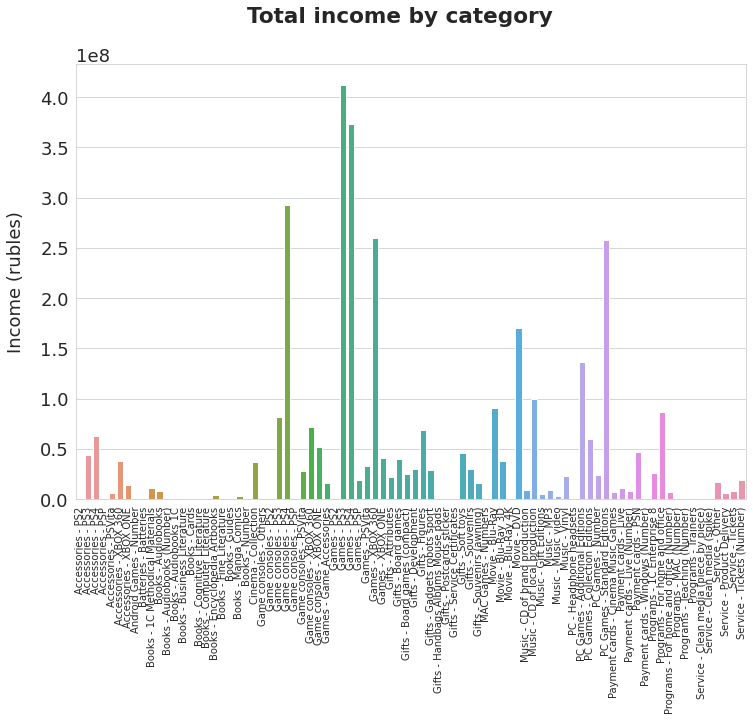

In [146]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total income by category")
sns.barplot(
    x=check.item_category_name, y=check.item_revenue, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=10)
ax.set_xlabel("")
ax.set_ylabel("Income (rubles)")
plt.show()

Comparison of sales and incomes show that the sales are linked to the price of the product. For example, expansive items like game consoles are a small part of sales but participate significantly to total income.  
I move to an analysis by main category for the following graphs.

In [147]:
check = data_month[["main_category", "item_cnt_month",
                    "item_revenue"]].groupby("main_category").sum()
check.reset_index(inplace=True)

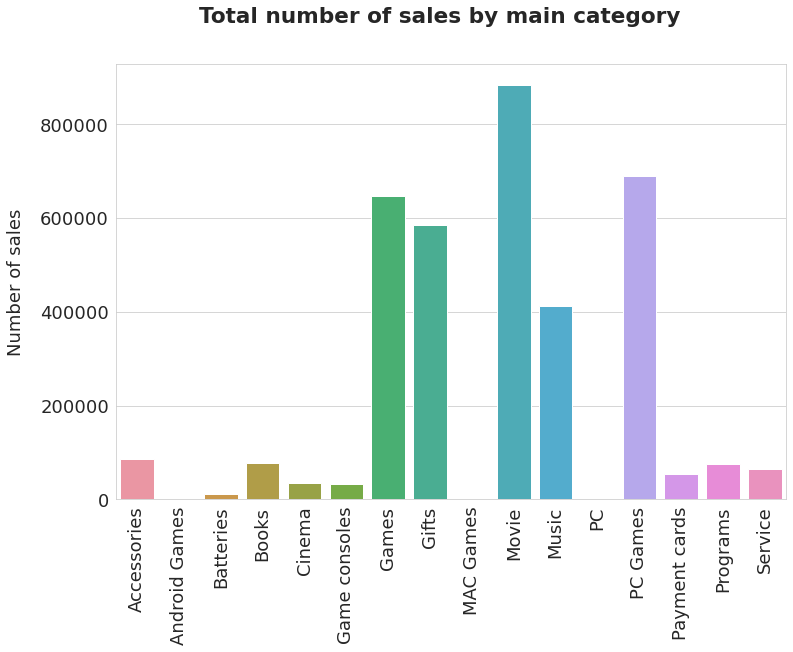

In [148]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total number of sales by main category")
sns.barplot(x=check.main_category, y=check.item_cnt_month, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Number of sales")
plt.show()

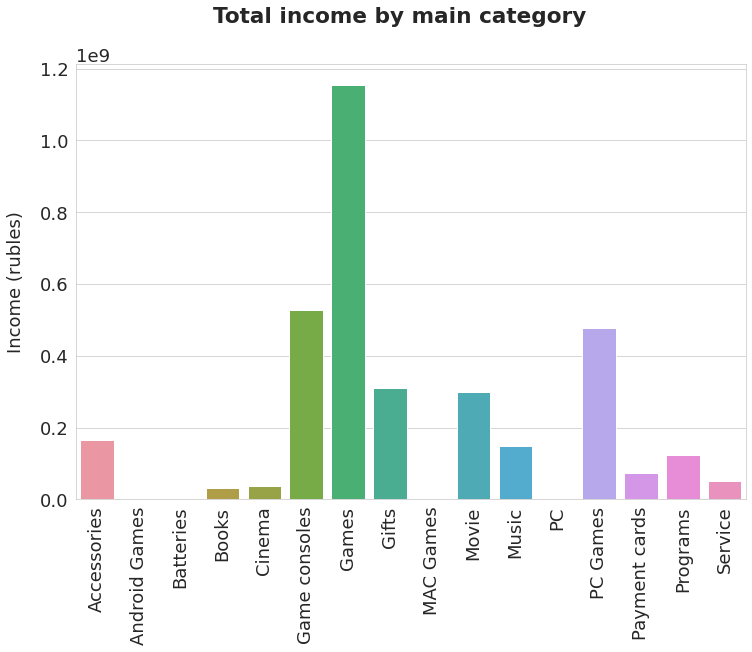

In [149]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Total income by main category")
sns.barplot(x=check.main_category, y=check.item_revenue, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Income (rubles)")
plt.show()

Total income mainly comes from games (for consoles and PC) and game consoles. For our purpose of counting sales, most vending items are movies. Those two charts seem to confirm that sales numbers depend on the item price. Cheaper products are more easily sold.

In [150]:
check = data_month[["date_block_num", "main_category",
                    "item_cnt_month", "item_revenue"]].groupby(
    ["date_block_num", "main_category"]).sum()
check.reset_index(inplace=True)

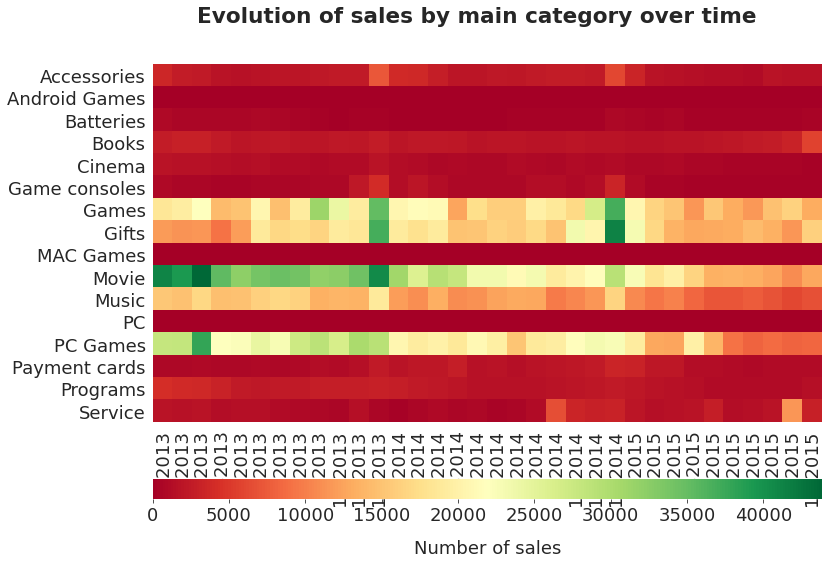

In [151]:
data_graph = check.pivot_table(
    values="item_cnt_month", columns="date_block_num",
    index="main_category", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (.9, .05), "hspace": .3},
    figsize=(12, 8))
fig.suptitle("Evolution of sales by main category over time")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.set_xticklabels(
    graph_dates.sort_values(by="date_block_num").month_year)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

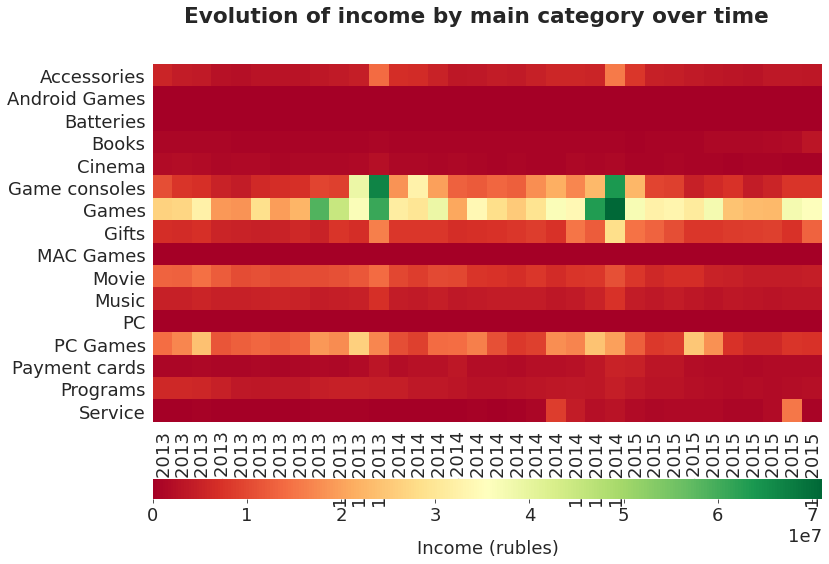

In [152]:
data_graph = check.pivot_table(
    values="item_revenue", columns="date_block_num",
    index="main_category", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (.9, .05), "hspace": .3},
    figsize=(12, 8))
fig.suptitle("Evolution of income by main category over time")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Income (rubles)"})
ax.tick_params(axis="x", rotation=90)
ax.set_xticklabels(
    graph_dates.sort_values(by="date_block_num").month_year)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

The company seems to have begun a double diversification. Firstly, it develops a new distribution chanel (we previously saw that online sales are increasing). It has also diversified its offer : sales of books and services are pretty new and are increasing.

**Average quantity and price by category and main category**

In [153]:
check = data_month[["item_category_name", "main_category",
                    "item_cnt_month", "item_mean_price_month"]].copy()

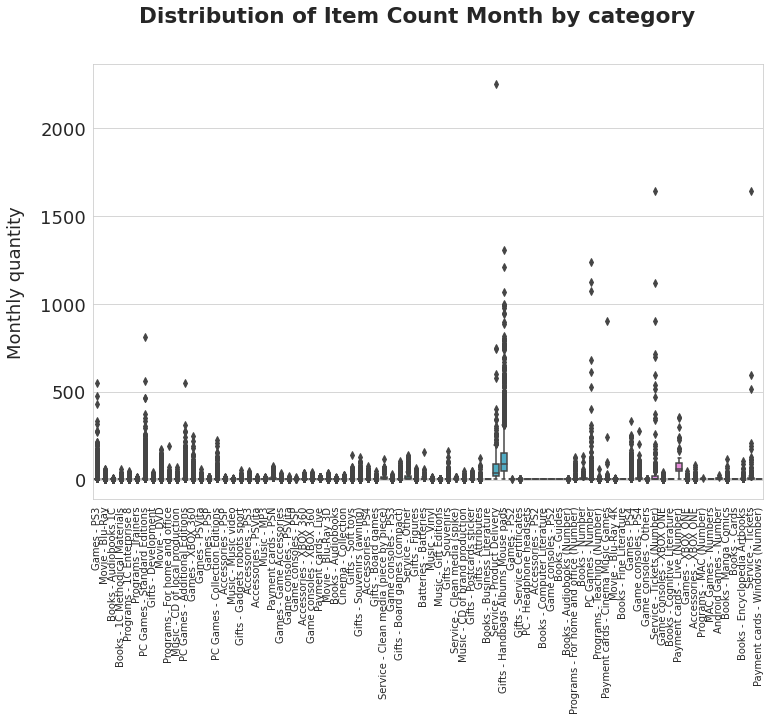

In [154]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of Item Count Month by category")
sns.boxplot(x="item_category_name", y="item_cnt_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=10)
ax.set_xlabel("")
ax.set_ylabel("Monthly quantity")
plt.show()

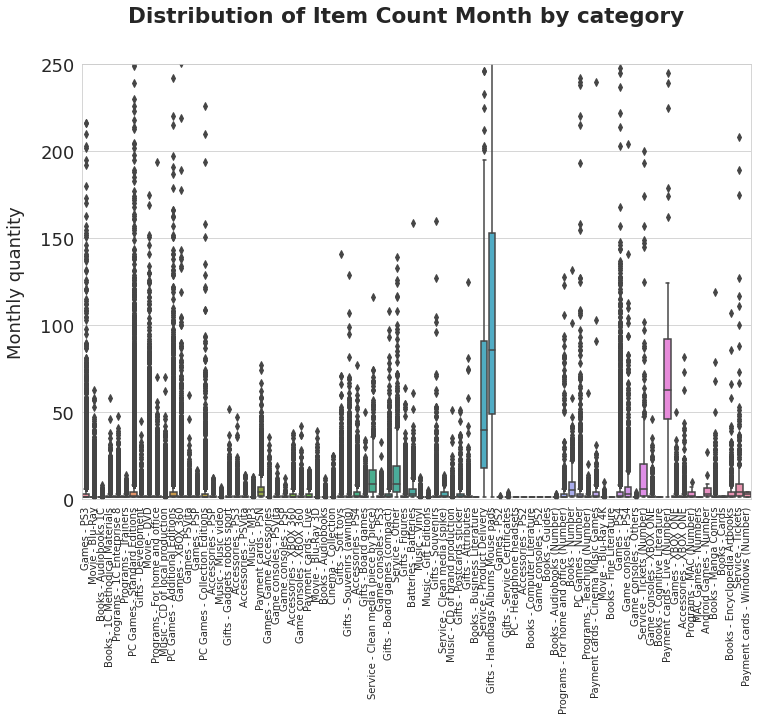

In [155]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of Item Count Month by category")
sns.boxplot(x="item_category_name", y="item_cnt_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=10)
ax.set_xlabel("")
ax.set_ylabel("Monthly quantity")
ax.set_ylim([0, 250])
plt.show()

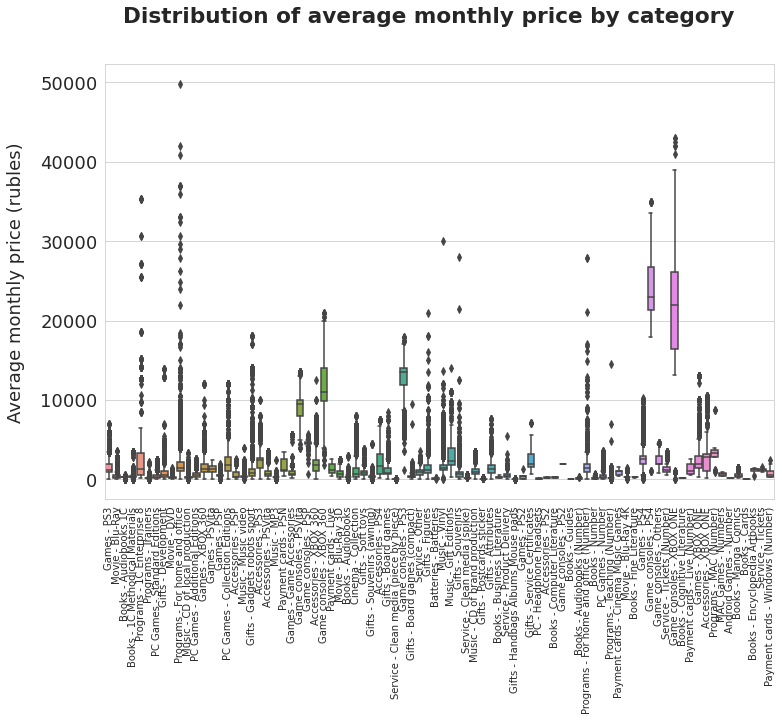

In [156]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of average monthly price by category")
sns.boxplot(x="item_category_name", y="item_mean_price_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=10)
ax.set_xlabel("")
ax.set_ylabel("Average monthly price (rubles)")
plt.show()

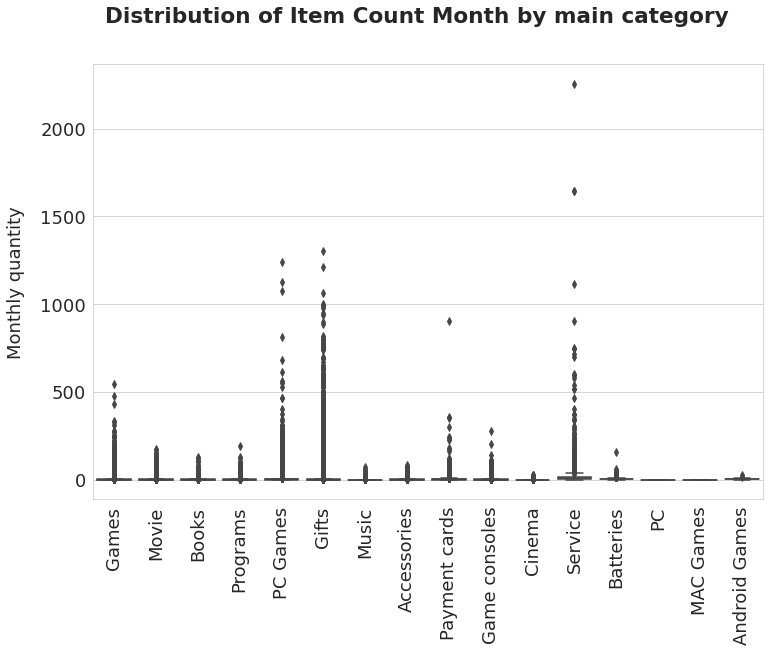

In [157]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of Item Count Month by main category")
sns.boxplot(x="main_category", y="item_cnt_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Monthly quantity")
plt.show()

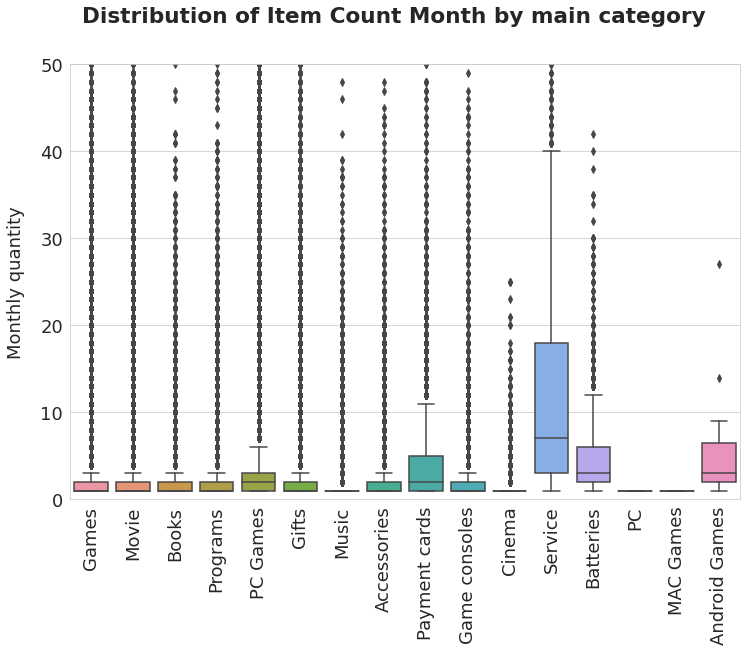

In [158]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of Item Count Month by main category")
sns.boxplot(x="main_category", y="item_cnt_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Monthly quantity")
ax.set_ylim([0, 50])
plt.show()

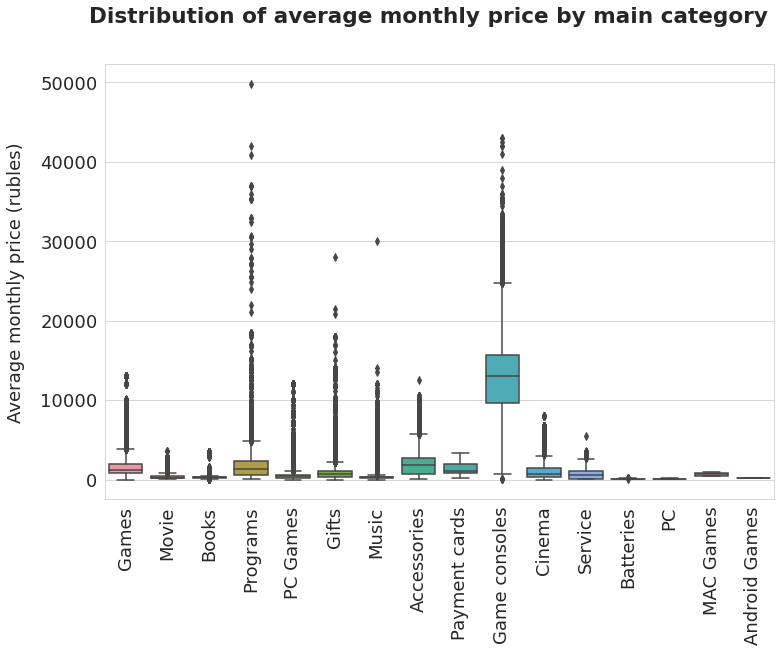

In [159]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of average monthly price by main category")
sns.boxplot(x="main_category", y="item_mean_price_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("Average monthly price (rubles)")
plt.show()

Categories and main categories are pertinent indicators to get a clue about the number of sold items.

<a id="305"></a>
## 3.5. Concentration analysis

**Concentration by items**

In [160]:
check = data_month[["item_id", "item_name", "item_cnt_month",
                    "item_revenue"]].groupby(
    ["item_id", "item_name"]).sum()
check.reset_index(inplace=True)

In [161]:
check.sort_values(by="item_cnt_month", inplace=True)
listdata = check.item_cnt_month.values
lorenz = np.cumsum(np.sort(listdata)) / listdata.sum()
lorenz = np.append([0], lorenz)
aire_ss_courbe = lorenz[:-1].sum() / len(lorenz)
S = 0.5 - aire_ss_courbe
gini = 2 * S

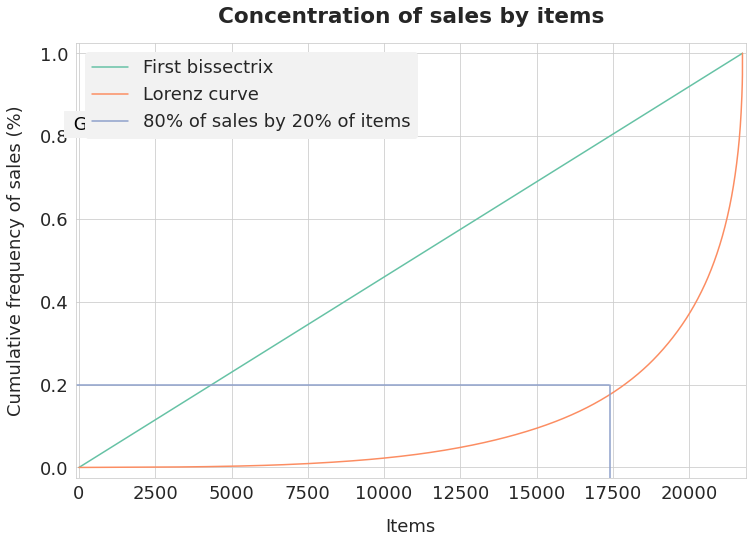

In [162]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
ax.plot(np.linspace(0, 1, len(lorenz)), label="First bissectrix")
ax.plot(lorenz, label="Lorenz curve")
ax.set_ylim([-0.025, 1.025])
ax.set_xlim([-100, len(lorenz) + 100])
ax.axhline(y=0.2, xmax=0.8*(len(lorenz)+100)/(len(lorenz)+200),
           color=list_colors[2],
           label="80% of sales by 20% of items")
ax.axvline(x=0.8*len(lorenz), ymax=(0.2+0.025)/1.05,
           color=list_colors[2])
ax.set_ylabel("Cumulative frequency of sales (%)")
ax.set_xlabel("Items")
ax.legend(loc="upper left")
plt.text(1500, 0.85, " Gini = {:.2f} ".format(gini),\
         horizontalalignment="center", verticalalignment="top",
         color="black", backgroundcolor=(0.95, 0.95, 0.95))
plt.title("Concentration of sales by items")
plt.show()

The 20% most sold items represent a little more than 80% of sales. This is a usual ratio in business.

In [163]:
idx = np.searchsorted(lorenz, 0.8)
idx -= 1
print("Lorenz value for last {} items = {:.2%}".format(
    len(lorenz) - idx, lorenz[idx]))

Lorenz value for last 98 items = 79.95%


20% of sales come from only 98 items. I can select those items to have an idea of sales evolution by items, as I can't graph all items.

In [164]:
items_to_graph = check.iloc[idx:].item_id.values

In [165]:
check.sort_values(by="item_revenue", inplace=True)
listdata = check.item_revenue.values
lorenz = np.cumsum(np.sort(listdata)) / listdata.sum()
lorenz = np.append([0], lorenz)
aire_ss_courbe = lorenz[:-1].sum() / len(lorenz)
S = 0.5 - aire_ss_courbe
gini = 2 * S

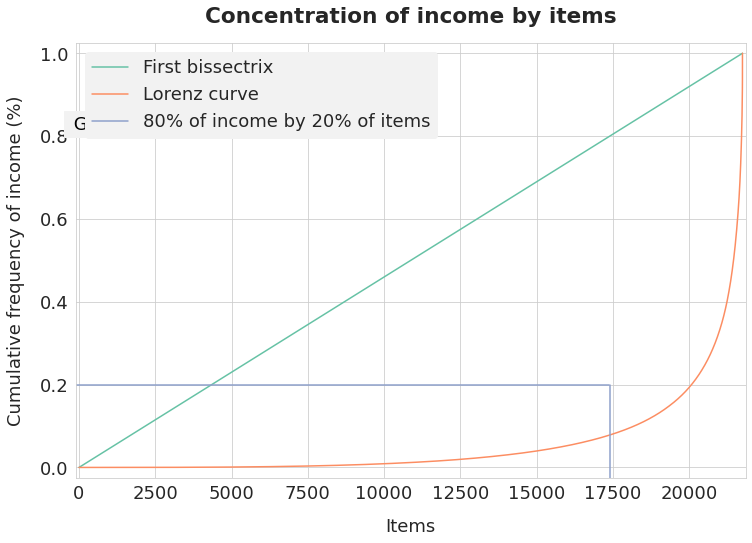

In [166]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
ax.plot(np.linspace(0, 1, len(lorenz)), label="First bissectrix")
ax.plot(lorenz, label="Lorenz curve")
ax.set_ylim([-0.025, 1.025])
ax.set_xlim([-100, len(lorenz)+100])
ax.axhline(y=0.2, xmax=0.8*(len(lorenz)+100)/(len(lorenz)+200),
           color=list_colors[2],
           label="80% of income by 20% of items")
ax.axvline(x=0.8*len(lorenz),
           ymax=(0.2+0.025)/1.05, color=list_colors[2])
ax.set_ylabel("Cumulative frequency of income (%)")
ax.set_xlabel("Items")
ax.legend(loc="upper left")
plt.text(1500, 0.85, " Gini = {:.2f} ".format(gini),\
         horizontalalignment="center", verticalalignment="top",
         color="black", backgroundcolor=(0.95, 0.95, 0.95))
plt.title("Concentration of income by items")
plt.show()

Income is even more concentrated : 20% of items account for more than 90% of total income.

**Concentration by shops**

In [167]:
check = data_month[["shop_id", "shop_name", "item_cnt_month",
                    "item_revenue"]].groupby(
    ["shop_id", "shop_name"]).sum()
check.reset_index(inplace=True)

In [168]:
check.sort_values(by="item_cnt_month", inplace=True)
listdata = check.item_cnt_month.values
lorenz = np.cumsum(np.sort(listdata)) / listdata.sum()
lorenz = np.append([0], lorenz)
aire_ss_courbe = lorenz[:-1].sum() / len(lorenz)
S = 0.5 - aire_ss_courbe
gini = 2 * S

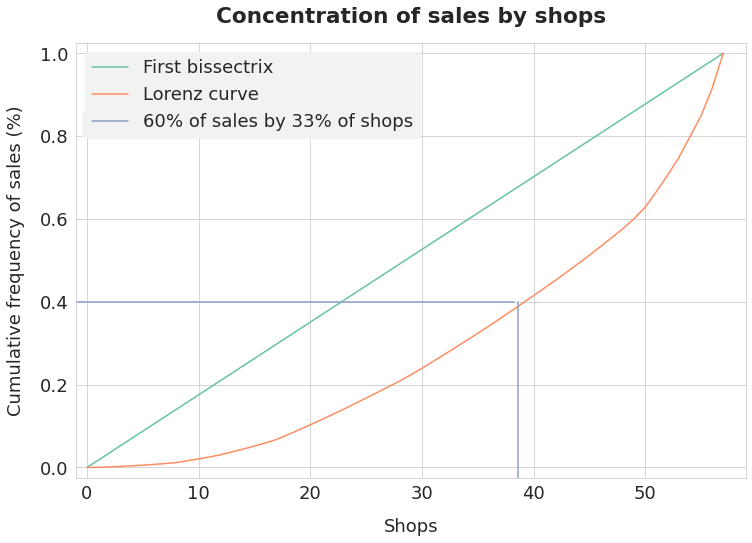

In [169]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
ax.plot(np.linspace(0, 1, len(lorenz)), label="First bissectrix")
ax.plot(lorenz, label="Lorenz curve")
ax.set_ylim([-0.025, 1.025])
ax.set_xlim([-1, len(lorenz)+1])
ax.axhline(y=0.4, xmax=0.666*(len(lorenz)+1)/(len(lorenz)+2),
           color=list_colors[2],
           label="60% of sales by 33% of shops")
ax.axvline(x=0.666*len(lorenz),
           ymax=(0.4+0.025)/1.05, color=list_colors[2])
ax.set_ylabel("Cumulative frequency of sales (%)")
ax.set_xlabel("Shops")
ax.legend(loc="upper left")
plt.text(5, 0.85," Gini = {:.2f} ".format(gini),\
         horizontalalignment="center", verticalalignment="top",
         color="black", backgroundcolor=(0.95, 0.95, 0.95))
plt.title("Concentration of sales by shops")
plt.show()

The sales by shops are more balances : a third of shops represent about 60% of sales.

In [170]:
check.sort_values(by="item_revenue", inplace=True)
listdata = check.item_revenue.values
lorenz = np.cumsum(np.sort(listdata)) / listdata.sum()
lorenz = np.append([0], lorenz)
aire_ss_courbe = lorenz[:-1].sum() / len(lorenz)
S = 0.5 - aire_ss_courbe
gini = 2 * S

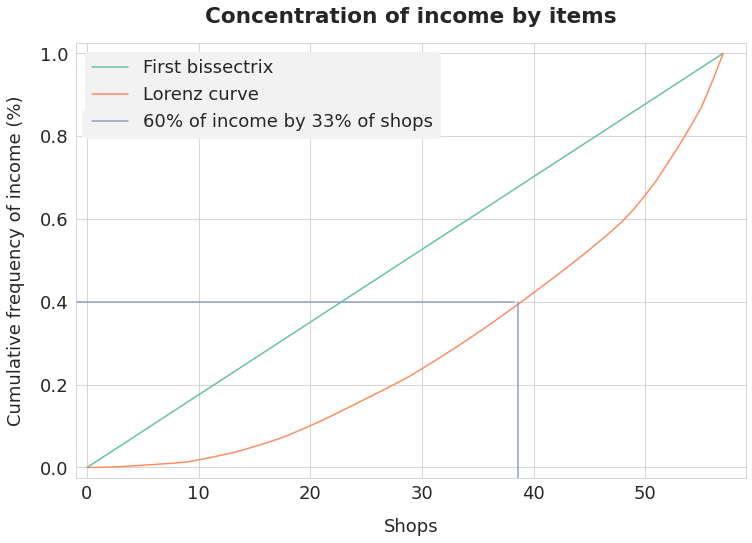

In [171]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
ax.plot(np.linspace(0, 1, len(lorenz)), label="First bissectrix")
ax.plot(lorenz, label="Lorenz curve")
ax.set_ylim([-0.025, 1.025])
ax.set_xlim([-1, len(lorenz)+1])
ax.axhline(y=0.4, xmax=0.666*(len(lorenz)+1)/(len(lorenz)+2),
           color=list_colors[2],
           label="60% of income by 33% of shops")
ax.axvline(x=0.666*len(lorenz), ymax=(0.4+0.025)/1.05,
           color=list_colors[2])
ax.set_ylabel("Cumulative frequency of income (%)")
ax.set_xlabel("Shops")
ax.legend(loc="upper left")
plt.text(5, 0.85," Gini = {:.2f} ".format(gini),\
         horizontalalignment="center", verticalalignment="top",
         color="black", backgroundcolor=(0.95, 0.95, 0.95))
plt.title("Concentration of income by items")
plt.show()

Concentration by shop is similar for sales and income.

<a id="306"></a>
## 3.6. Sales by item

I focus on the 98 items that account for 80% of sales.

In [172]:
check = data_month[np.isin(data_month.item_id, items_to_graph)]\
    [["item_id", "item_name", "item_cnt_month", "item_revenue"]].\
    groupby(["item_id", "item_name"]).sum()
check.reset_index(inplace=True)

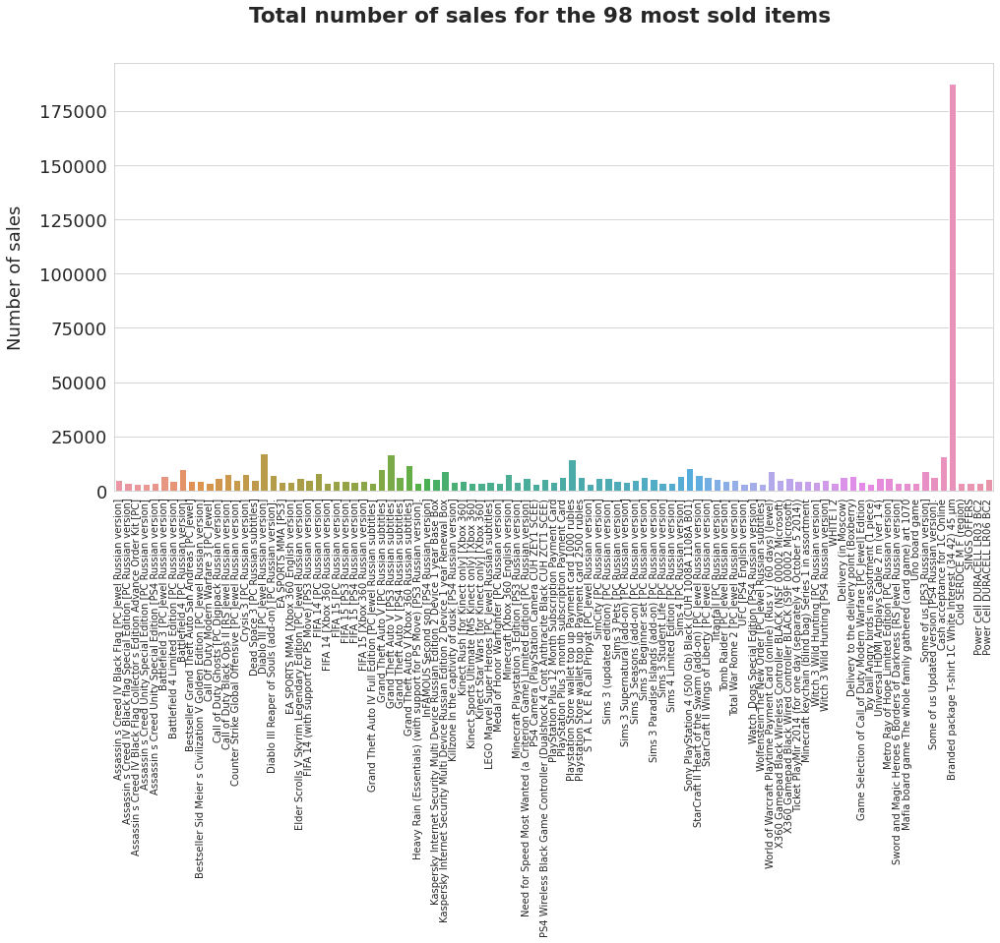

In [173]:
fig = plt.figure(figsize=(16, 8))
ax = plt.axes()
fig.suptitle("Total number of sales for the 98 most sold items")
sns.barplot(x=check.item_name, y=check.item_cnt_month, ax=ax)
ax.tick_params(axis='x', rotation=90, labelsize=10)
ax.set_xlabel("")
ax.set_ylabel("Number of sales")
plt.show()

One item has sales much higher than others. Let's look at it.

In [174]:
check[check.item_cnt_month > 25000]

,item_id,item_name,item_cnt_month,item_revenue
92,20949,Branded package T-shirt 1C White Interest (34 ...,187642,928863.70


In [175]:
data_month[data_month.item_id == 20949]\
    [["date_block_num", "shop_id", "item_price"]].nunique()

date_block_num     31
shop_id            52
item_price        128
dtype: int64

This item has been sold during 31 weeks, in 52 different shops, at 126 different prices. It's not a one-shot sale.

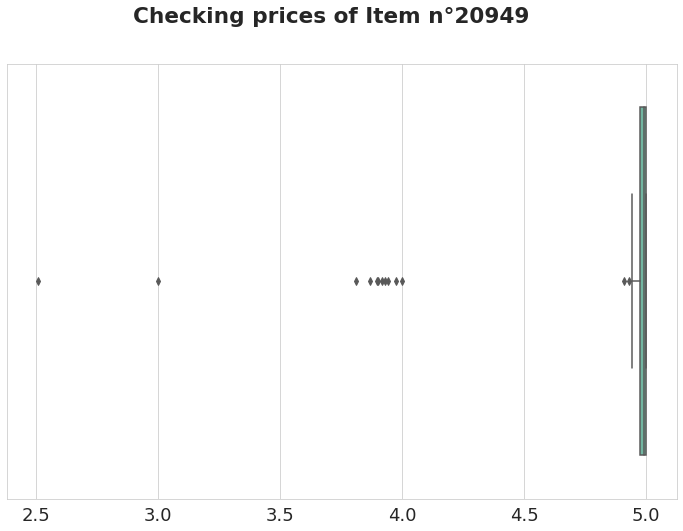

In [176]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Checking prices of Item n°20949")
sns.boxplot(
    x=data_month[data_month.item_id==20949].item_price.unique(),
    ax=ax)
plt.show()

It's a cheap item with a regular price of around 5 rubles, and a few sales occuring at a lower price.

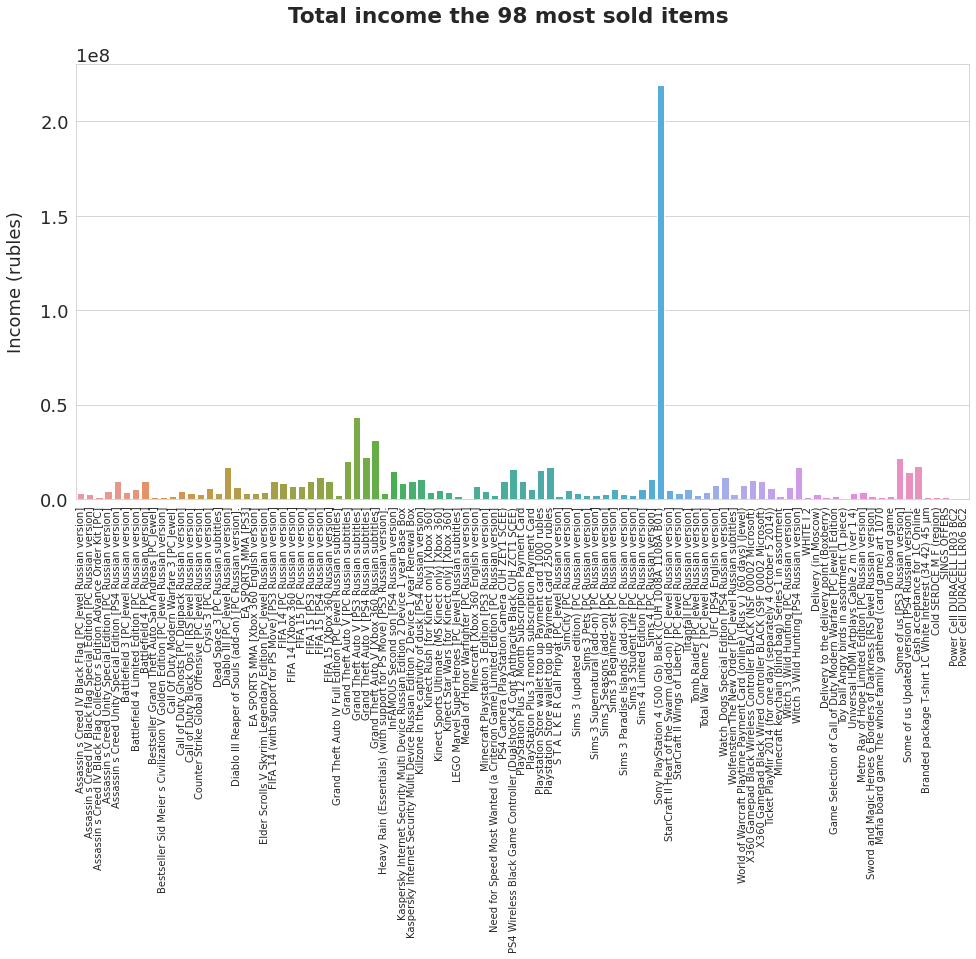

In [177]:
fig = plt.figure(figsize=(16, 8))
ax = plt.axes()
fig.suptitle("Total income the 98 most sold items")
sns.barplot(x=check.item_name, y=check.item_revenue, ax=ax)
ax.tick_params(axis='x', rotation=90, labelsize=10)
ax.set_xlabel("")
ax.set_ylabel("Income (rubles)")
plt.show()

In [178]:
check = data_month[np.isin(data_month.item_id, items_to_graph)]\
    [["date_block_num", "item_name", "item_cnt_month",
      "item_revenue"]].groupby(
    ["date_block_num", "item_name"]).sum()
check.reset_index(inplace=True)

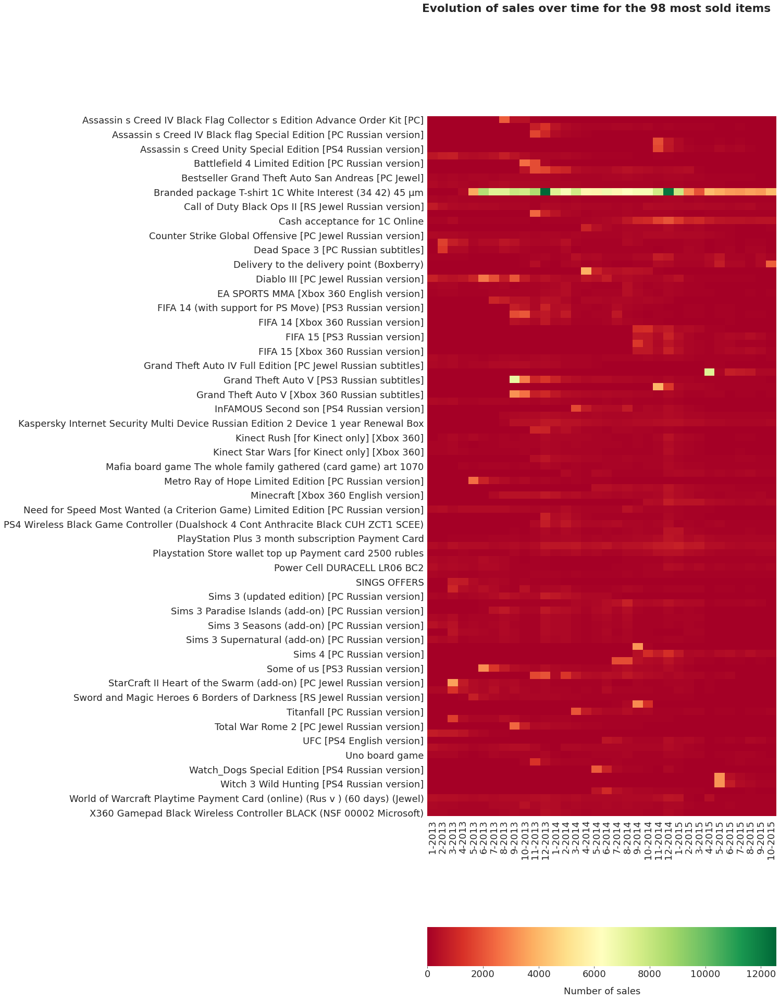

In [179]:
data_graph = check.pivot_table(
    values="item_cnt_month", columns="date_block_num",
    index="item_name", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (.9, .05), "hspace": .3},
    figsize=(12, 30))
fig.suptitle("Evolution of sales over time for the 98 most " +
             "sold items")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.set_xticklabels(
    graph_dates.sort_values(by="date_block_num").month_year)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

We see that the sales of an item tend to decrease when it gets older. The most sold item is an exception with sales at a very high level for a long time.  
For a better readability, I do one more time the same graph without that particular item.

In [180]:
item_name = items[items.item_id == 20949].item_name.values[0]
check = check[check.item_name != item_name]

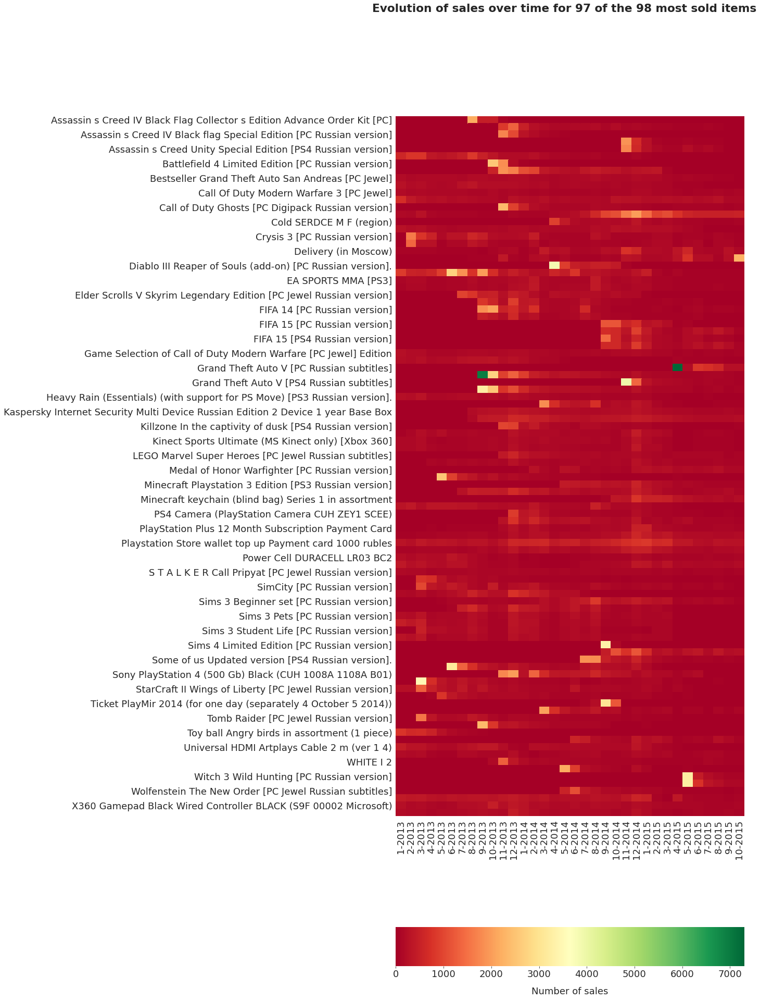

In [181]:
data_graph = check.pivot_table(
    values="item_cnt_month", columns="date_block_num",
    index="item_name", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (.9, .05), "hspace": .3},
    figsize=(12, 30))
fig.suptitle("Evolution of sales over time for 97 of " +
             "the 98 most sold items")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.set_xticklabels(
    graph_dates.sort_values(by="date_block_num").month_year)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

Some services related to online sales seem to be increasing : cash acceptance and delivery to the delivery point.

**Average monthly quantity and price by item (for the 98 most sold items)**

In [182]:
check = data_month[np.isin(data_month.item_id, items_to_graph)]\
    [["item_name", "item_cnt_month", "item_mean_price_month"]].copy()

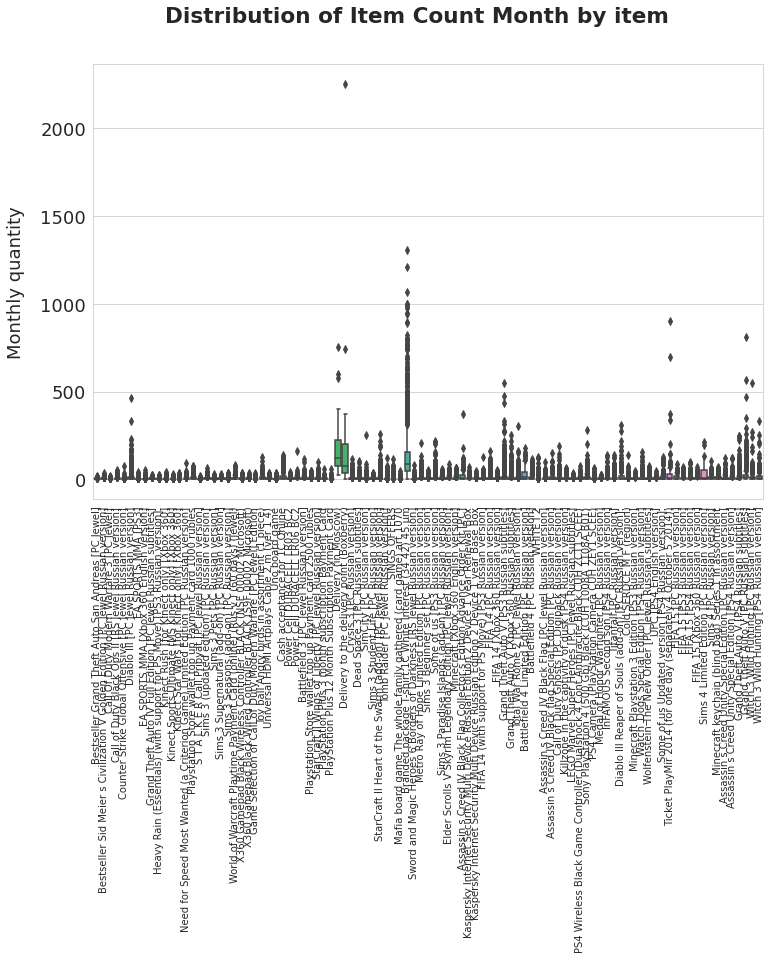

In [183]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of Item Count Month by item")
sns.boxplot(x="item_name", y="item_cnt_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=10)
ax.set_xlabel("")
ax.set_ylabel("Monthly quantity")
plt.show()

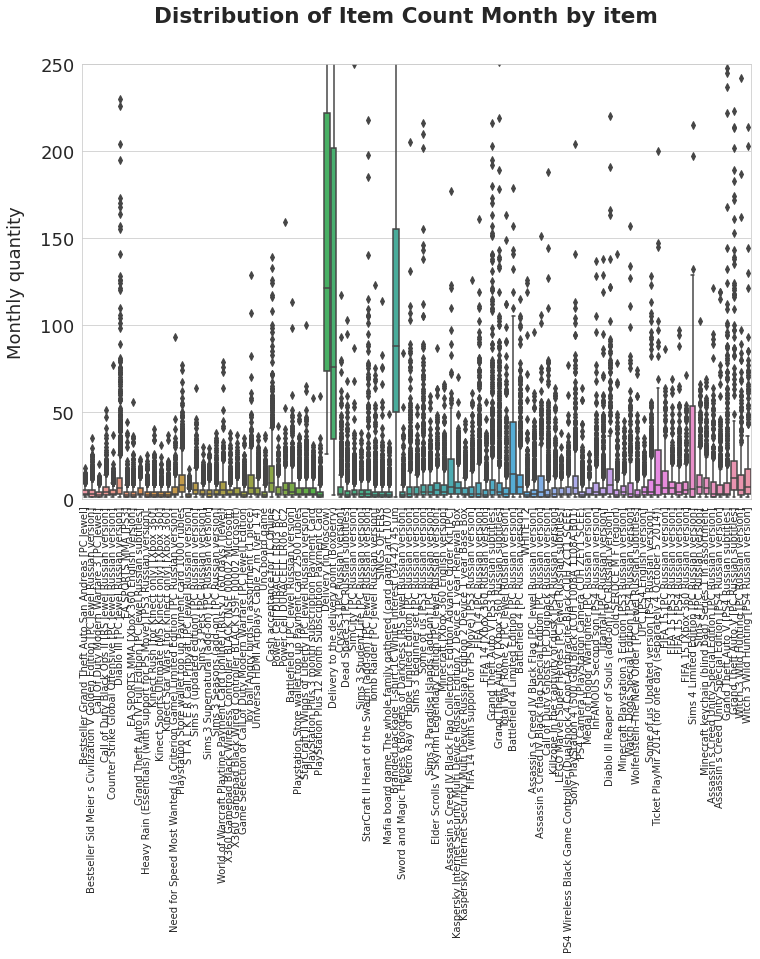

In [184]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of Item Count Month by item")
sns.boxplot(x="item_name", y="item_cnt_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=10)
ax.set_xlabel("")
ax.set_ylabel("Monthly quantity")
ax.set_ylim([0, 250])
plt.show()

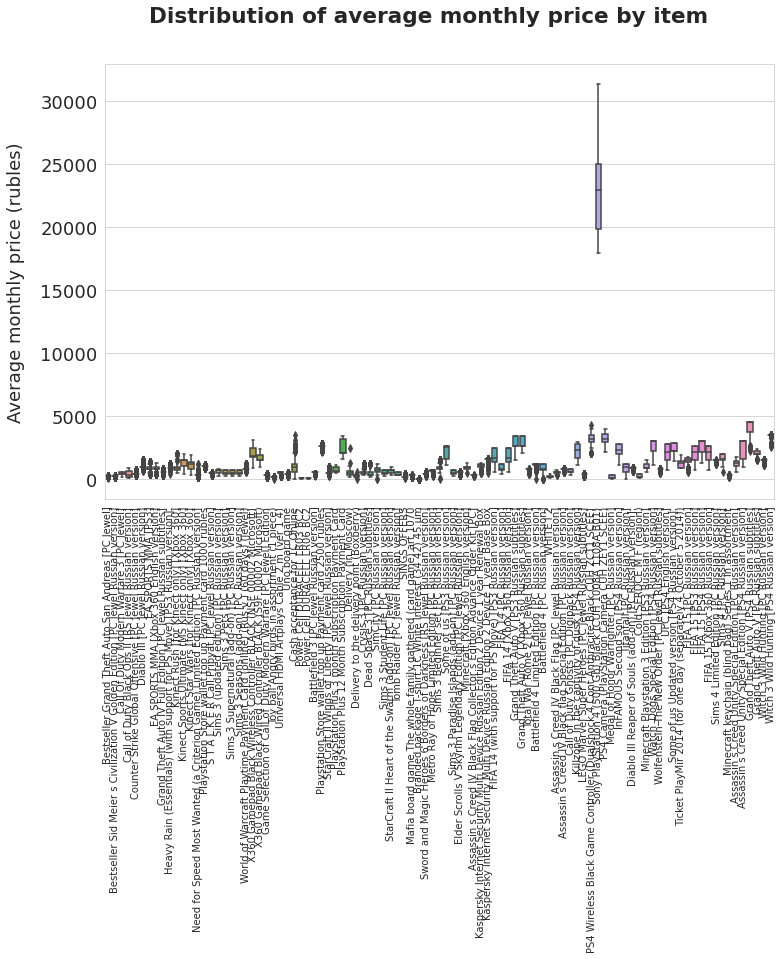

In [185]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Distribution of average monthly price by item")
sns.boxplot(x="item_name", y="item_mean_price_month",
            data=check, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=10)
ax.set_xlabel("")
ax.set_ylabel("Average monthly price (rubles)")
plt.show()

Monthly quantities and average prices are different according to items.

<a id="307"></a>
## 3.7. Items and shops to predict

**Items to predict**

In [186]:
items_id = topredict.item_id.unique()
print("We have to predict sales for {} items".format(len(items_id)) +
      " (on a total number of {} items)".format(len(items)))

We have to predict sales for 5100 items (on a total number of 22120 items)


In [187]:
print("There are {} new items in the prediction list".format(
    len(items_id) - 
    np.isin(items_id, data_month.item_id.unique()).sum()))

There are 362 new items in the prediction list


In [188]:
topredict_check = \
    data_month[np.isin(data_month.item_id, items_id)].copy()

**Inactive items**

In [189]:
check = topredict_check.groupby("item_id")[["date_block_num"]].max()
check.reset_index(inplace=True)
check["months_since_last_sale"] = 33 - check.date_block_num
check = check.groupby("months_since_last_sale").count()

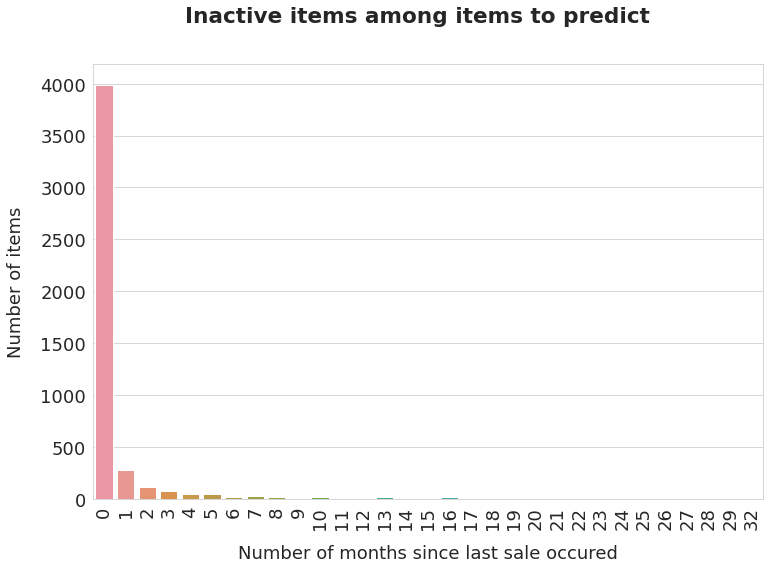

In [190]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Inactive items among items to predict")
sns.barplot(x=check.index, y=check.item_id, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("Number of months since last sale occured")
ax.set_ylabel("Number of items")
plt.show()

If I consider that items not sold in the last 3 months are inactive, I can group them in an inactive group and have their count.

In [191]:
check.loc["3 and more", "item_id"] = check.loc[3:, "item_id"].sum()
check = check.iloc[[0, 1, 2, -1]]

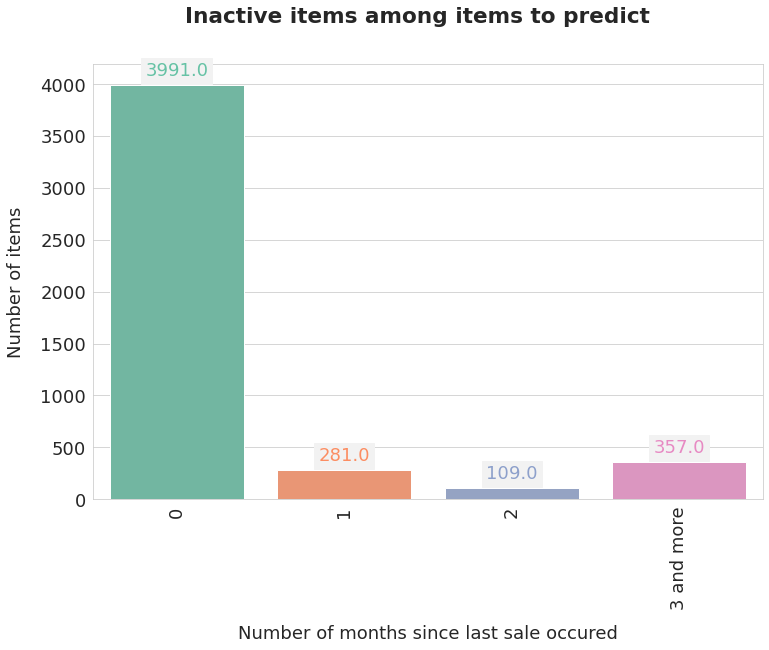

In [192]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Inactive items among items to predict")
sns.barplot(x=check.index, y=check.item_id, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("Number of months since last sale occured")
ax.set_ylabel("Number of items")
for idx, nb in enumerate(check.item_id):
    ax.text(idx, nb+50, nb, ha="center", va="bottom",
            color=list_colors[idx],
            backgroundcolor=(0.95, 0.95, 0.95))
plt.show()

356 items haven't been sold in the last 3 months or more. I think their sales can be fixed to 0 for the next month. I keep track of the number of months of inactivity in the data_month dataframe. I also add a boolean to track items that will be predicted. By doing so, I can easily change the threshold for inactivity and the strategy of getting rid of not-to-predict items or of inactive items.

**Shops to predict**

In [193]:
shops_id = topredict.shop_id.unique()
print("We have to predict sales for " +
      "{} shops (on a total number of {} shops)".format(
          len(shops_id), len(shops)))

We have to predict sales for 42 shops (on a total number of 57 shops)


In [194]:
print("There are {} new shops in the prediction list".format(
    len(shops_id) -
    np.isin(shops_id, data_month.shop_id.unique()).sum()))

There are 0 new shops in the prediction list


In [195]:
topredict_check = \
    data_month[np.isin(data_month.shop_id, shops_id)].copy()

**Inactive shops**

In [196]:
check = topredict_check.groupby("shop_id")[["date_block_num"]].max()
check.reset_index(inplace=True)
check["months_since_last_sale"] = 33 - check.date_block_num
check = check.groupby("months_since_last_sale").count()

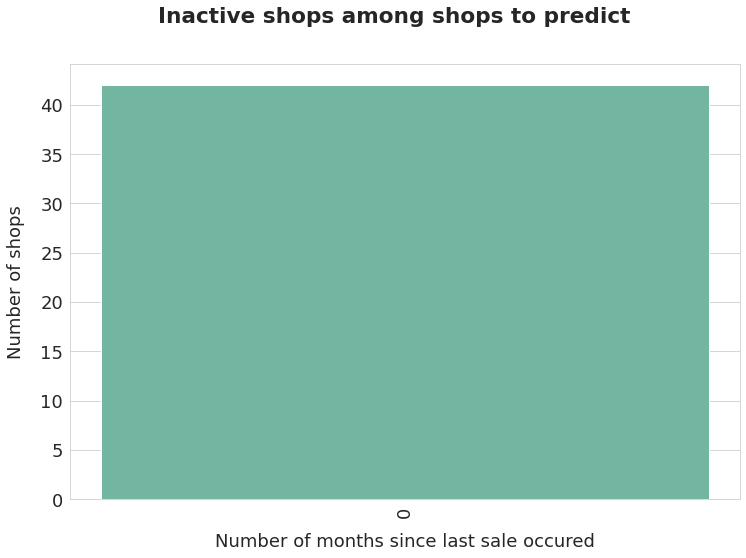

In [197]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Inactive shops among shops to predict")
sns.barplot(x=check.index, y=check.shop_id, ax=ax)
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("Number of months since last sale occured")
ax.set_ylabel("Number of shops")
plt.show()

All shops to predict are active.

<a id="308"></a>
## 3.8. Shops : more in-depth analysis

**Inactive shops**

I check inactivity accross all shops, not only the ones to predict.

In [198]:
check = data_month.groupby(["shop_id", "shop_name"])\
    [["date_block_num"]].max()
check.reset_index(inplace=True)
check["shop_months_inactivity"] = 33 - check.date_block_num
check["shop_topredict"] = np.isin(check.shop_id, shops_id)

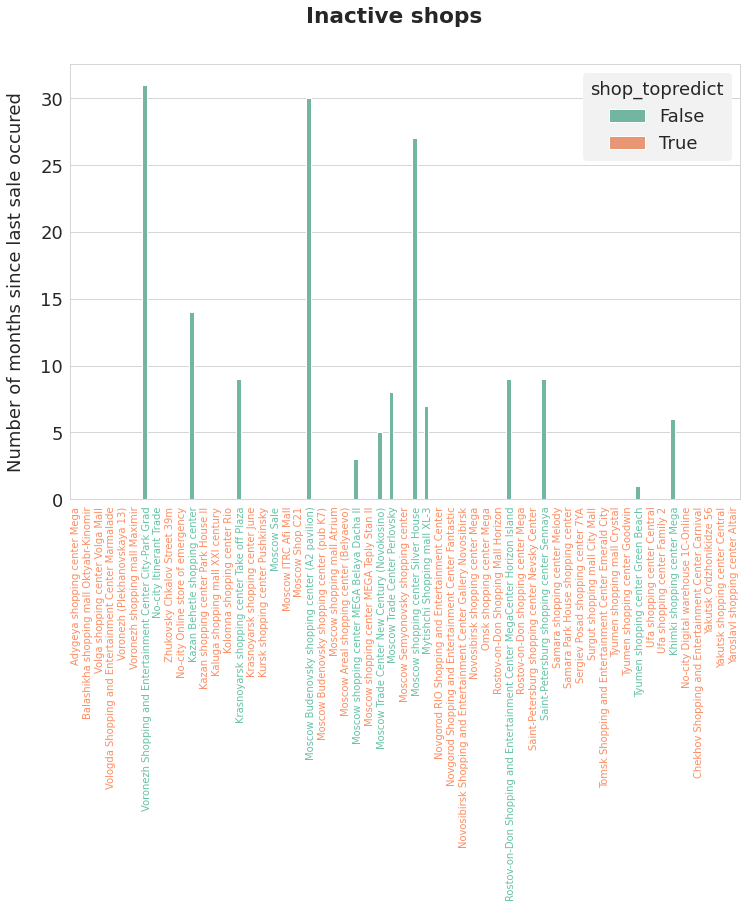

In [199]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Inactive shops")
sns.barplot(x=check.shop_name, y=check.shop_months_inactivity,
            hue=check.shop_topredict, ax=ax)
ax.tick_params(axis="x", rotation=90, labelsize=10)
for i, xt in enumerate(ax.get_xticklabels()):
    if check.iloc[i].shop_topredict:
        xt.set_color(list_colors[1])
    else:
        xt.set_color(list_colors[0])
ax.set_xlabel("")
ax.set_ylabel("Number of months since last sale occured")
plt.show()

We don't have to predict for shops with one month or more of inactivity. We also don't need to predict for the shops with the types "sale" and "itinerant". Remember that those 2 shops seem to sell only in October.

**Sales by day of week for shop to predict**

In [200]:
check = data[np.isin(data.shop_id, shops_id)].\
    groupby(["shop_id", "shop_name", "day_of_week"])\
    [["item_cnt_day", "item_revenue"]].sum()
check.reset_index(inplace=True)

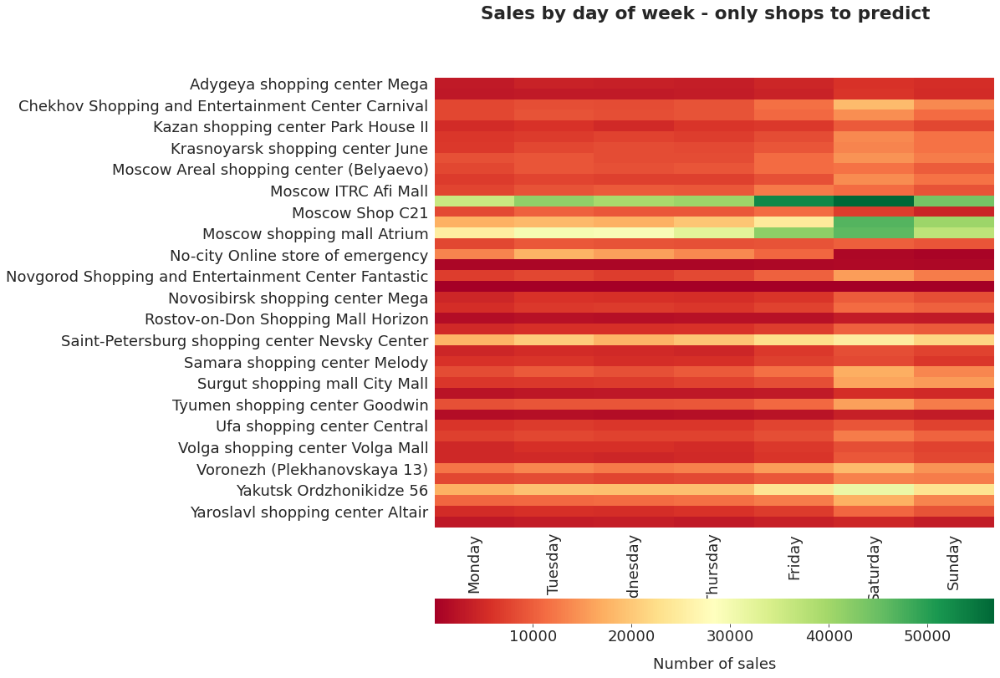

In [201]:
data_graph = check.pivot_table(
    values="item_cnt_day", columns="day_of_week",
    index="shop_name", aggfunc="sum", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (.9, .05), "hspace": .3},
    figsize=(12, 12))
fig.suptitle("Sales by day of week - only shops to predict")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.set_xticklabels(week_days)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

Most shops have a similar sales pattern. They sell more on Friday and on week-end days. There are two important exceptions to this rule : online services. The online shop seems to have almost constant sales during all the week. The emergency online is not very active during the week-end.

**Sales by category for shops to predict**

In [202]:
check = data_month[np.isin(data_month.shop_id, shops_id)].\
    groupby(["shop_id", "shop_name", "item_category_name"])\
    [["item_cnt_month", "item_revenue"]].sum()
check.reset_index(inplace=True)

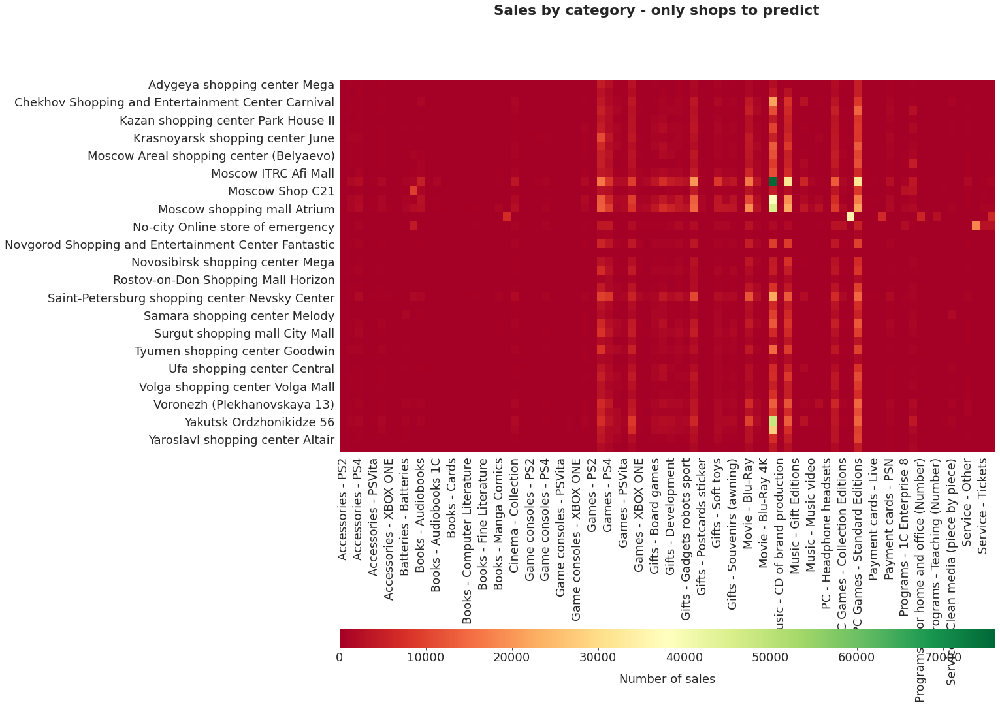

In [203]:
data_graph = check.pivot_table(
    values="item_cnt_month", columns="item_category_name",
    index="shop_name", aggfunc="sum", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (1., .05), "hspace": .9},
    figsize=(18, 16))
fig.suptitle("Sales by category - only shops to predict")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

I do the same graph without the category "Movie - DVD" to have a better analysis of other data.

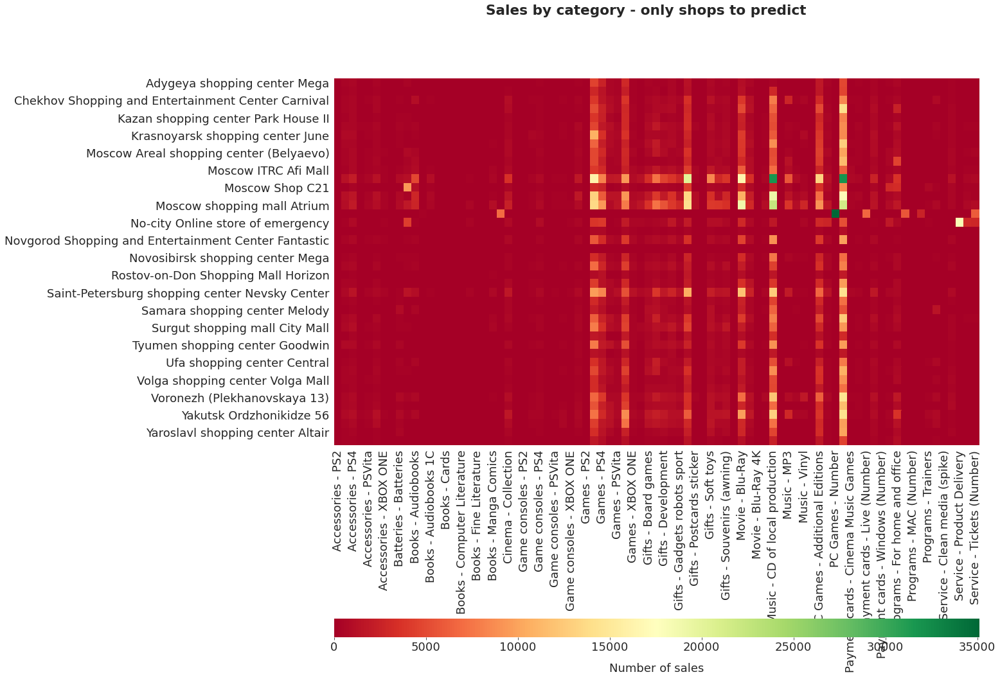

In [204]:
data_graph = check[check.item_category_name != "Movie - DVD"].\
    pivot_table(
    values="item_cnt_month", columns="item_category_name",
    index="shop_name", aggfunc="sum", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (1., .05), "hspace": .9},
    figsize=(18, 16))
fig.suptitle("Sales by category - only shops to predict")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

I notice one important thing : some categories are sold only by the online shop. Let's have a closer look at that.

In [205]:
check = data_month[np.isin(data_month.shop_id, shops_id)].\
    groupby("item_category_name")[["shop_id"]].nunique()

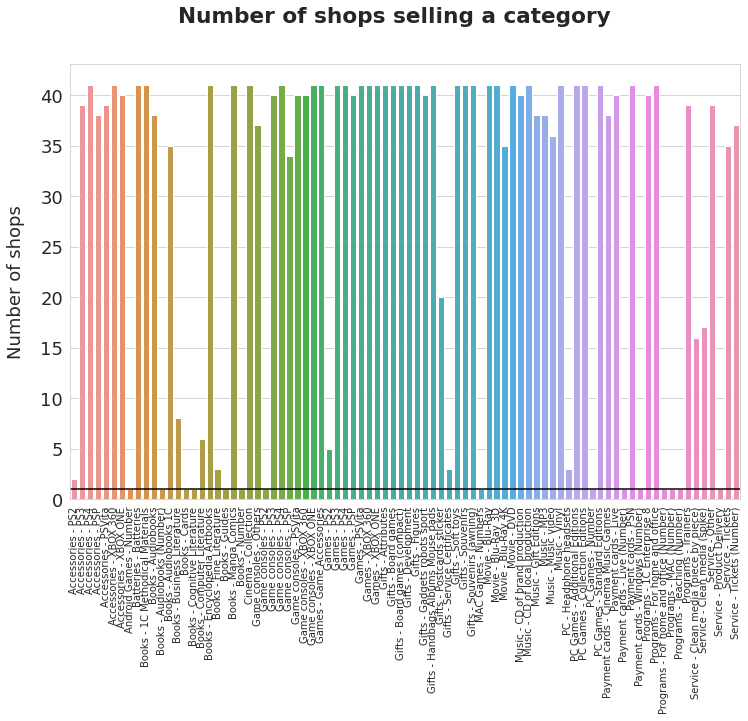

In [206]:
fig = plt.figure(figsize=(12, 8))
ax = plt.axes()
fig.suptitle("Number of shops selling a category")
sns.barplot(x=check.index, y=check.shop_id, ax=ax)
ax.axhline(y=1, color="black")
ax.tick_params(axis="x", rotation=90, labelsize=10)
ax.set_xlabel("")
ax.set_ylabel("Number of shops")
plt.show()

Let's check what is the shop for each of the 14 categories with only one shop.

In [207]:
cat_to_check = check[check.shop_id == 1].index
print("Category name   -   Shop name")
for cat in cat_to_check:
    check = data_month[(np.isin(data_month.shop_id, shops_id)) &
                       (data_month.item_category_name == cat)].\
                       shop_name.unique()
    print("{} - {}".format(cat, check))

Category name   -   Shop name
Android Games - Number - ['No-city Digital warehouse 1C-Online']
Books - Audiobooks (Number) - ['No-city Digital warehouse 1C-Online']
Books - Cards - ['Zhukovsky Chkalov Street 39m']
Books - Cognitive Literature - ['Omsk shopping center Mega']
Books - Guides - ['Volga shopping center Volga Mall']
Books - Number - ['No-city Digital warehouse 1C-Online']
Game consoles - PS2 - ['Moscow Areal shopping center (Belyaevo)']
MAC Games - Numbers - ['No-city Digital warehouse 1C-Online']
PC Games - Number - ['No-city Digital warehouse 1C-Online']
Payment cards - Live (Number) - ['No-city Digital warehouse 1C-Online']
Payment cards - Windows (Number) - ['No-city Digital warehouse 1C-Online']
Programs - For home and office (Number) - ['No-city Digital warehouse 1C-Online']
Programs - MAC (Number) - ['No-city Digital warehouse 1C-Online']
Programs - Teaching (Number) - ['No-city Digital warehouse 1C-Online']
Service - Product Delivery - ['No-city Online store of emerg

All categories with number in their name seem to be sold only by the online shop. I check that point.  
Service - Product Delivery is sold only by the online store of emergency.

In [208]:
categories[categories.item_category_name.str.contains("Number")]

,item_category_name,item_category_id,main_category
8,Service - Tickets (Number),8,Service
26,Android Games - Number,26,Android Games
27,MAC Games - Numbers,27,MAC Games
31,PC Games - Number,31,PC Games
34,Payment cards - Live (Number),34,Payment cards
36,Payment cards - Windows (Number),36,Payment cards
44,Books - Audiobooks (Number),44,Books
54,Books - Number,54,Books
74,Programs - MAC (Number),74,Programs
76,Programs - For home and office (Number),76,Programs


In [209]:
data_month[(np.isin(data_month.shop_id, shops_id)) &
    (data_month.item_category_name == "Service - Tickets (Number)")].\
    shop_name.unique()

array(['Balashikha shopping mall Oktyabr-Kinomir',
       'Voronezh (Plekhanovskaya 13)',
       'No-city Online store of emergency',
       'Kaluga shopping mall XXI century', 'Kolomna shopping center Rio',
       'Kursk shopping center Pushkinsky', 'Moscow ITRC Afi Mall',
       'Moscow Shop C21', 'Moscow shopping mall Atrium',
       'Moscow Areal shopping center (Belyaevo)',
       'Moscow shopping center MEGA Teply Stan II',
       'Moscow Semyonovsky shopping center',
       'Novgorod Shopping and Entertainment Center Fantastic',
       'Rostov-on-Don Shopping Mall Horizon',
       'Rostov-on-Don shopping center Mega',
       'Sergiev Posad shopping center 7YA', 'Ufa shopping center Central',
       'Chekhov Shopping and Entertainment Center Carnival',
       'Yaroslavl shopping center Altair',
       'Vologda Shopping and Entertainment Center Marmalade',
       'Kazan shopping center Park House II',
       'Moscow Budenovsky shopping center (pub K7)',
       'Omsk shopping cente

Except for the tickets, all categories tagged with number are sold only by the online store.

**Sales by main category for shops to predict**

In [210]:
check = data_month[np.isin(data_month.shop_id, shops_id)].\
    groupby(["shop_id", "shop_name", "main_category"])\
    [["item_cnt_month", "item_revenue"]].sum()
check.reset_index(inplace=True)

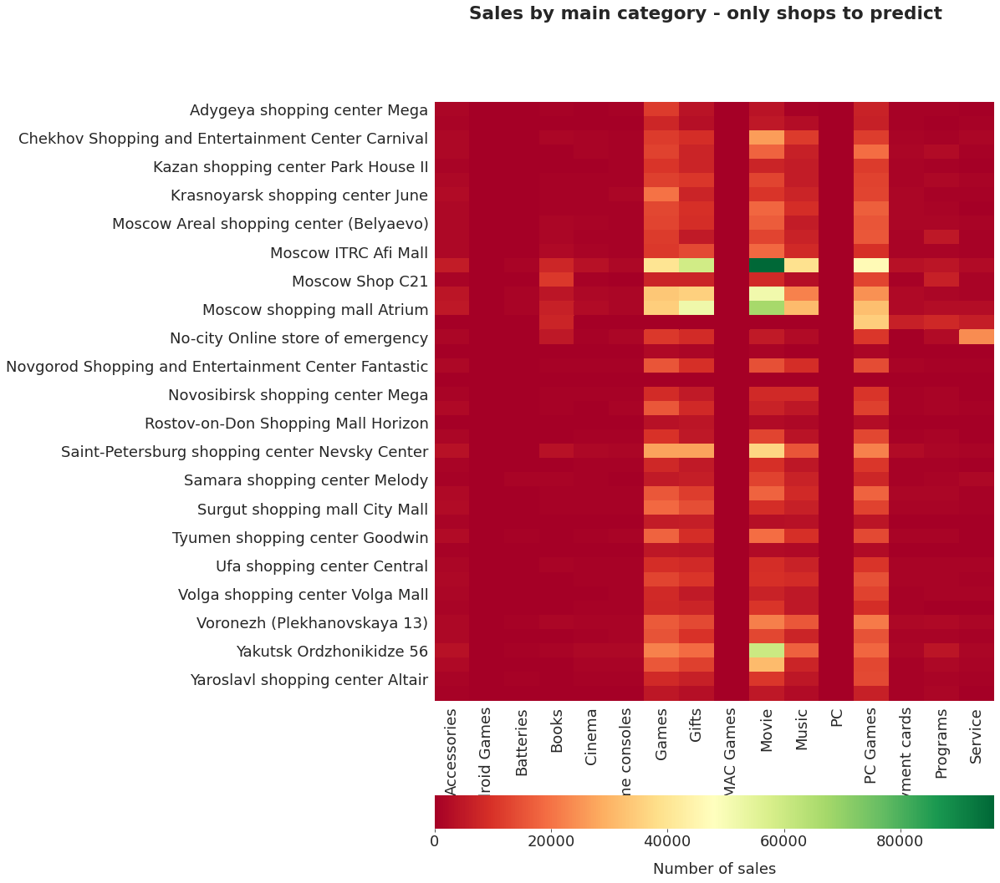

In [211]:
data_graph = check.pivot_table(
    values="item_cnt_month", columns="main_category",
    index="shop_name", aggfunc="sum", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (0.9, .05), "hspace": .3},
    figsize=(12, 16))
fig.suptitle("Sales by main category - only shops to predict")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

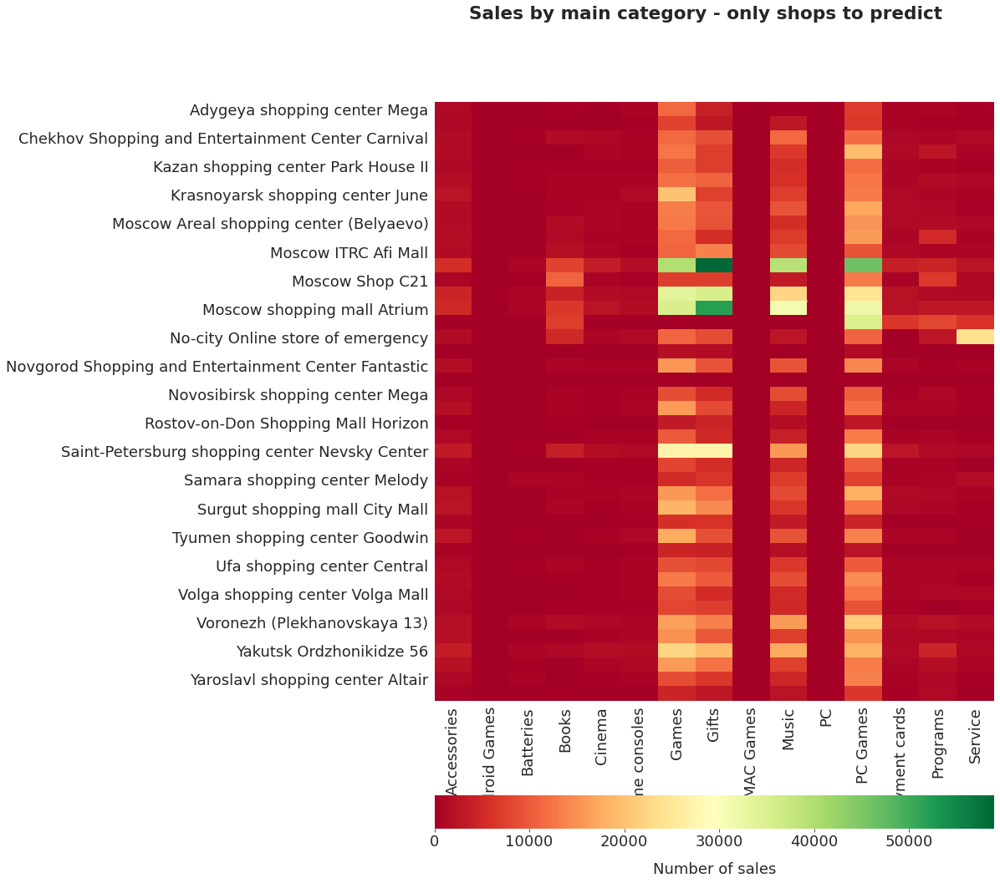

In [212]:
data_graph = check[check.main_category != "Movie"].\
    pivot_table(values="item_cnt_month", columns="main_category",
                index="shop_name", aggfunc="sum", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (0.9, .05), "hspace": .3},
    figsize=(12, 16))
fig.suptitle("Sales by main category - only shops to predict")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

**Sales of top 98 items for shops to predict**

In [213]:
check = data_month[np.isin(data_month.shop_id, shops_id) &
                   np.isin(data_month.item_id, items_to_graph)].\
    groupby(["shop_id", "shop_name", "item_id", "item_name"])\
    [["item_cnt_month", "item_revenue"]].sum()
check.reset_index(inplace=True)

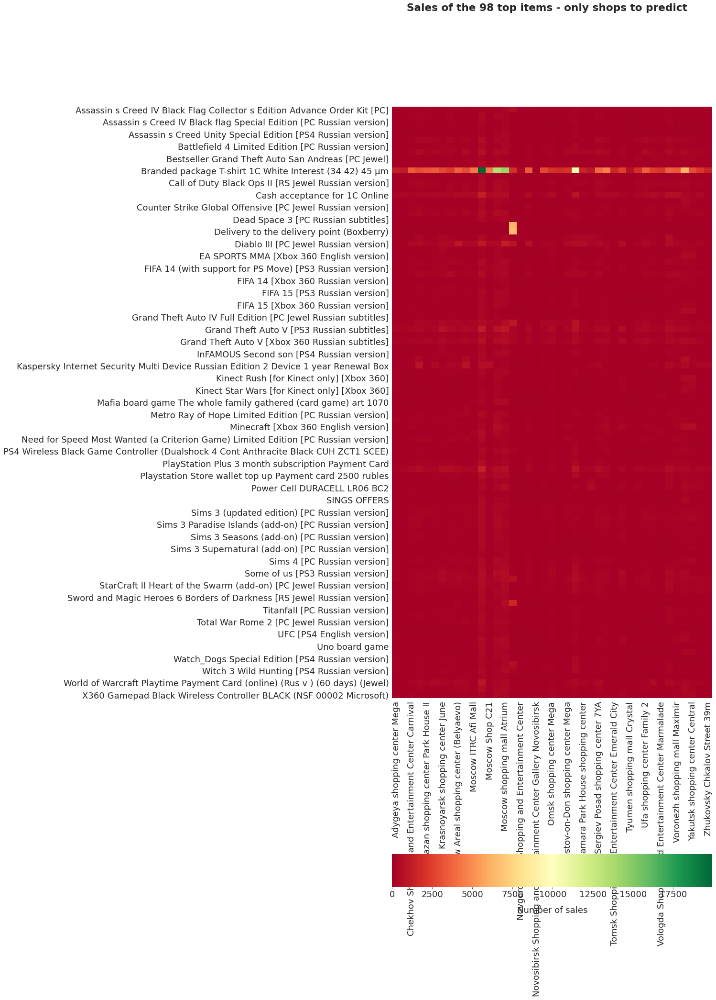

In [214]:
data_graph = check.pivot_table(
    values="item_cnt_month", columns="shop_name",
    index="item_name", aggfunc="sum", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (0.9, .05), "hspace": 0.5},
    figsize=(12, 30))
fig.suptitle("Sales of the 98 top items - only shops to predict")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

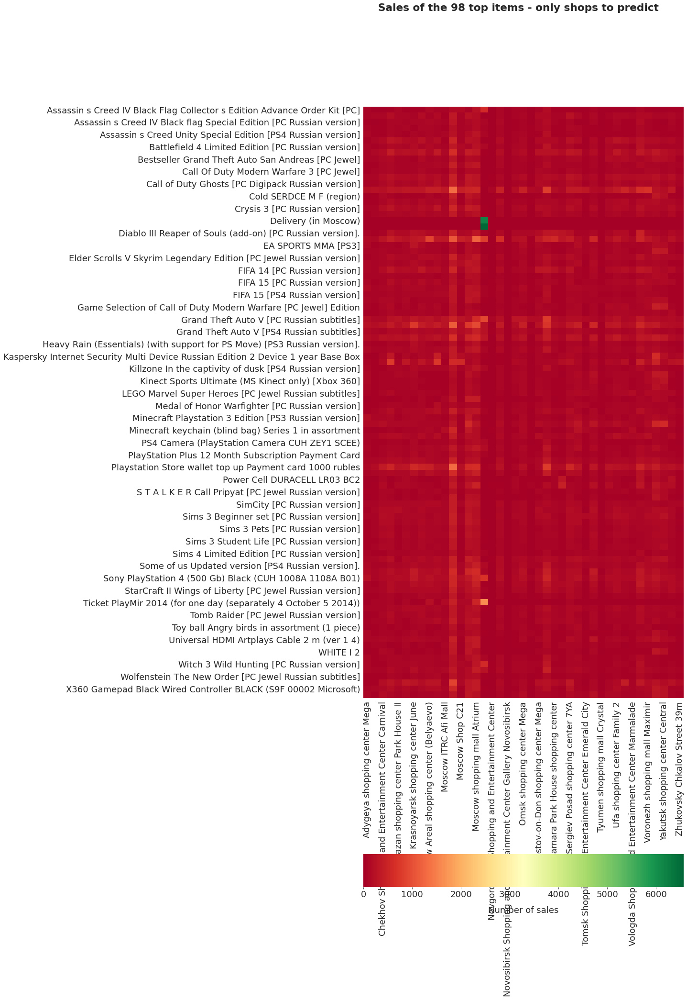

In [215]:
data_graph = check[check.item_id != 20949].\
    pivot_table(values="item_cnt_month", columns="shop_name",
                index="item_name", aggfunc="sum", fill_value=0)
fig, (ax, cbar_ax) = plt.subplots(
    2, gridspec_kw={"height_ratios": (0.9, .05), "hspace": 0.5},
    figsize=(12, 30))
fig.suptitle("Sales of the 98 top items - only shops to predict")
sns.heatmap(data_graph, cmap="RdYlGn", ax=ax, cbar_ax=cbar_ax,
            cbar_kws={"orientation": "horizontal",
                      "label": "Number of sales"})
ax.tick_params(axis="x", rotation=90, width=8)
ax.set_xlabel("")
ax.set_ylabel("")
plt.show()

This graph is not very interesting.  
One of the most sold items is the delivery service.

---
<a id="400"></a>

# <font color=blue>4. Feature Engineering</font>

<a id="401"></a>
## 4.1. Creation of the matrix

We need to create a dataframe with every combination of months, shops and items, so that we have rows with zero values for items not sold in a given shop for a given month.

In [216]:
all_months = range(34)
all_data = []
for m in range(34):
    all_data.append(np.array(list(product(
        [m], data.shop_id.unique(), data.item_id.unique()))))
all_data = pd.DataFrame(
    np.vstack(all_data),
    columns=["date_block_num", "shop_id", "item_id"])

I add data to predict.

In [217]:
topredict["date_block_num"] = 34
topredict = topredict[["date_block_num", "shop_id", "item_id"]]
all_data = pd.concat([all_data, topredict], ignore_index=True)

In [218]:
all_data["shopitem_id"] = all_data.item_id * 100 + all_data.shop_id
data_month["shopitem_id"] = \
    data_month.item_id * 100 + data_month.shop_id
topredict["shopitem_id"] = \
    topredict.item_id * 100 + topredict.shop_id
shopitems_id = topredict.shopitem_id.unique()

In [219]:
all_data.sort_values(["date_block_num", "shop_id", "item_id"],
                     inplace=True)

I add the seniority of items, shops and pairs item/shop. The seniority is the number of months since the first sale occured in the set. If not available, first month is set to 34 (new item or pair item/shop).  
I then can delete all lines with negative seniority : I don't care about data on non-existing items or shops. And I don't want the means to be impacted by their zero values.

In [220]:
grouped = \
    data_month[["item_id", "date_block_num"]].groupby("item_id")
check = grouped.min()
check.columns = ["item_firstmonth_sell"]
check["item_lastmonth_sell"] = grouped.max()
check.reset_index(inplace=True)
all_data = all_data.merge(check, how="left", on="item_id")
all_data.fillna(34, inplace=True)
all_data["item_seniority"] = \
    all_data.date_block_num - all_data.item_firstmonth_sell
all_data["item_stopped"] = \
    all_data.date_block_num - all_data.item_lastmonth_sell - 1

In [221]:
grouped = \
    data_month[["shop_id", "date_block_num"]].groupby("shop_id")
check = grouped.min()
check.columns = ["shop_firstmonth_sell"]
check["shop_lastmonth_sell"] = grouped.max()
check.reset_index(inplace=True)
all_data = all_data.merge(check, how="left", on="shop_id")
all_data.fillna(34, inplace=True)
all_data["shop_seniority"] = \
    all_data.date_block_num - all_data.shop_firstmonth_sell
all_data["shop_stopped"] = \
    all_data.date_block_num - all_data.shop_lastmonth_sell - 1

In [222]:
grouped = data_month[["shopitem_id", "date_block_num"]].\
    groupby("shopitem_id")
check = grouped.min()
check.columns = ["shopitem_firstmonth_sell"]
check["shopitem_lastmonth_sell"] = grouped.max()
check.reset_index(inplace=True)
all_data = all_data.merge(check, how="left", on="shopitem_id")
all_data.fillna(34, inplace=True)
all_data["shopitem_seniority"] = \
    all_data.date_block_num - all_data.shopitem_firstmonth_sell
all_data["shopitem_stopped"] = \
    all_data.date_block_num - all_data.shopitem_lastmonth_sell - 1

In [223]:
all_data = all_data[all_data.item_seniority >= 0]
all_data = all_data[all_data.shop_seniority >= 0]
if SKIP_NEGATIVE_SHOPITEM_SENIORITY:
    all_data = all_data[all_data.shopitem_seniority >= 0]

I directly downcast data to save memory.

In [224]:
for col in ["date_block_num", "shop_id",
    "item_firstmonth_sell", "shop_firstmonth_sell",
    "shopitem_firstmonth_sell", "item_lastmonth_sell",
    "shop_lastmonth_sell", "shopitem_lastmonth_sell",
    "item_stopped", "shop_stopped", "shopitem_stopped",
    "item_seniority", "shop_seniority", "shopitem_seniority"]:
    all_data[col] = all_data[col].astype(np.int8)
all_data["item_id"] = all_data.item_id.astype(np.int16)
all_data["shopitem_id"] = all_data.shopitem_id.astype(np.int32)

In [225]:
print("Matrix is created")

Matrix is created


I can easily check the new items or pairs of shop/items.

In [226]:
check = all_data[all_data.date_block_num == 34]\
    [["item_id", "item_seniority"]].groupby("item_id").mean()
print("Number of new items = {}".format(
    len(check[check.item_seniority == 0])))
check = all_data[all_data.date_block_num == 34]\
    [["shop_id", "shop_seniority"]].groupby("shop_id").mean()
print("Number of new shops = {}".format(
    len(check[check.shop_seniority == 0])))
check = len(topredict) - np.isin(shopitems_id,
    all_data[all_data.date_block_num < 34].shopitem_id.unique()).sum()
print("Number of new pairs shop/item in data to predict = {}".\
      format(check))

Number of new items = 362
Number of new shops = 0
Number of new pairs shop/item in data to predict = 102683


In [227]:
del check
gc.collect()

41831

<a id="402"></a>
## 4.2. Categorical data

Given my analysis, I decide to keep following data :
- shops : shop name, shop city, and a boolean to know if it is an online store ;
- items : item name ;
- categories : main category, a boolean to know if the category is sold only by the online store and another boolean to know if the category is sold only by the emergency store.

In [228]:
check = shops[["shop_id", "shop_city", "shop_type"]].copy()
check["shop_isonline"] = check.shop_type == "online"
check.drop(columns=["shop_type"], inplace=True)
all_data = all_data.merge(check, how="left", on="shop_id")

In [229]:
all_data = all_data.merge(items, how="left", on="item_id")

In [230]:
check = categories[["item_category_id", "main_category"]].copy()
cat_id_select = [26, 27, 31, 34, 36, 44, 54, 74, 76, 78]
check["category_online"] = np.isin(
    check.item_category_id, cat_id_select)
cat_id_select = 9
check["category_emergency"] = check.item_category_id == 9
all_data = all_data.merge(check, how="left", on="item_category_id")

In [231]:
all_data["item_category_id"] = \
    all_data.item_category_id.astype(np.int8)

In [232]:
print("Qualitative data is added")
del check
gc.collect()

Qualitative data is added


100

<a id="403"></a>
## 4.3. Items and shops to predict

I keep track of the rows of interest : does the item or the shop (or both) belong to the ones to predict ?

In [233]:
items_id = topredict.item_id.unique()
shops_id = topredict.shop_id.unique()
shopitems_id = topredict.shopitem_id.unique()

In [234]:
all_data["item_topredict"] = np.isin(all_data.item_id, items_id)
all_data["shop_topredict"] = np.isin(all_data.shop_id, shops_id)
all_data["shopitem_topredict"] = \
    np.isin(all_data.shopitem_id, shopitems_id)

In [235]:
del topredict
gc.collect()

60

<a id="404"></a>
## 4.4. Features related to the date

**Features related to the month**  
Month (seasonal impact).  
Number of days in the month (can explain some differences in sales).

In [236]:
refdate = pd.DataFrame({"date_block_num": range(35)})
mydate = datetime.date(2013, 1, 1)
refdate["first_day_of_month"] = pd.to_datetime([
    datetime.date(mydate.year + (mydate.month + m - 1) // 12,
                  mydate.month + (mydate.month + m - 1) % 12,
                  mydate.day)
    for m in range(35)])
refdate["month"] = refdate.first_day_of_month.dt.month
refdate["year"] = refdate.first_day_of_month.dt.year
mycalendar = [np.array([dw for (dm, dw) in 
                        list(Calendar().itermonthdays2(y, m))
    if dm > 0]) for (y, m) in zip(refdate.year, refdate.month)]
refdate["nb_days"] = [len(mycalendar[i]) for i in range(35)]
refdate["nb_mondays"] = [len(mycalendar[i][mycalendar[i]==0])
                         for i in range(35)]
refdate["nb_tuesdays"] = [len(mycalendar[i][mycalendar[i]==1])
                          for i in range(35)]
refdate["nb_wednesdays"] = [len(mycalendar[i][mycalendar[i]==2])
                            for i in range(35)]
refdate["nb_thursdays"] = [len(mycalendar[i][mycalendar[i]==3])
                           for i in range(35)]
refdate["nb_fridays"] = [len(mycalendar[i][mycalendar[i]==4])
                         for i in range(35)]
refdate["nb_saturdays"] = [len(mycalendar[i][mycalendar[i]==5])
                           for i in range(35)]
refdate["nb_sundays"] = [len(mycalendar[i][mycalendar[i]==6])
                         for i in range(35)]
refdate.drop(columns=["year"], inplace=True)
all_data = all_data.merge(refdate, how="left", on="date_block_num")

**Seniority of items when first sold by a shop**  
I keep track of the mean seniority of items when they are first sold by a shop. I also keep in memory the min and max value.  
I do the same calculation for category and main_category.

In [237]:
grouped = all_data[(all_data.date_block_num<34) &
                   (all_data.shopitem_seniority==0)]\
    [["shop_id", "item_seniority"]].groupby("shop_id")
check = grouped.mean()
check.columns = ["shop_avg_itemseniority_firstsell"]
check["shop_min_itemseniority_firstsell"] = grouped.min()
check["shop_max_itemseniority_firstsell"] = grouped.max()
check.reset_index(inplace=True)
all_data = all_data.merge(check, how="left", on="shop_id")

In [238]:
grouped = all_data[(all_data.date_block_num<34) &
                   (all_data.shopitem_seniority==0)]\
    [["item_category_id", "item_seniority"]].\
    groupby("item_category_id")
check = grouped.mean()
check.columns = ["category_avg_itemseniority_firstsell"]
check["category_min_itemseniority_firstsell"] = grouped.min()
check["category_max_itemseniority_firstsell"] = grouped.max()
check.reset_index(inplace=True)
all_data = all_data.merge(check, how="left", on="item_category_id")

In [239]:
grouped = all_data[(all_data.date_block_num<34) &
                   (all_data.shopitem_seniority==0)]\
    [["main_category", "item_seniority"]].groupby("main_category")
check = grouped.mean()
check.columns = ["maincategory_avg_itemseniority_firstsell"]
check["maincategory_min_itemseniority_firstsell"] = grouped.min()
check["maincategory_max_itemseniority_firstsell"] = grouped.max()
check.reset_index(inplace=True)
all_data = all_data.merge(check, how="left", on="main_category")

In [240]:
del refdate
del grouped
del check
gc.collect()

94

**Downcasting of date features**

In [241]:
for col in ["month", "nb_days", "nb_mondays", "nb_tuesdays",
            "nb_wednesdays", "nb_thursdays", "nb_fridays",
            "nb_saturdays", "nb_sundays",
            "shop_min_itemseniority_firstsell",
            "shop_max_itemseniority_firstsell",
            "category_min_itemseniority_firstsell",
            "category_max_itemseniority_firstsell",
            "maincategory_min_itemseniority_firstsell",
            "maincategory_max_itemseniority_firstsell"]:
    all_data[col] = all_data[col].astype(np.int8)

<a id="405"></a>
## 4.5. Data related to the pair shop / item

I add the values of interest that I have allready calculated in the data_month dataframe. I select the sum of sales, the sum of revenues, and the mean price of sales for each pair shop/item and month.  
I add a column that acts as a flag to know if sum of sales is different from 0. Average price will be defined by the sum of revenues divided by the sum of sales. Average sales will be the result of the sum of sales divided by the count of true flags. This allows us to get averages with an economic meaning because average price and average sales shouldn't be impacted by rows without sales.

In [242]:
check = \
    data_month[["date_block_num", "shop_id", "item_id",
    "item_cnt_month", "item_revenue", "item_mean_price_month"]].copy()
check.columns = \
    ["date_block_num", "shop_id", "item_id", "item_cnt_month",
     "month_shopitem_revenue", "month_shopitem_price"]
all_data = all_data.merge(check, how="left",
                          on=["date_block_num", "shop_id", "item_id"])

In [243]:
all_data["month_shopitem_hassales"] = all_data.item_cnt_month.notna()

I think we can't fill all missing values for the mean price with 0. If an item has not been sold during a given month by a given shop, that doesn't mean its price is 0.  
As I have no other information about price changes in a specific store, and to keep it pretty easy, I proceed in a 2-step process for missing mean prices :
- Firstly, I fill forward the missing values : I consider that a price doesn't change until the next month when this item is sold by the shop ;
- Secondly, I fill remaining missing values with 0 : I can't know the price if this item has never been sold before by the shop (only for the case when we keep shop/items pairs data with negative seniority).

In [244]:
all_data.sort_values(by=["item_id", "shop_id", "date_block_num"],
                     inplace=True)
all_data["month_shopitem_price"] = all_data[["item_id", "shop_id",
    "date_block_num", "month_shopitem_price"]].\
    groupby(["item_id", "shop_id"])["month_shopitem_price"].\
    fillna(method="ffill")
all_data.sort_values(["date_block_num", "shop_id", "item_id"],
                     inplace=True)

In [245]:
all_data.fillna(0, inplace=True)

I add a feature : the difference of items sold from one month to another. By doing so, I am able to opt for absolute values (number of items that are sold in one month) or relative values (change in the number of items that are sold).  
For the first month, I replace NA values by 0.

In [246]:
check = all_data[["date_block_num", "shop_id", "item_id",
                  "item_cnt_month"]].copy()
check["prev_value"] = check.groupby(["shop_id", "item_id"]).\
    item_cnt_month.shift()
check["item_cnt_month_change"] = \
    check.item_cnt_month / check.prev_value - 1
check["item_cnt_month_change"] = check.item_cnt_month_change.fillna(0)
check["item_cnt_month_change"] = \
    check.item_cnt_month_change.replace(np.inf, 1.0)
check.drop(columns=["item_cnt_month", "prev_value"], inplace=True)
all_data = all_data.merge(check, how="left",
                          on=["date_block_num", "shop_id", "item_id"])

I also add the price change, in percentage.

In [247]:
check = all_data[["date_block_num", "shop_id", "item_id",
                  "month_shopitem_price"]].copy()
check["prev_value"] = check.groupby(["shop_id", "item_id"]).\
    month_shopitem_price.shift()
check["month_shopitem_price_change"] = \
    check.month_shopitem_price / check.prev_value - 1
check["month_shopitem_price_change"] = \
    check.month_shopitem_price_change.fillna(0)
check["month_shopitem_price_change"] = \
    check.month_shopitem_price_change.replace(np.inf, 1.0)
check.drop(columns=["month_shopitem_price", "prev_value"],
           inplace=True)
all_data = all_data.merge(check, how="left",
                          on=["date_block_num", "shop_id", "item_id"])

New in v8 : calculation of relative prices and quantities (in comparison to the mean over all periods) for each shop/item pair. I take care of avoiding leakage by using an expanding mean (see point 4.4 for explanations).

In [248]:
check = all_data[["date_block_num", "shopitem_id",
                  "item_cnt_month", "month_shopitem_price"]].\
    groupby(["shopitem_id", "date_block_num"]).mean().reset_index()
inter = check.groupby("shopitem_id")["month_shopitem_price"].\
    expanding().mean().reset_index()
check["avg_month_shopitem_price"] = \
    inter.month_shopitem_price
inter = check.groupby("shopitem_id")["item_cnt_month"].\
    expanding().mean().reset_index()
check["avg_month_shopitem_sales"] = \
    inter.item_cnt_month
check["month_shopitem_relative_price"] = \
    check.month_shopitem_price / check.avg_month_shopitem_price - 1
check["month_shopitem_relative_sales"] = \
    check.item_cnt_month / check.avg_month_shopitem_sales - 1
check.drop(columns=["item_cnt_month", "month_shopitem_price",
                    "avg_month_shopitem_price",
                    "avg_month_shopitem_sales"], inplace=True)

In [249]:
all_data = all_data.merge(check, how="left",
                          on=["shopitem_id", "date_block_num"])

In [250]:
all_data.fillna(0, inplace=True)

In [251]:
print("Data by pair shop/item is added")

Data by pair shop/item is added


I save the descriptive informations, together with the target (item_cnt_month). Then, I remove the descriptive columns from the all_data dataframe in order to save memory.

In [252]:
all_data.sort_values(by=["date_block_num", "shop_id", "item_id"],
                     inplace=True)
col_base = ["date_block_num", "shop_id", "item_id", "item_cnt_month"]

In [253]:
col_features = [
    "item_firstmonth_sell", "item_seniority",
    "shop_firstmonth_sell", "shop_seniority",
    "shopitem_firstmonth_sell", "shopitem_seniority",
    "item_lastmonth_sell", "item_stopped",
    "shop_lastmonth_sell", "shop_stopped",
    "shopitem_lastmonth_sell", "shopitem_stopped",
    "shop_city", "shop_isonline",
    "item_category_id", "main_category",
    "category_online", "category_emergency",
    "first_day_of_month", "month", "nb_days",
    "nb_mondays", "nb_tuesdays", "nb_wednesdays", "nb_thursdays",
    "nb_fridays", "nb_saturdays", "nb_sundays",
    "item_topredict", "shop_topredict", "shopitem_topredict",
    "shop_avg_itemseniority_firstsell",
    "shop_min_itemseniority_firstsell",
    "shop_max_itemseniority_firstsell",
    "category_avg_itemseniority_firstsell",
    "category_min_itemseniority_firstsell",
    "category_max_itemseniority_firstsell",
    "maincategory_avg_itemseniority_firstsell",
    "maincategory_min_itemseniority_firstsell",
    "maincategory_max_itemseniority_firstsell"]
col_to_save = col_base.copy()
col_to_save.extend(col_features)
all_data[col_to_save].to_csv("alldata_descriptive.csv", index=False)

In [254]:
for col in ["item_category_id", "main_category"]:
    col_features.remove(col)  # I need to keep those 2 features for category lags calculation
all_data.drop(columns=col_features, inplace=True)

I can get rid of other dataframes to save memory space.

In [255]:
del check
del items
del categories
del shops
del sales
del data
del data_month
gc.collect()

58

<a id="406"></a>
## 4.6. Global values

Averages aren't relevant at the level of the company. I prefer to keep track of total sales and total revenue for each month.

In [256]:
all_data.head()

,date_block_num,shop_id,item_id,shopitem_id,item_name,item_category_id,main_category,item_cnt_month,month_shopitem_revenue,month_shopitem_price,month_shopitem_hassales,item_cnt_month_change,month_shopitem_price_change,month_shopitem_relative_price,month_shopitem_relative_sales
0,0,2,27,2702,007 Legends [PS3 Russian version],19,Games,1.00,2499.00,2499.00,True,0.00,0.00,0.00,0.00
1,0,2,33,3302,1 1 (BD),37,Movie,1.00,499.00,499.00,True,0.00,0.00,0.00,0.00
2,0,2,317,31702,1C Audio Books Medinsky In Myths about Russia ...,45,Books,1.00,299.00,299.00,True,0.00,0.00,0.00,0.00
3,0,2,438,43802,1C Audio Theater Best works by Russian writers...,45,Books,1.00,299.00,299.00,True,0.00,0.00,0.00,0.00
4,0,2,471,47102,1C Accounting 8 (ed 3 0) as in the palm of you...,49,Books,2.00,798.00,399.00,True,0.00,0.00,0.00,0.00


In [257]:
check = all_data[["date_block_num", "item_cnt_month",
                  "month_shopitem_revenue"]].\
    groupby("date_block_num").sum()
check.columns = ["month_global_sumsales", "month_global_revenue"]
check.reset_index(inplace=True)

I also calculate the change of global sales and revenues (in percentage), and their monthly relative value in comparison to the mean over all periods.

In [258]:
check["prev_value"] = check.month_global_sumsales.shift()
check["month_global_sumsales_change"] = \
    check.month_global_sumsales / check.prev_value - 1
check["prev_value"] = check.month_global_revenue.shift()
check["month_global_revenue_change"] = \
    check.month_global_revenue / check.prev_value - 1
check.drop(columns=["prev_value"], inplace=True)

I add the relative sales and revenues of the shop, in comparison to its mean.  
Note : beware, those features are a kind of leakage to avoid if you use the average on all periods (like in several notebooks). You can't use an average calculated on months 0 to 33 at months 0 to 32, or you're using future data that you didn't know at that moment. It is the same as calculating the change between current month and next month.  
I calculate relative values with an expanding mean to avoid the leakage.

In [259]:
check["avg_month_global_sumsales"] = \
    check.month_global_sumsales.expanding().mean()
check["avg_month_global_revenue"] = \
    check.month_global_revenue.expanding().mean()
check["month_global_relative_sumsales"] = \
    check.month_global_sumsales / check.avg_month_global_sumsales - 1
check["month_global_relative_revenue"] = \
    check.month_global_revenue / check.avg_month_global_revenue - 1
check.drop(columns=["avg_month_global_sumsales",
                    "avg_month_global_revenue"], inplace=True)

In [260]:
all_data = all_data.merge(check, how="left", on=["date_block_num"])
all_data.fillna(0, inplace=True)

In [261]:
print("Global values are calculated")
del check
gc.collect()

Global values are calculated


120

<a id="407"></a>
## 4.7. Data by item

I add average sales and average price by item, for each month. I calculate average sales only on positive monthly sales.  
I fill forward missing monthly item average price.

In [262]:
check = all_data[["item_id", "date_block_num", "item_cnt_month",
    "month_shopitem_revenue", "month_shopitem_hassales"]].\
    groupby(["item_id", "date_block_num"]).sum()
check["month_item_price"] = \
    check.month_shopitem_revenue / check.item_cnt_month
check["month_item_sales"] = \
    check.item_cnt_month / check.month_shopitem_hassales
check.drop(columns=["item_cnt_month", "month_shopitem_revenue",
                    "month_shopitem_hassales"], inplace=True)
check.reset_index(inplace=True)

In [263]:
check["month_item_price"] = check.groupby("item_id")\
    ["month_item_price"].fillna(method="ffill")
check.fillna(0, inplace=True)

I add 2 features to see how the price (in %) and the sales (in value) change for each item from one month to another in relative values.

In [264]:
check["prev_value"] = \
    check.groupby("item_id").month_item_price.shift()
check["month_item_price_change"] = \
    check.month_item_price / check.prev_value - 1
check["prev_value"] = \
    check.groupby("item_id").month_item_sales.shift()
check["month_item_sales_change"] = \
    check.month_item_sales / check.prev_value - 1
check["month_item_sales_change"] = \
    check.month_item_sales_change.fillna(0)
check["month_item_sales_change"] = \
    check.month_item_sales_change.replace(np.inf, 1.0)
check.drop(columns=["prev_value"], inplace=True)

I calculate the relative values in comparison to an expanding mean price and an expanding mean sales by item (expanding mean to avoid leakage).

In [265]:
inter = check.groupby("item_id")["month_item_price"].\
    expanding().mean().reset_index()
check["avg_month_item_price"] = inter.month_item_price
inter = check.groupby("item_id")["month_item_sales"].\
    expanding().mean().reset_index()
check["avg_month_item_sales"] = inter.month_item_sales
check["month_item_relative_price"] = \
    check.month_item_price / check.avg_month_item_price - 1
check["month_item_relative_sales"] = \
    check.month_item_sales / check.avg_month_item_sales - 1
check.drop(columns=["avg_month_item_price",
                    "avg_month_item_sales"], inplace=True)

In [266]:
all_data = all_data.merge(check, how="left",
                          on=["item_id", "date_block_num"])
all_data.fillna(0, inplace=True)

I add relative features to see how the price of an item in a shop compares with the average price of this item. I do the same with the sales.  
Beware : the following feature name changes in v8, due to addition of another realtive feature at point 4.3 and to keep an uniform name between features.

In [267]:
all_data["month_shopitem_compared_price"] = \
    all_data["month_shopitem_price"] / \
    all_data["month_item_price"] - 1
all_data["month_shopitem_compared_sales"] = \
    all_data["item_cnt_month"] / all_data["month_item_sales"] - 1

In [268]:
all_data.fillna(0, inplace=True)

In [269]:
print("Data by item are calculated")
del check
del inter
gc.collect()

Data by item are calculated


80

<a id="408"></a>
## 4.8. Data by shop

Average prices and sales aren't meaningful at the level of a shop, as it can sell very different products. Total sales and revenues are more relevant.

As I don't keep data prior to shop opening (with the seniority check), I shouldn't have missing values for shops as long as they are in activity.

In [270]:
check = all_data[["shop_id", "date_block_num", "item_cnt_month",
    "month_shopitem_revenue"]].\
    groupby(["shop_id", "date_block_num"]).sum()
check.columns = ["month_shop_sumsales", "month_shop_revenue"]
check.reset_index(inplace=True)

In [271]:
check.fillna(0, inplace=True)

I add the change in sales and revenues for every shop.

In [272]:
check["prev_value"] = check.groupby("shop_id").\
    month_shop_sumsales.shift()
check["month_shop_sumsales_change"] = \
    check.month_shop_sumsales / check.prev_value - 1
check["month_shop_sumsales_change"] = \
    check.month_shop_sumsales_change.fillna(0)
check["month_shop_sumsales_change"] = \
    check.month_shop_sumsales_change.replace(np.inf, 1.0)
check["prev_value"] = \
    check.groupby("shop_id").month_shop_revenue.shift()
check["month_shop_revenue_change"] = \
    check.month_shop_revenue / check.prev_value - 1
check["month_shop_revenue_change"] = \
    check.month_shop_revenue_change.fillna(0)
check["month_shop_revenue_change"] = \
    check.month_shop_revenue_change.replace(np.inf, 1.0)
check.drop(columns=["prev_value"], inplace=True)

I add relative features to see how the sumsales and revenue of a shop compares with its expanding mean (to avoid leakage).

In [273]:
inter = check.groupby("shop_id")["month_shop_sumsales"].\
    expanding().mean().reset_index()
check["avg_month_shop_sumsales"] = inter.month_shop_sumsales
inter = check.groupby("shop_id")["month_shop_revenue"].\
    expanding().mean().reset_index()
check["avg_month_shop_revenue"] = inter.month_shop_revenue
check["month_shop_relative_sumsales"] = \
    check.month_shop_sumsales / check.avg_month_shop_sumsales - 1
check["month_shop_relative_revenue"] = \
    check.month_shop_revenue / check.avg_month_shop_revenue - 1
check.drop(columns=["avg_month_shop_sumsales",
                    "avg_month_shop_revenue"], inplace=True)

In [274]:
all_data = all_data.merge(check, how="left",
                          on=["shop_id", "date_block_num"])
all_data.fillna(0, inplace=True)

In [275]:
print("Data by shop are calculated")
del check
del inter
gc.collect()

Data by shop are calculated


40

<a id="409"></a>
## 4.9. Data by category

I calculate only the average sales as I don't consider prices relevant for categories.

In [276]:
if KEEP_CATEGORY_DATA:
    check = all_data[["date_block_num", "item_category_id",
                      "item_cnt_month", "month_shopitem_hassales"]].\
        groupby(["item_category_id", "date_block_num"]).sum()
    check["month_category_sales"] = \
        check.item_cnt_month / check.month_shopitem_hassales
    check.fillna(0, inplace=True)
    check.reset_index(inplace=True)
    check["prev_value"] = check.groupby("item_category_id").\
        month_category_sales.shift()
    check["month_category_sales_change"] = \
        check.month_category_sales / check.prev_value - 1
    check["month_category_sales_change"] = \
        check.month_category_sales_change.fillna(0)
    check["month_category_sales_change"] = \
        check.month_category_sales_change.replace(np.inf, 1.0)
    check.drop(columns=["item_cnt_month", "month_shopitem_hassales",
                        "prev_value"], inplace=True)

New in v8 : calculation of a relative feature

In [277]:
if KEEP_CATEGORY_DATA:
    inter = check.groupby("item_category_id")["month_category_sales"].\
        expanding().mean().reset_index()
    check["avg_month_category_sales"] = inter.month_category_sales
    check["month_category_relative_sales"] = \
        check.month_category_sales / check.avg_month_category_sales - 1
    check.drop(columns=["avg_month_category_sales"], inplace=True)

In [278]:
if KEEP_CATEGORY_DATA:
    all_data = \
        all_data.merge(check, how="left",
                       on=["item_category_id", "date_block_num"])

In [279]:
if KEEP_CATEGORY_DATA:
    print("Data by category are calculated")
    del check
    gc.collect()

Data by category are calculated


<a id="410"></a>
## 4.10. Data by main category

I calculate only the average sales. Prices could be relevant for main category, but I prefer to focus on sales as I think I have enough features.

In [280]:
if KEEP_MAIN_CATEGORY_DATA:
    check = all_data[["date_block_num", "main_category",
                      "item_cnt_month", "month_shopitem_hassales"]].\
        groupby(["main_category", "date_block_num"]).sum()
    check["month_maincategory_sales"] = \
        check.item_cnt_month / check.month_shopitem_hassales
    check.fillna(0, inplace=True)
    check.reset_index(inplace=True)
    check["prev_value"] = check.groupby("main_category").\
        month_maincategory_sales.shift()
    check["month_maincategory_sales_change"] = \
        check.month_maincategory_sales / check.prev_value - 1
    check["month_maincategory_sales_change"] = \
        check.month_maincategory_sales_change.fillna(0)
    check["month_maincategory_sales_change"] = \
        check.month_maincategory_sales_change.replace(np.inf, 1.0)
    check.drop(columns=["item_cnt_month", "month_shopitem_hassales",
                        "prev_value"], inplace=True)

New in v8 : calculation of a relative feature

In [281]:
if KEEP_MAIN_CATEGORY_DATA:
    inter = check.groupby("main_category")["month_maincategory_sales"].\
        expanding().mean().reset_index()
    check["avg_month_maincategory_sales"] = inter.month_maincategory_sales
    check["month_maincategory_relative_sales"] = \
        check.month_maincategory_sales / check.avg_month_maincategory_sales - 1
    check.drop(columns=["avg_month_maincategory_sales"], inplace=True)

In [282]:
if KEEP_MAIN_CATEGORY_DATA:
    all_data = \
        all_data.merge(check, how="left",
                       on=["main_category", "date_block_num"])

In [283]:
if KEEP_MAIN_CATEGORY_DATA:
    print("Data by main category are calculated")
    del check
    gc.collect()

Data by main category are calculated


<a id="411"></a>
## 4.11. Data by pair shop/category

I calculate only the average sales.

In [284]:
if KEEP_CATEGORY_DATA:
    check = all_data[["date_block_num", "shop_id", "item_category_id",
        "item_cnt_month", "month_shopitem_hassales"]].\
        groupby(["shop_id", "item_category_id",
                 "date_block_num"]).sum()
    check["month_shopcategory_sales"] = \
        check.item_cnt_month / check.month_shopitem_hassales
    check.fillna(0, inplace=True)
    check.reset_index(inplace=True)
    check["prev_value"] = \
        check.groupby(["shop_id", "item_category_id"]).\
        month_shopcategory_sales.shift()
    check["month_shopcategory_sales_change"] = \
        check.month_shopcategory_sales / check.prev_value - 1
    check["month_shopcategory_sales_change"] = \
        check.month_shopcategory_sales_change.fillna(0)
    check["month_shopcategory_sales_change"] = \
        check.month_shopcategory_sales_change.replace(np.inf, 1.0)
    check.drop(columns=["item_cnt_month", "month_shopitem_hassales",
                        "prev_value"], inplace=True)

New in v8 : calculation of a relative feature

In [285]:
if KEEP_CATEGORY_DATA:
    inter = check.groupby(["shop_id", "item_category_id"])\
        ["month_shopcategory_sales"].expanding().mean().reset_index()
    check["avg_month_shopcategory_sales"] = inter.month_shopcategory_sales
    check["month_shopcategory_relative_sales"] = \
        check.month_shopcategory_sales / check.avg_month_shopcategory_sales - 1
    check.drop(columns=["avg_month_shopcategory_sales"], inplace=True)

In [286]:
if KEEP_CATEGORY_DATA:
    all_data = all_data.merge(check, how="left",
        on=["shop_id", "item_category_id", "date_block_num"])

In [287]:
if KEEP_CATEGORY_DATA:
    print("Data by pair shop/category are calculated")
    del check
    gc.collect()

Data by pair shop/category are calculated


<a id="412"></a>
## 4.12. Data by pair shop/main category

Average sales, average price, total sales and total revenue by pair shop/main category, for each month.

In [288]:
if KEEP_MAIN_CATEGORY_DATA:
    check = all_data[["date_block_num", "shop_id", "main_category",
        "item_cnt_month", "month_shopitem_hassales"]].\
        groupby(["shop_id", "main_category", "date_block_num"]).sum()
    check["month_shopmaincategory_sales"] = \
        check.item_cnt_month / check.month_shopitem_hassales
    check.fillna(0, inplace=True)
    check.reset_index(inplace=True)
    check["prev_value"] = \
        check.groupby(["shop_id", "main_category"]).\
        month_shopmaincategory_sales.shift()
    check["month_shopmaincategory_sales_change"] = \
        check.month_shopmaincategory_sales / check.prev_value - 1
    check["month_shopmaincategory_sales_change"] = \
        check.month_shopmaincategory_sales_change.fillna(0)
    check["month_shopmaincategory_sales_change"] = \
        check.month_shopmaincategory_sales_change.replace(np.inf, 1.0)
    check.drop(columns=["item_cnt_month", "month_shopitem_hassales",
                        "prev_value"], inplace=True)

New in v8 : calculation of a relative feature

In [289]:
if KEEP_MAIN_CATEGORY_DATA:
    inter = check.groupby(["shop_id", "main_category"])\
        ["month_shopmaincategory_sales"].expanding().mean().reset_index()
    check["avg_month_shopmaincategory_sales"] = inter.month_shopmaincategory_sales
    check["month_shopmaincategory_relative_sales"] = \
        check.month_shopmaincategory_sales / check.avg_month_shopmaincategory_sales - 1
    check.drop(columns=["avg_month_shopmaincategory_sales"], inplace=True)

In [290]:
if KEEP_MAIN_CATEGORY_DATA:
    all_data = all_data.merge(check, how="left",
        on=["shop_id", "main_category", "date_block_num"])

In [291]:
if KEEP_MAIN_CATEGORY_DATA:
    print("Data by pair shop/main category are calculated")
    del check
    gc.collect()

Data by pair shop/main category are calculated


<a id="413"></a>
## 4.13. Lags

First, I downcast data to save memory.

In [292]:
all_data.drop(columns=["shopitem_id"], inplace=True)
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9976247 entries, 0 to 9976246
Data columns (total 46 columns):
 #   Column                                 Dtype  
---  ------                                 -----  
 0   date_block_num                         int8   
 1   shop_id                                int8   
 2   item_id                                int16  
 3   item_name                              object 
 4   item_category_id                       int8   
 5   main_category                          object 
 6   item_cnt_month                         float64
 7   month_shopitem_revenue                 float64
 8   month_shopitem_price                   float64
 9   month_shopitem_hassales                bool   
 10  item_cnt_month_change                  float64
 11  month_shopitem_price_change            float64
 12  month_shopitem_relative_price          float64
 13  month_shopitem_relative_sales          float64
 14  month_global_sumsales                  float64
 15

In [293]:
for col in all_data.columns:
    if col != "shopitem_id":
        all_data[col] = downcast_series(all_data[col])

In [294]:
all_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9976247 entries, 0 to 9976246
Data columns (total 46 columns):
 #   Column                                 Dtype  
---  ------                                 -----  
 0   date_block_num                         int8   
 1   shop_id                                int8   
 2   item_id                                int16  
 3   item_name                              object 
 4   item_category_id                       int8   
 5   main_category                          object 
 6   item_cnt_month                         float32
 7   month_shopitem_revenue                 float32
 8   month_shopitem_price                   float32
 9   month_shopitem_hassales                bool   
 10  item_cnt_month_change                  float32
 11  month_shopitem_price_change            float32
 12  month_shopitem_relative_price          float32
 13  month_shopitem_relative_sales          float32
 14  month_global_sumsales                  float32
 15

The downcasting decreases more than 1GB the size of the dataframe.

I group the data by "theme" before saving to csv files, in order to get lighter csv files.  
I firstly save the dataframe without lags. It may be useful to select only a few columns for a time-serie approach like SARIMAX.  
Then, I use the combination of groupby and shift functions of pandas to calculate the lag features. I delete features when their lags are created. I calculate lags for a lot of features. I prefer to have a lot of available features. According to models, I may not use all of them.  
I fillna with zero values (this is needed for items, shops, ... that are not present from month 0) and I drop the first data_block_num that correspond to the maximum lag period calculated on features.

In [295]:
all_data.sort_values(by=["date_block_num", "shop_id", "item_id"],
                     inplace=True)
col_base = ["date_block_num", "shop_id", "item_id"]

I don't save the month 34 in no lags files. I don't have data for this month. So I don't need to save data that come from some fillna.  
Item_cnt_month is allready saved in the description csv file.

In [296]:
all_data[all_data.date_block_num < 34].drop(
    columns=["item_cnt_month", "item_category_id", "main_category"]).\
    to_csv("alldata_nolags.csv", index=False)

In [297]:
mylags = [1, 2, 3]
mylags_extended = [1, 2, 3]
if LAGS_EXTENDED_PERIODS:
    mylags_extended.extend([6, 12])
min_block_num = max(mylags_extended)

In [298]:
col_features = ["item_cnt_month", "month_shopitem_price"]
col_groupby = ["shopitem", "shopitem"]
if LAGS_ON_RAW_VALUES:
    col_features.extend(
        ["month_global_sumsales", "month_global_revenue",
         "month_item_price", "month_item_sales",
         "month_shop_sumsales", "month_shop_revenue"])
    col_groupby.extend(["none", "none", "item", "item",
                        "shop", "shop"])
col_to_save = col_base.copy()

In [299]:
for col, cgb in zip(col_features, col_groupby):
    for lag in mylags_extended:
        newcol = "{}_lag_{}".format(col, lag)
        if cgb == "none":
            check = all_data.groupby("date_block_num")[[col]].\
                mean().shift(lag)
            check.columns = [newcol]
            all_data = \
                all_data.merge(check.reset_index(), how="left",
                               on="date_block_num")
        elif cgb == "shop":
            check = all_data.groupby(["shop_id", "date_block_num"])\
                [[col]].mean()
            check.columns = [newcol]
            check[newcol] = \
                check.groupby("shop_id")[newcol].shift(lag)
            all_data = \
                all_data.merge(check.reset_index(), how="left",
                               on=["shop_id", "date_block_num"])
        elif cgb == "item":
            check = all_data.groupby(["item_id", "date_block_num"])\
                [[col]].mean()
            check.columns = [newcol]
            check[newcol] = \
                check.groupby("item_id")[newcol].shift(lag)
            all_data = \
                all_data.merge(check.reset_index(), how="left",
                               on=["item_id", "date_block_num"])
        elif cgb == "shopitem":
            all_data[newcol] = \
                all_data[["date_block_num", "shop_id", "item_id",
                          col]].groupby(["shop_id", "item_id"])\
                [col].shift(lag)
        else:
            print("unknown cgb")
        all_data[newcol] = downcast_series(all_data[newcol])
        col_to_save.append(newcol)
    print("Lags added for {}".format(col))
    all_data.drop(columns=col, inplace=True)

Lags added for item_cnt_month
Lags added for month_shopitem_price
Lags added for month_global_sumsales
Lags added for month_global_revenue
Lags added for month_item_price
Lags added for month_item_sales
Lags added for month_shop_sumsales
Lags added for month_shop_revenue


In [300]:
all_data.fillna(0, inplace=True)
all_data[all_data.date_block_num >= min_block_num][col_to_save].\
    to_csv("alldata_rawlags.csv", index=False)
for col in col_base:
    col_to_save.remove(col)
all_data.drop(columns=col_to_save, inplace=True)

In [301]:
if LAGS_ON_CHANGE_VALUES:
    col_features = [
        "item_cnt_month_change", "month_shopitem_price_change",
        "month_global_sumsales_change", "month_global_revenue_change",
        "month_item_price_change", "month_item_sales_change",
        "month_shop_sumsales_change", "month_shop_revenue_change"]
    col_groupby = ["shopitem", "shopitem", "none", "none",
                   "item", "item", "shop", "shop"]
    col_to_save = col_base.copy()
    
    for col, cgb in zip(col_features, col_groupby):
        for lag in mylags:
            newcol = "{}_lag_{}".format(col, lag)
            if cgb == "none":
                check = all_data.groupby("date_block_num")[[col]].\
                    mean().shift(lag)
                check.columns = [newcol]
                all_data = \
                    all_data.merge(check.reset_index(), how="left",
                                   on="date_block_num")
            elif cgb == "shop":
                check = \
                    all_data.groupby(["shop_id", "date_block_num"])\
                    [[col]].mean()
                check.columns = [newcol]
                check[newcol] = \
                    check.groupby("shop_id")[newcol].shift(lag)
                all_data = \
                    all_data.merge(check.reset_index(), how="left",
                                   on=["shop_id", "date_block_num"])
            elif cgb == "item":
                check = \
                    all_data.groupby(["item_id", "date_block_num"])\
                    [[col]].mean()
                check.columns = [newcol]
                check[newcol] = \
                    check.groupby("item_id")[newcol].shift(lag)
                all_data = \
                    all_data.merge(check.reset_index(), how="left",
                                   on=["item_id", "date_block_num"])
            elif cgb == "shopitem":
                all_data[newcol] = \
                    all_data[["date_block_num", "shop_id", "item_id",
                              col]].groupby(["shop_id", "item_id"])\
                    [col].shift(lag)
            else:
                print("unknown cgb")
            all_data[newcol] = downcast_series(all_data[newcol])
            col_to_save.append(newcol)
        print("Lags added for {}".format(col))
        all_data.drop(columns=col, inplace=True)
    
    all_data.fillna(0, inplace=True)
    all_data[all_data.date_block_num >= min_block_num][col_to_save].\
        to_csv("alldata_changelags.csv", index=False)
    for col in col_base:
        col_to_save.remove(col)
    all_data.drop(columns=col_to_save, inplace=True)

Lags added for item_cnt_month_change
Lags added for month_shopitem_price_change
Lags added for month_global_sumsales_change
Lags added for month_global_revenue_change
Lags added for month_item_price_change
Lags added for month_item_sales_change
Lags added for month_shop_sumsales_change
Lags added for month_shop_revenue_change


In [302]:
if LAGS_ON_RELATIVE_VALUES:
    col_features = ["month_shopitem_relative_price",
                    "month_shopitem_relative_sales",
                    "month_global_relative_sumsales",
                    "month_global_relative_revenue",
                    "month_item_relative_price",
                    "month_item_relative_sales",
                    "month_shop_relative_sumsales",
                    "month_shop_relative_revenue",
                    "month_shopitem_compared_price",
                    "month_shopitem_compared_sales"]
    col_groupby = ["shopitem", "shopitem", "none", "none",
                  "item", "item", "shop", "shop",
                  "shopitem", "shopitem"]
    col_to_save = col_base.copy()
    
    for col, cgb in zip(col_features, col_groupby):
        for lag in mylags:
            newcol = "{}_lag_{}".format(col, lag)
            if cgb == "none":
                check = all_data.groupby("date_block_num")[[col]].\
                    mean().shift(lag)
                check.columns = [newcol]
                all_data = \
                    all_data.merge(check.reset_index(), how="left",
                                   on="date_block_num")
            elif cgb == "shop":
                check = \
                    all_data.groupby(["shop_id", "date_block_num"])\
                    [[col]].mean()
                check.columns = [newcol]
                check[newcol] = \
                    check.groupby("shop_id")[newcol].shift(lag)
                all_data = \
                    all_data.merge(check.reset_index(), how="left",
                                   on=["shop_id", "date_block_num"])
            elif cgb == "item":
                check = \
                    all_data.groupby(["item_id", "date_block_num"])\
                    [[col]].mean()
                check.columns = [newcol]
                check[newcol] = \
                    check.groupby("item_id")[newcol].shift(lag)
                all_data = \
                    all_data.merge(check.reset_index(), how="left",
                                   on=["item_id", "date_block_num"])
            elif cgb == "shopitem":
                all_data[newcol] = \
                    all_data[["date_block_num", "shop_id", "item_id",
                              col]].groupby(["shop_id", "item_id"])\
                    [col].shift(lag)
            else:
                print("unknown cgb")
            all_data[newcol] = downcast_series(all_data[newcol])
            col_to_save.append(newcol)
        print("Lags added for {}".format(col))
        all_data.drop(columns=col, inplace=True)
    
    all_data.fillna(0, inplace=True)
    all_data[all_data.date_block_num >= min_block_num][col_to_save].\
        to_csv("alldata_relativelags.csv", index=False)
    for col in col_base:
        col_to_save.remove(col)
    all_data.drop(columns=col_to_save, inplace=True)

Lags added for month_shopitem_relative_price
Lags added for month_shopitem_relative_sales
Lags added for month_global_relative_sumsales
Lags added for month_global_relative_revenue
Lags added for month_item_relative_price
Lags added for month_item_relative_sales
Lags added for month_shop_relative_sumsales
Lags added for month_shop_relative_revenue
Lags added for month_shopitem_compared_price
Lags added for month_shopitem_compared_sales


In [303]:
if KEEP_CATEGORY_DATA | KEEP_MAIN_CATEGORY_DATA:
    col_features = []
    col_groupby = []
    if KEEP_CATEGORY_DATA:
        col_features = ["month_category_sales",
                        "month_shopcategory_sales",
                        "month_category_sales_change",
                        "month_shopcategory_sales_change",
                        "month_category_relative_sales",
                        "month_shopcategory_relative_sales"]
        col_groupby = ["category", "shopcategory",
                       "category", "shopcategory",
                       "category", "shopcategory"]
    if KEEP_MAIN_CATEGORY_DATA:
        col_features.append("month_maincategory_sales")
        col_groupby.append("maincategory")
        col_features.append("month_shopmaincategory_sales")
        col_groupby.append("shopmaincategory")
        col_features.append("month_maincategory_sales_change")
        col_groupby.append("maincategory")
        col_features.append("month_shopmaincategory_sales_change")
        col_groupby.append("shopmaincategory")
        col_features.append("month_maincategory_relative_sales")
        col_groupby.append("maincategory")
        col_features.append("month_shopmaincategory_relative_sales")
        col_groupby.append("shopmaincategory")
    col_to_save = col_base.copy()
    
    for col, cgb in zip(col_features, col_groupby):
        for lag in mylags:
            newcol = "{}_lag_{}".format(col, lag)
            if cgb == "category":
                check = all_data.groupby(
                    ["item_category_id", "date_block_num"])\
                    [[col]].mean()
                check.columns = [newcol]
                check[newcol] = \
                    check.groupby("item_category_id")[newcol].shift(lag)
                all_data = \
                    all_data.merge(check.reset_index(), how="left",
                                   on=["item_category_id",
                                       "date_block_num"])
            elif cgb == "shopcategory":
                check = all_data.groupby(
                    ["shop_id", "item_category_id",
                     "date_block_num"])[[col]].mean()
                check.columns = [newcol]
                check[newcol] = \
                    check.groupby(["shop_id", "item_category_id"])\
                    [newcol].shift(lag)
                all_data = \
                    all_data.merge(check.reset_index(), how="left",
                                   on=["shop_id", "item_category_id",
                                       "date_block_num"])
            elif cgb == "maincategory":
                check = all_data.groupby(
                    ["main_category", "date_block_num"])\
                    [[col]].mean()
                check.columns = [newcol]
                check[newcol] = \
                    check.groupby("main_category")[newcol].shift(lag)
                all_data = \
                    all_data.merge(check.reset_index(), how="left",
                                   on=["main_category",
                                       "date_block_num"])
            elif cgb == "shopmaincategory":
                check = all_data.groupby(
                    ["shop_id", "main_category", "date_block_num"])\
                    [[col]].mean()
                check.columns = [newcol]
                check[newcol] = \
                    check.groupby(["shop_id", "main_category"])\
                    [newcol].shift(lag)
                all_data = \
                    all_data.merge(check.reset_index(), how="left",
                                   on=["shop_id", "main_category",
                                       "date_block_num"])
            else:
                print("unknown cgb")
            all_data[newcol] = downcast_series(all_data[newcol])
            col_to_save.append(newcol)
        print("Lags added for {}".format(col))
        all_data.drop(columns=col, inplace=True)
    
    all_data.fillna(0, inplace=True)
    all_data[all_data.date_block_num >= min_block_num][col_to_save].\
        to_csv("alldata_categorylags.csv", index=False)

Lags added for month_category_sales
Lags added for month_shopcategory_sales
Lags added for month_category_sales_change
Lags added for month_shopcategory_sales_change
Lags added for month_category_relative_sales
Lags added for month_shopcategory_relative_sales
Lags added for month_maincategory_sales
Lags added for month_shopmaincategory_sales
Lags added for month_maincategory_sales_change
Lags added for month_shopmaincategory_sales_change
Lags added for month_maincategory_relative_sales
Lags added for month_shopmaincategory_relative_sales
